# CODEX analyses

## Imports and data loading

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from time import time
import warnings
import joblib
from pathlib import Path
from time import time
from tqdm import tqdm
import copy
import matplotlib as mpl
import napari
import colorcet as cc
import composition_stats as cs
from sklearn.impute import KNNImputer


from tysserand import tysserand as ty
from mosna import mosna

import matplotlib as mpl
mpl.rcParams["figure.facecolor"] = 'white'
mpl.rcParams["axes.facecolor"] = 'white'
mpl.rcParams["savefig.facecolor"] = 'white'

In [3]:
# If need to reload modules after their modification
from importlib import reload
ty = reload(ty)
mosna = reload(mosna)

In [4]:
RUN_LONG = False

### Objects data

File that contains all the detected objects (the cells) across all samples.

In [5]:
data_dir = Path("../data/raw/CODEX_CTCL")
try:
    objects_path = data_dir / "41467_2021_26974_MOESM3_ESM_-_Objects.jbl"
    obj = joblib.load(objects_path)
except FileNotFoundError:
    objects_path = data_dir / "41467_2021_26974_MOESM3_ESM_-_Objects.xlsx"
    obj = pd.read_excel(objects_path, skiprows=2)
obj

,Count,EventCount,Index in File,ClusterID,FileName,ClusterName,Spots,Patients,Groups,FOXP3,...,PD-1+CD8+,CD4+Tcells,PD-1+tumor,CD8+Tcells,Ki67+CD4+,Ki-67+Tregs,ICOS+Tregs,IDO+Tregs,Ki67+tumor,original_index
0,0,1,60,33987,reg001,B cells,1,1,1,0.692403,...,0,0,0,0,0,0,0,0,0,0
1,1,1,94,33987,reg001,B cells,1,1,1,8.094747,...,0,0,0,0,0,0,0,0,0,1
2,2,1,198,33987,reg001,B cells,1,1,1,4.110389,...,0,0,0,0,0,0,0,0,0,2
3,3,1,284,33987,reg001,B cells,1,1,1,0.000000,...,0,0,0,0,0,0,0,0,0,3
4,4,1,298,33987,reg001,B cells,1,1,1,2.937673,...,0,0,0,0,0,0,0,0,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117165,116917,1,633,33981,reg066,vasculature,66,14,4,84.269714,...,0,0,0,0,0,0,0,0,0,116917
117166,116918,1,677,33981,reg066,vasculature,66,14,4,56.425945,...,0,0,0,0,0,0,0,0,0,116918
117167,116919,1,681,33981,reg066,vasculature,66,14,4,63.152092,...,0,0,0,0,0,0,0,0,0,116919
117168,116920,1,705,33981,reg066,vasculature,66,14,4,66.873306,...,0,0,0,0,0,0,0,0,0,116920


In [6]:
with pd.option_context('display.max_rows', 40):
    print(obj['ClusterName'].value_counts())

ClusterName
tumor cells                     38499
epithelium                      18182
macrophages (M1>M2)             13800
stroma                          11210
Tregs                            7733
vasculature                      5404
CD8+ T cells                     5350
macrophages (M1=M2)              4426
B cells                          2205
macrophages (M2>M1)              1859
Langerhans cells                 1744
CD4+ T cells                     1647
tumor cells, intraepithelial     1316
lymphatics                        783
plasma cells                      725
mast cells                        619
nerves                            572
neutrophils                       430
IDO+ stromal cells                237
CLA+ leukocytes                   218
DCs, CD11c+                       211
Name: count, dtype: int64


In [7]:
# sample_cols = obj.columns[:10]
obj.rename(columns={'X': 'x', 'Y': 'y', 'Z':'z'}, inplace=True)
sample_cols = ['FileName', 'ClusterName', 'Patients', 'Spots' ,'Groups']
marker_cols = obj.columns[9:67]
marker_cols = [x for x in marker_cols if x != 'HOECHST1:Cyc_1_ch_1']
# cell_pos_cols = obj.columns[69:76]
cell_pos_cols = ['x', 'y'] # no z this time ! 
# cell_type_cols = obj.columns[76:101]
cell_type_cols = list(obj.columns[75:96])
marker_posit_cols = list(obj.columns[100:-1])
all_cols = sample_cols + marker_cols + cell_pos_cols + cell_type_cols + marker_posit_cols
nb_clusters = obj['ClusterName'].unique().size

In [8]:
obj.shape

(117170, 121)

In [9]:
# Select only pre-treatment samples
obj = obj.loc[obj['Groups'] < 3, :]
obj.index = np.arange(len(obj))
obj['Groups'].unique()

array([1, 2])

In [10]:
# some debuging...
obj.loc[obj["FileName"] == 'reg040', :]

,Count,EventCount,Index in File,ClusterID,FileName,ClusterName,Spots,Patients,Groups,FOXP3,...,PD-1+CD8+,CD4+Tcells,PD-1+tumor,CD8+Tcells,Ki67+CD4+,Ki-67+Tregs,ICOS+Tregs,IDO+Tregs,Ki67+tumor,original_index
46,567,1,265,33987,reg040,B cells,40,10,1,105.316605,...,0,0,0,0,0,0,0,0,0,567
47,568,1,560,33987,reg040,B cells,40,10,1,41.249653,...,0,0,0,0,0,0,0,0,0,568
48,569,1,1087,33987,reg040,B cells,40,10,1,42.894711,...,0,0,0,0,0,0,0,0,0,569
434,3040,1,449,33988,reg040,CD4+ T cells,40,10,1,146.861786,...,0,1,0,0,0,0,0,0,0,3040
435,3043,1,880,33988,reg040,CD4+ T cells,40,10,1,98.519394,...,0,1,0,0,0,0,0,0,0,3043
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36663,114847,1,1297,33981,reg040,vasculature,40,10,1,126.448128,...,0,0,0,0,0,0,0,0,0,114847
36664,114848,1,1302,33981,reg040,vasculature,40,10,1,60.009136,...,0,0,0,0,0,0,0,0,0,114848
36665,114849,1,1303,33981,reg040,vasculature,40,10,1,7.867873,...,0,0,0,0,0,0,0,0,0,114849
36666,114850,1,1304,33981,reg040,vasculature,40,10,1,25.090118,...,0,0,0,0,0,0,0,0,0,114850


In [12]:
pd.set_option('display.max_rows', 500)
obj[['FileName', 'Patients', 'Groups', 'Count', 'Spots']].groupby(['Patients', 'Groups', 'Spots', 'FileName']).count()

Count
Patients Groups Spots FileName       
1        1      1     reg001     1301
                2     reg002     2324
2        1      5     reg005      112
                6     reg006      603
3        2      9     reg009     2334
                10    reg010     1970
4        2      13    reg013     1765
                14    reg014     1270
5        1      17    reg017      558
                18    reg018      458
6        2      21    reg021     2483
                22    reg022     2325
7        2      25    reg025      144
                26    reg026      257
8        2      29    reg029     1916
                30    reg030     1909
                31    reg031     1102
9        1      35    reg035     2053
                36    reg036      618
10       1      39    reg039     1225
                40    reg040     1317
11       1      41    reg041     1105
                42    reg042      385
12       2      45    reg045     1914
                46    reg046      808
13       1      51    reg051     1082
                52    reg052     1707
14       2      57    reg057     1166
                58    reg058     1854

In [13]:
pd.set_option('display.max_rows', 10)

### Response status pre/post treatment

In [14]:
code_groups = {
  1: 'Responder, pre-treatment',
  2: 'Non-responder, pre-treatment',
  3: 'Responder, post-treatment',
  4: 'Non-responder, post-treatment',
} 

In [15]:
status_path = data_dir / "41467_2021_26974_MOESM5_ESM - Patients_spots_conditons.xlsx"
status = pd.read_excel(status_path, skiprows=2, usecols=['Patients', 'Groups', 'Spots'])
# samples 25, 36, 37, 40, 44 are missing
# 36 and 37 should be patient 9
# 40 is either 10 or 11
# 44 is 11, which make 4 samples of this patient
# so probably 40 is patient 10

# # /!\ this is a guess that makes sense, but it still might be wrong /!\
# guessed_data = [[9, 1, 36],
#                 [9, 3, 37],
#                 [10, 3, 40],
#                 [11, 3, 44],
#                 ]
# status = pd.concat([status, pd.DataFrame(guessed_data, columns=status.columns)], axis=0)

status['FileName'] = status['Spots'].apply(lambda x: f'reg{x:03}')
# pd.set_option('display.max_rows', 100)

if 'FileName' in status.columns:
    status.index = status['FileName']
    status.drop(columns=['FileName'], inplace=True)
    status.index.name = 'id'
status.sort_values('Spots')

,Patients,Groups,Spots
id,,,
reg001,1,1,1
reg002,1,1,2
reg003,1,3,3
reg004,1,3,4
reg006,2,1,6
...,...,...,...
reg066,14,4,66
reg067,9,3,67
reg068,9,3,68


In [16]:
# Status has too many missing values
# we make a status dataframe from the objects dataframe
status = obj[['FileName', 'Patients', 'Groups', 'Count']].groupby(['Patients', 'Groups', 'FileName']).count().reset_index()
status.drop(columns=['Count'], inplace=True)
if 'FileName' in status.columns:
    status.index = status['FileName']
    status.drop(columns=['FileName'], inplace=True)
    status.index.name = 'id'
status['Spots'] = [int(x[-2:]) for x in status.index]
status

,Patients,Groups,Spots
id,,,
reg001,1,1,1
reg002,1,1,2
reg005,2,1,5
reg006,2,1,6
reg009,3,2,9
...,...,...,...
reg046,12,2,46
reg051,13,1,51
reg052,13,1,52


### Survival data

In [17]:
survival_path = data_dir / "cohort_response.ods"
surv = pd.read_excel(survival_path)
surv.index = surv['Patient ID']
surv.drop(columns=['Patient ID'], inplace=True)
# surv.index.name = 'sample'
surv

,Age at screening (years),Gender,Diagnosis,Disease Stage,Prior therapies,Response status,Biopsy timepoints,CO2 (weeks),Response / progression time (weeks),EOT time (weeks),Death time (weeks),Follow-up time (weeks)
Patient ID,,,,,,,,,,,,
1,76.14,Male,MF,IIIA,3,Responder,"Pre, EOT",NaN,NaN,104.0,NaN,142
2,60.59,Male,MF,IIIB,4,Responder,"Pre, EOT",NaN,NaN,104.0,NaN,151
3,52.01,Male,SS,IVA,3,Non-responder,"Pre, EOT",NaN,NaN,98.0,98.0,98
4,85.14,Female,SS,IVA,4,Non-responder,"Pre, EOT",NaN,NaN,104.0,142.0,142
5,75.24,Male,MF,IIB,6,Responder,"Pre, EOT",NaN,NaN,104.0,NaN,103
...,...,...,...,...,...,...,...,...,...,...,...,...
10,66.40,Male,MF,IIIA,2,Responder,Pre,NaN,NaN,NaN,119.0,119
11,72.23,Male,SS,IVA,3,Responder,"Pre, Response",NaN,22.0,104.0,NaN,171
12,72.59,Male,SS,IVA,5,Non-responder,"Pre, Progression",NaN,15.0,15.0,NaN,15


## Spatial networks reconstruction

### Load samples of one patient

We will have a look at the spatial networks of the 4 samples of the first patient to check they seem "correct", i.e. not over nor under connected.

In [18]:
reload(mosna)
# make common color mapper
cycle_cmap = False


nodes_labels = obj['ClusterName']
uniq = pd.Series(nodes_labels).value_counts().index


if nodes_labels is not None:
    nb_clust = nodes_labels.max()
    uniq = pd.Series(nodes_labels).value_counts().index

    # choose colormap
    clusters_cmap = mosna.make_cluster_cmap(uniq)
    # make color mapper
    # series to sort by decreasing order
    n_colors = len(clusters_cmap)
    celltypes_color_mapper = {x: clusters_cmap[i % n_colors] for i, x in enumerate(uniq)}

processing filename reg001
processing filename reg002


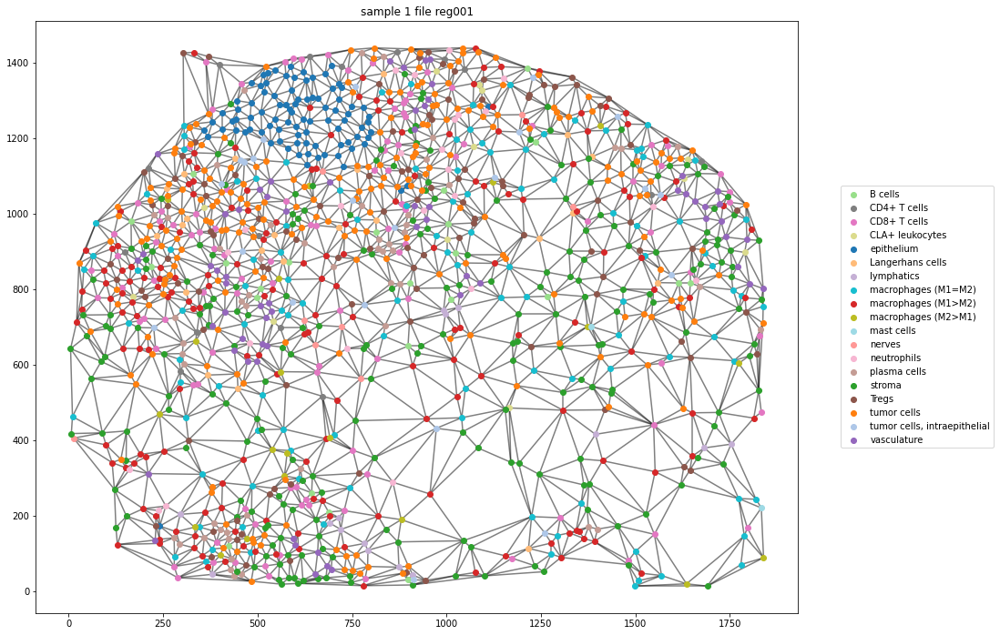

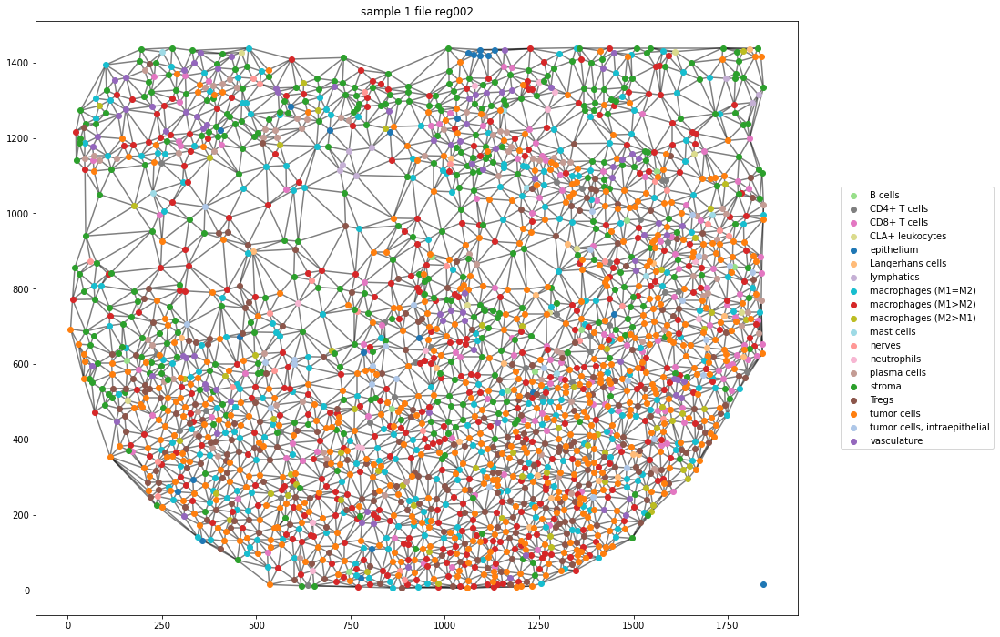

In [16]:
sample_id = 1  # that's our patient
select_sample = obj['Patients'] == sample_id
filenames = obj.loc[select_sample, 'FileName'].unique()  # look for the several samples per patient
for filename in filenames:
    print("processing filename {}".format(filename))
    select_file = obj['FileName'] == filename
    nodes = obj.loc[select_sample & select_file, all_cols]
    coords = nodes[cell_pos_cols].values
    pairs = ty.build_delaunay(coords, trim_dist=200)
    # we want to avoid isolated cells, so we link them to their 2 closest neighbors
    # pairs = ty.link_solitaries(coords, pairs, method='knn', k=2)

    fig, ax = ty.plot_network(coords, pairs, labels=nodes['ClusterName'],
                              color_mapper=celltypes_color_mapper, 
                              legend_opt={'loc': 'center left', 'bbox_to_anchor': (1.05, 0.5)})
    plt.title("sample {} file {}".format(sample_id, filename))

### All samples network reconstruction

#### Plot spatial networks

In [19]:
processed_dir = Path('../data/processed/CODEX_CTCL')
dir_fig_save = processed_dir / 'figures'

In [20]:
# Choose optimal distances
save_dir = processed_dir / "pretreatment_samples_networks_xy_solitary-0_choose_distance"

files_dst = [
    "reg001",
    "reg003",
    "reg005",
    "reg006",
    "reg037",
    "reg040",
    "reg042",
    "reg051",
    "reg054",
    "reg055",
    "reg016",
    "reg058",
    "reg060",
    "reg019",
]

k_sol = 0 

if RUN_LONG:
    for filename in files_dst:
        print("    processing filename {}".format(filename))
        select_file = obj['FileName'] == filename
        nodes = obj.loc[select_file, all_cols]
        coords = nodes[cell_pos_cols].values
        pairs = ty.build_delaunay(coords, trim_dist=200)
        print("    ", end="")
        if k_sol > 0:
            pairs = ty.link_solitaries(coords, pairs, method='knn', k=k_sol)
        distances = ty.distance_neighbors(coords, pairs)

        fig, ax = ty.plot_network_distances(
            coords, pairs, distances, labels=nodes['ClusterName'],
            legend_opt={'loc': 'center left', 'bbox_to_anchor': (1.05, 0.5)}
            )
        plt.axis('off');
        title = f"network_distances_filename-{filename}"
        plt.savefig(str(save_dir / title) + '.png', bbox_inches='tight', facecolor='white')
        plt.show()

In [21]:
trim_dist = 200 # or 'percentile_size'
k_sol = 0 # or 1, 2, 3, ...
reconst_dir = processed_dir / f"pretreatment_samples_networks_xy_trim_dist-{trim_dist}_solitary-{k_sol}"
save_dir = reconst_dir / "networks_images_common_cmap_saturated_first"

if not os.path.exists(save_dir):
    os.makedirs(save_dir)

In [22]:
if RUN_LONG:
    for sample_id in obj['Patients'].unique():
        print(f"processing sample {sample_id}")
        select_sample = obj['Patients'] == sample_id
        filenames = obj.loc[select_sample, 'FileName'].unique()
        for filename in filenames:
            print("    processing filename {}".format(filename))
            select_file = obj['FileName'] == filename
            nodes = obj.loc[select_sample & select_file, all_cols]
            coords = nodes[cell_pos_cols].values
            pairs = ty.build_delaunay(coords, trim_dist=trim_dist)
            print("    ", end="")
            if k_sol > 0:
                pairs = ty.link_solitaries(coords, pairs, method='knn', k=k_sol)

            fig, ax = ty.plot_network(coords, pairs, labels=nodes['ClusterName'],
                                      color_mapper=celltypes_color_mapper, 
                                      legend_opt={'loc': 'center left', 'bbox_to_anchor': (1.05, 0.5)})
            plt.axis('off');
            title = f"sample-{sample_id}_filename-{filename}_network_delaunay"
            plt.savefig(str(save_dir / title) + '.png', bbox_inches='tight', facecolor='white')
            plt.show()

#### Merge all samples

In [23]:
if RUN_LONG:
    edges_all = pd.DataFrame(data=None, columns=['source', 'target'])
    # number of nodes previously seen
    nb_nodes = 0
    for sample_id in obj['Patients'].unique():
        print(f"processing sample {sample_id}")
        select_sample = obj['Patients'] == sample_id
        filenames = obj.loc[select_sample, 'FileName'].unique()
        for filename in filenames:
            print("    processing filename {}".format(filename))
            select_file = obj['FileName'] == filename
            nodes = obj.loc[select_sample & select_file, all_cols]
            coords = nodes[cell_pos_cols].values
            pairs = ty.build_delaunay(coords, trim_dist=trim_dist)
            # print("    ", end="")
            if k_sol > 0:
                pairs = ty.link_solitaries(coords, pairs, method='knn', k=k_sol)

            # increase ids in pairs by the number of nodes in all previously loaded networks
            pairs = pairs + nb_nodes
            edges = pd.DataFrame(data=pairs, columns=['source', 'target'])
            edges['filename'] = filename
            # update number of nodes for next network
            nb_nodes = nb_nodes + coords.shape[0]
            edges_all = pd.concat([edges_all, edges], ignore_index=True)
    edges_all.to_csv(reconst_dir / 'sample_all-edges.csv', index=False)
else:
    edges_all = pd.read_csv(reconst_dir / 'sample_all-edges.csv')

In [24]:
# or save in separate file for convenience
if RUN_LONG:
    for sample_id in obj['Patients'].unique():
        print(f"processing sample {sample_id}")
        select_sample = obj['Patients'] == sample_id
        filenames = obj.loc[select_sample, 'FileName'].unique()
        for filename in filenames:
            print("    processing filename {}".format(filename))
            select_file = obj['FileName'] == filename
            nodes = obj.loc[select_sample & select_file, all_cols]
            coords = nodes[cell_pos_cols].values
            pairs = ty.build_delaunay(coords, trim_dist=trim_dist)
            print("    ", end="")
            if k_sol > 0:
                pairs = ty.link_solitaries(coords, pairs, method='knn', k=k_sol)

            edges = pd.DataFrame(data=pairs, columns=['source', 'target'])
            edges.to_csv(reconst_dir / f'edges_sample-{filename}.csv', index=False)

## Response groups characteristics and survival analysis

We will look at what variables define or explain response to therapy or longer survival.  
For this, we will start with the simplest statistics, like proportions of cell types or marker-positive cells, and we will gradulally increase the complexity of variables, looking at interactions between cell types and finally discovering spatial neighborhoods, potentially predictive of response to therapy.

### Cell types proportions

In [25]:
# we add attributes to nodes to color network figures
nodes_all = obj[cell_pos_cols].copy()
nodes_all['CellCluster'] = obj['ClusterName'].values
nodes_all = nodes_all.join(pd.get_dummies(obj['ClusterName']))
attribute_uniq = nodes_all['CellCluster'].unique()

In [26]:
# here we don't use `FileName` in the group / unstack procedure to aggregate statistics 
# per patient and condition (before / after treatment) rather than per sample.

count_types = obj[['Patients', 'Groups', 'Count']].join(nodes_all['CellCluster']).groupby(['Patients', 'Groups', 'CellCluster']).count().unstack()
count_types.columns = count_types.columns.droplevel()
count_types = count_types.fillna(value=0).astype(int)
# count_types.index.name = 'sample'
count_types.to_csv(save_dir / 'count_types_per_patient_per_condition.csv')
count_types.head(6)

,CellCluster,B cells,CD4+ T cells,CD8+ T cells,CLA+ leukocytes,"DCs, CD11c+",IDO+ stromal cells,Langerhans cells,Tregs,epithelium,lymphatics,...,macrophages (M1>M2),macrophages (M2>M1),mast cells,nerves,neutrophils,plasma cells,stroma,tumor cells,"tumor cells, intraepithelial",vasculature
Patients,Groups,,,,,,,,,,,,,,,,,,,,,
1,1,34,50,229,20,0,0,42,350,112,23,...,545,83,9,33,36,133,582,777,48,149
2,1,6,3,5,3,0,0,12,15,6,5,...,71,64,3,6,1,4,203,155,2,95
3,2,2,208,186,14,0,2,130,99,1759,24,...,397,39,33,17,0,4,328,546,274,86
4,2,178,20,45,0,0,0,16,9,901,7,...,202,10,12,9,0,4,356,987,5,186
5,1,0,0,1,0,0,0,5,6,913,0,...,17,2,2,3,0,1,34,7,1,18
6,2,83,200,693,15,0,3,95,357,11,102,...,809,43,20,5,26,35,679,1157,22,255


Instead of counts we use proportions of cell types per patient and condition.

In [27]:
prop_types = count_types.div(count_types.sum(axis=1), axis=0)
prop_types

,CellCluster,B cells,CD4+ T cells,CD8+ T cells,CLA+ leukocytes,"DCs, CD11c+",IDO+ stromal cells,Langerhans cells,Tregs,epithelium,lymphatics,...,macrophages (M1>M2),macrophages (M2>M1),mast cells,nerves,neutrophils,plasma cells,stroma,tumor cells,"tumor cells, intraepithelial",vasculature
Patients,Groups,,,,,,,,,,,,,,,,,,,,,
1,1,0.009379,0.013793,0.063172,0.005517,0.000000,0.000000,0.011586,0.096552,0.030897,0.006345,...,0.150345,0.022897,0.002483,0.009103,0.009931,0.036690,0.160552,0.214345,0.013241,0.041103
2,1,0.008392,0.004196,0.006993,0.004196,0.000000,0.000000,0.016783,0.020979,0.008392,0.006993,...,0.099301,0.089510,0.004196,0.008392,0.001399,0.005594,0.283916,0.216783,0.002797,0.132867
3,2,0.000465,0.048327,0.043216,0.003253,0.000000,0.000465,0.030204,0.023002,0.408690,0.005576,...,0.092240,0.009061,0.007667,0.003950,0.000000,0.000929,0.076208,0.126859,0.063662,0.019981
4,2,0.058649,0.006590,0.014827,0.000000,0.000000,0.000000,0.005272,0.002965,0.296870,0.002306,...,0.066557,0.003295,0.003954,0.002965,0.000000,0.001318,0.117298,0.325206,0.001647,0.061285
5,1,0.000000,0.000000,0.000984,0.000000,0.000000,0.000000,0.004921,0.005906,0.898622,0.000000,...,0.016732,0.001969,0.001969,0.002953,0.000000,0.000984,0.033465,0.006890,0.000984,0.017717
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10,1,0.002754,0.005507,0.028718,0.000000,0.000000,0.000000,0.007081,0.042486,0.291503,0.010228,...,0.125492,0.011408,0.007868,0.003147,0.001574,0.001180,0.162864,0.064516,0.001967,0.123131
11,1,0.001342,0.006711,0.014765,0.000000,0.000671,0.000000,0.014765,0.053691,0.306040,0.004698,...,0.065101,0.029530,0.024832,0.004027,0.000000,0.000000,0.195302,0.117450,0.011409,0.095973
12,2,0.005878,0.018001,0.039309,0.001837,0.000000,0.000735,0.020206,0.059882,0.316312,0.008450,...,0.100661,0.008450,0.004409,0.005143,0.000735,0.001470,0.072741,0.212344,0.042983,0.038942


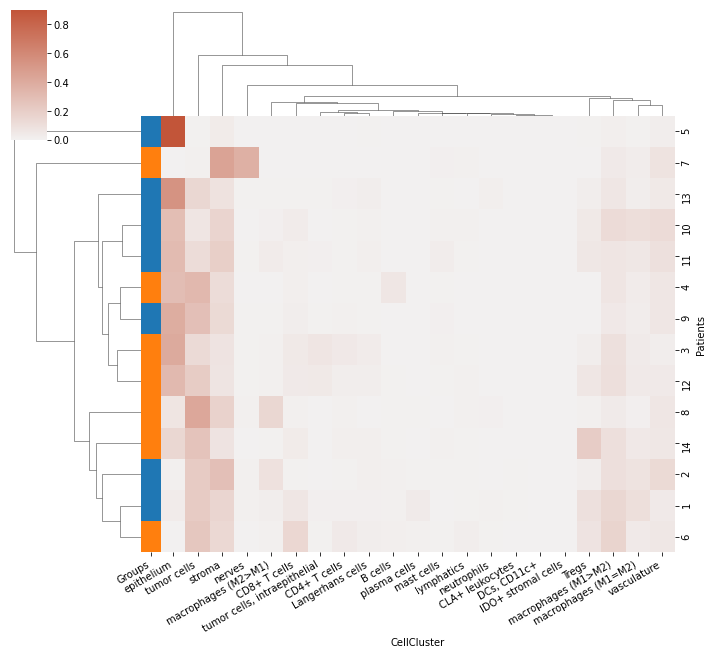

In [28]:
g = mosna.plot_heatmap(
    prop_types.reset_index(), 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    z_score=None,
    )

Because some variables have generally higher values than others, that give them more weight to compare samples.  
To compensate for this effect we should standardize values per variable.

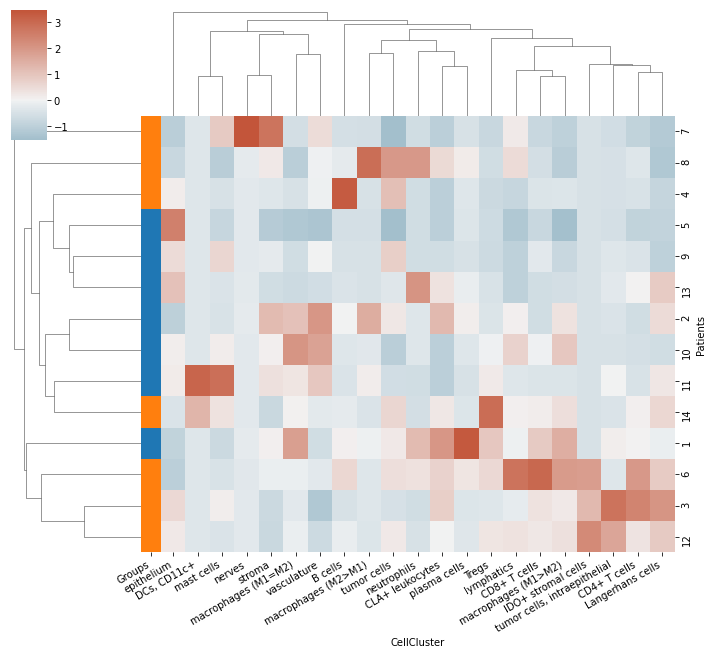

In [29]:
g = mosna.plot_heatmap(
    prop_types.reset_index(), 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    z_score=1,
    )

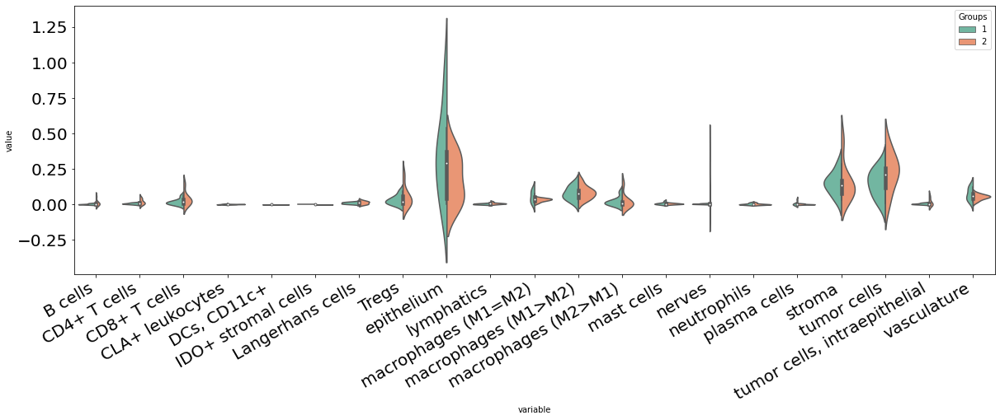

In [30]:
fig, ax = mosna.plot_distrib_groups(
    prop_types, 
    group_var='Groups',
    groups=[1, 2], 
    # pval_data=pvals, 
    # pval_col='pval', 
    max_cols=20, 
    multi_ind_to_col=True,
    )

In [31]:
prop_types

,CellCluster,B cells,CD4+ T cells,CD8+ T cells,CLA+ leukocytes,"DCs, CD11c+",IDO+ stromal cells,Langerhans cells,Tregs,epithelium,lymphatics,...,macrophages (M1>M2),macrophages (M2>M1),mast cells,nerves,neutrophils,plasma cells,stroma,tumor cells,"tumor cells, intraepithelial",vasculature
Patients,Groups,,,,,,,,,,,,,,,,,,,,,
1,1,0.009379,0.013793,0.063172,0.005517,0.000000,0.000000,0.011586,0.096552,0.030897,0.006345,...,0.150345,0.022897,0.002483,0.009103,0.009931,0.036690,0.160552,0.214345,0.013241,0.041103
2,1,0.008392,0.004196,0.006993,0.004196,0.000000,0.000000,0.016783,0.020979,0.008392,0.006993,...,0.099301,0.089510,0.004196,0.008392,0.001399,0.005594,0.283916,0.216783,0.002797,0.132867
3,2,0.000465,0.048327,0.043216,0.003253,0.000000,0.000465,0.030204,0.023002,0.408690,0.005576,...,0.092240,0.009061,0.007667,0.003950,0.000000,0.000929,0.076208,0.126859,0.063662,0.019981
4,2,0.058649,0.006590,0.014827,0.000000,0.000000,0.000000,0.005272,0.002965,0.296870,0.002306,...,0.066557,0.003295,0.003954,0.002965,0.000000,0.001318,0.117298,0.325206,0.001647,0.061285
5,1,0.000000,0.000000,0.000984,0.000000,0.000000,0.000000,0.004921,0.005906,0.898622,0.000000,...,0.016732,0.001969,0.001969,0.002953,0.000000,0.000984,0.033465,0.006890,0.000984,0.017717
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10,1,0.002754,0.005507,0.028718,0.000000,0.000000,0.000000,0.007081,0.042486,0.291503,0.010228,...,0.125492,0.011408,0.007868,0.003147,0.001574,0.001180,0.162864,0.064516,0.001967,0.123131
11,1,0.001342,0.006711,0.014765,0.000000,0.000671,0.000000,0.014765,0.053691,0.306040,0.004698,...,0.065101,0.029530,0.024832,0.004027,0.000000,0.000000,0.195302,0.117450,0.011409,0.095973
12,2,0.005878,0.018001,0.039309,0.001837,0.000000,0.000735,0.020206,0.059882,0.316312,0.008450,...,0.100661,0.008450,0.004409,0.005143,0.000735,0.001470,0.072741,0.212344,0.042983,0.038942


        training failed, trying with cv = 6
        training failed with cv <= 5
Training took {duration}s


<Figure size 432x288 with 0 Axes>

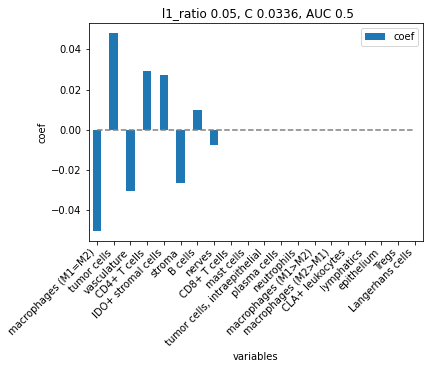

<Figure size 432x288 with 0 Axes>

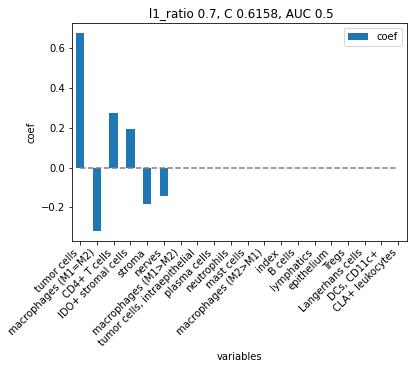

In [32]:
models = mosna.logistic_regression(
    prop_types.reset_index(),
    y_name='Groups',
    col_drop=['Patients'],
    cv_max=5,
    )

#### Descriptive statistics

##### First order

In [33]:
pvals = mosna.find_DE_markers(prop_types, group_ref=1, group_tgt=2, group_var='Groups', composed_vars=False)
pvals

,pval,pval_corr
IDO+ stromal cells,0.075413,0.988974
lymphatics,0.128205,0.988974
CD4+ T cells,0.141282,0.988974
tumor cells,0.259324,0.996411
epithelium,0.317599,0.996411
...,...,...
plasma cells,0.897879,0.996411
"tumor cells, intraepithelial",0.901515,0.996411
mast cells,0.901515,0.996411
"DCs, CD11c+",1.000000,1.000000


Cell types proportions are not significantly associated with response / non response in samples before treatment.  
But `mosna` can find composed variables potentially related to response of patients:

In [34]:
# `find_DE_markers` can make composite variables, but we do it beforehand to reuse them
prop_types_comp = pd.concat([prop_types, mosna.make_composed_variables(prop_types, order=1)], axis=1)
pvals = mosna.find_DE_markers(prop_types_comp, group_ref=1, group_tgt=2, group_var='Groups')

In [35]:
pvals.head(20)

,pval,pval_corr
[lymphatics / macrophages (M1=M2)],0.004079,0.696813
[lymphatics / vasculature],0.026224,0.696813
[lymphatics / macrophages (M2>M1)],0.040692,0.696813
[tumor cells / vasculature],0.053030,0.696813
[IDO+ stromal cells / epithelium],0.053349,0.696813
...,...,...
[B cells / IDO+ stromal cells],0.074010,0.696813
[IDO+ stromal cells / macrophages (M1=M2)],0.075413,0.696813
[IDO+ stromal cells / stroma],0.075413,0.696813
[IDO+ stromal cells / nerves],0.075413,0.696813


#### Visualization

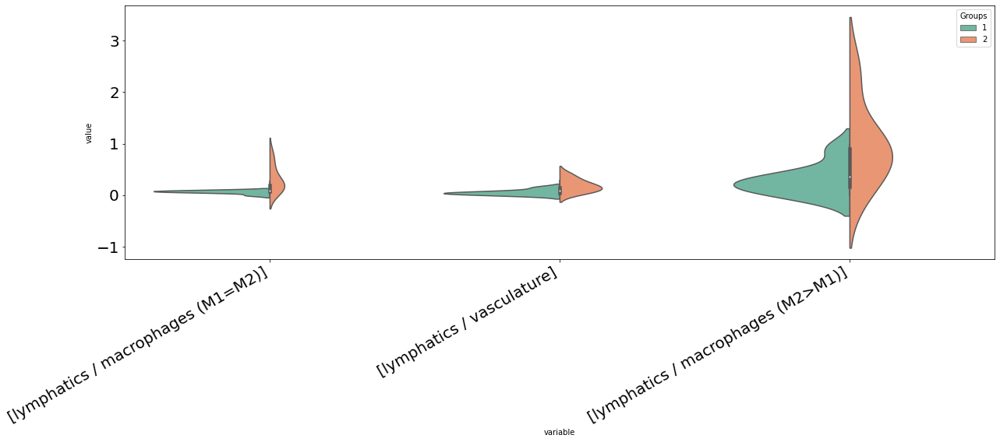

In [36]:
fig, ax = mosna.plot_distrib_groups(
    prop_types_comp, 
    group_var='Groups',
    groups=[1, 2], 
    pval_data=pvals, 
    pval_col='pval', 
    max_cols=20, 
    multi_ind_to_col=True,
    )

In [144]:
# we need to clean-up data for further analyses and visualizations
prop_types_comp_cleaned, select_finite = mosna.clean_data(
    prop_types_comp, 
    method='mixed',
    thresh=0.9,
    )

There are 315 non finite values
Imputing data


In [145]:
pvals_cleaned = mosna.find_DE_markers(prop_types_comp_cleaned, group_ref=1, group_tgt=2, group_var='Groups')
pvals_cleaned.head(10)

,pval,pval_corr
[lymphatics / macrophages (M1=M2)],0.004079,0.829539
[lymphatics / vasculature],0.026224,0.829539
[IDO+ stromal cells / Tregs],0.030721,0.829539
[IDO+ stromal cells / epithelium],0.030721,0.829539
[IDO+ stromal cells / macrophages (M2>M1)],0.030721,0.829539
"[IDO+ stromal cells / tumor cells, intraepithelial]",0.030721,0.829539
[tumor cells / vasculature],0.053030,0.829539
[lymphatics / macrophages (M2>M1)],0.055017,0.829539
[lymphatics / stroma],0.072844,0.829539
[CD4+ T cells / macrophages (M2>M1)],0.072844,0.829539


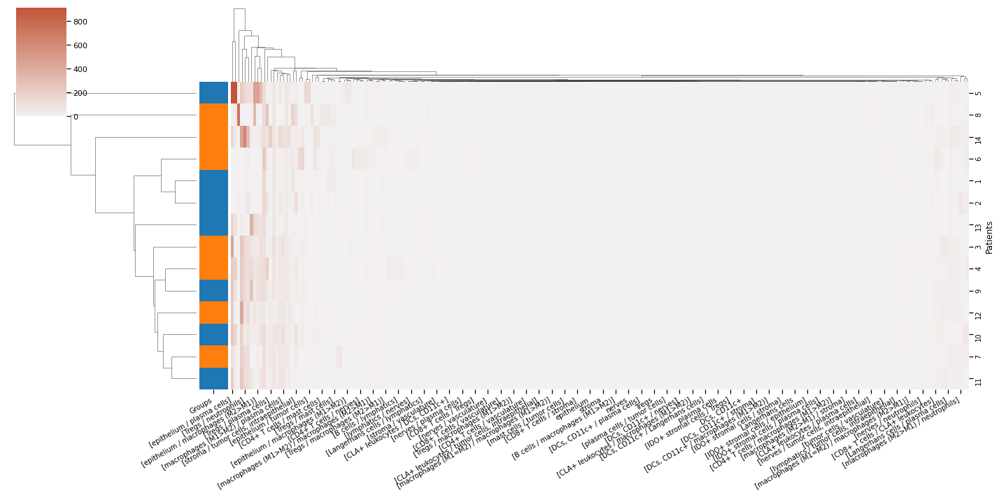

In [146]:
# or to select only 20 variables:
# best_pval_names = pvals.head(20).index
mosna.plot_heatmap(
    prop_types_comp_cleaned.reset_index(), 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    z_score=None,
    figsize=(20, 12),
    )

In [37]:
# We can't display the dendrogram with values normalized per variable, as some non finite values are produced and make seaborn crash.  

# best_pval_names = pvals_cleaned.loc[pvals_cleaned['pval'] < 0.05, :].index
# # or to select only 20 variables:
# # best_pval_names = pvals.head(20).index
# mosna.plot_heatmap(
#     prop_types_comp_cleaned.reset_index(), 
#     obs_labels='Patients', 
#     group_var='Groups', 
#     groups=[1, 2],
#     z_score=1,
#     figsize=(20, 12),
#     )

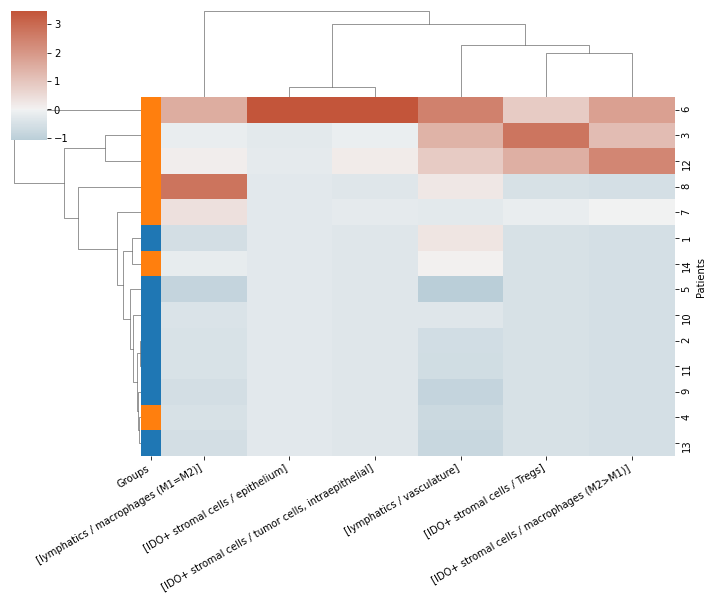

In [38]:
best_pval_names = pvals_cleaned.loc[pvals_cleaned['pval'] < 0.05, :].index
# or to select only 20 variables:
# best_pval_names = pvals.head(20).index
mosna.plot_heatmap(
    prop_types_comp_cleaned[best_pval_names].reset_index(), 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    z_score=1,
    figsize=(10, 10),
    )

Training took {duration}s


<Figure size 432x288 with 0 Axes>

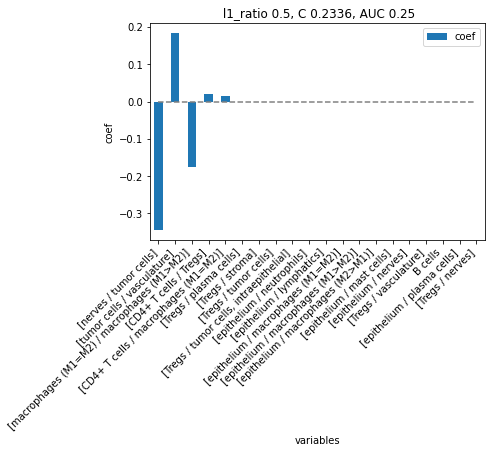

<Figure size 432x288 with 0 Axes>

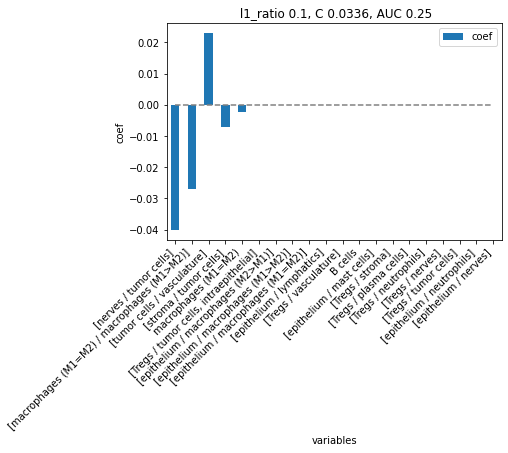

<Figure size 432x288 with 0 Axes>

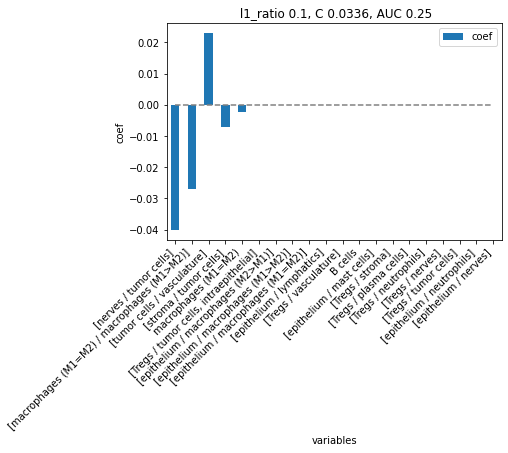

In [39]:
models = mosna.logistic_regression(
    prop_types_comp_cleaned,
    y_name='Groups',
    col_drop=['Patients'],
    )

Training took {duration}s


<Figure size 432x288 with 0 Axes>

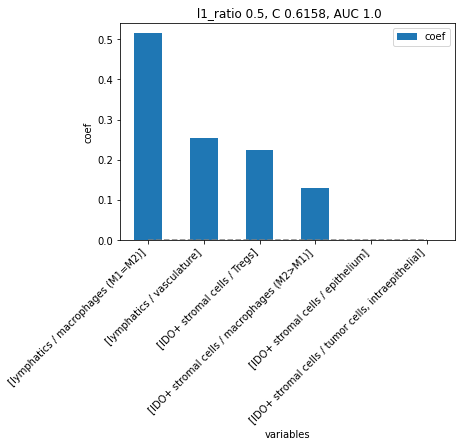

<Figure size 432x288 with 0 Axes>

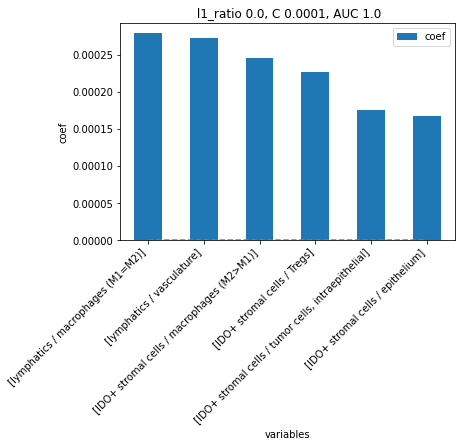

<Figure size 432x288 with 0 Axes>

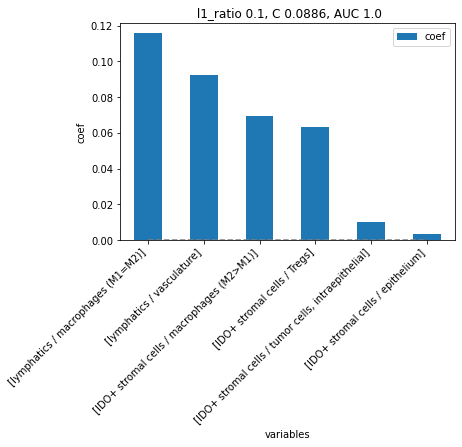

In [40]:
models = mosna.logistic_regression(
    prop_types_comp_cleaned[best_pval_names],
    y_name='Groups',
    col_drop=['Patients'],
    )

##### Second order

In [158]:
reload(mosna)
# `find_DE_markers` can make composite variables, but we do it beforehand to reuse them
prop_types_comp = pd.concat([prop_types, mosna.make_composed_variables(prop_types, order=2)], axis=1)
pvals = mosna.find_DE_markers(prop_types_comp, group_ref=1, group_tgt=2, group_var='Groups')

In [159]:
pvals.head(20)

,pval,pval_corr
[[lymphatics / macrophages (M1=M2)] / [macrophages (M1=M2) / macrophages (M1>M2)]],0.000583,0.627708
[[lymphatics / mast cells] / [macrophages (M2>M1) / tumor cells]],0.002331,0.627708
[[lymphatics / macrophages (M2>M1)] / [mast cells / tumor cells]],0.002331,0.627708
[[lymphatics / macrophages (M2>M1)] / [macrophages (M1=M2) / tumor cells]],0.002331,0.627708
[[lymphatics / macrophages (M1=M2)] / [macrophages (M2>M1) / tumor cells]],0.002331,0.627708
[[Tregs / lymphatics] / [lymphatics / stroma]],0.004079,0.627708
[[Langerhans cells / lymphatics] / [Langerhans cells / macrophages (M1=M2)]],0.004079,0.627708
[[lymphatics / vasculature] / [macrophages (M1=M2) / vasculature]],0.004079,0.627708
[lymphatics / macrophages (M1=M2)],0.004079,0.627708
[[lymphatics / stroma] / [macrophages (M1=M2) / stroma]],0.004079,0.627708


In [160]:
(pvals['pval'] < 0.05).sum()

273

The first variables related to cell types proportions are composed variables of the 2nd order (ratio of ratios), only `lymphatics / macrophages (M1=M2)` appear in the simpler composed variables, but all corrected pvalues are > 0.05. This is because mosna produced *a lot* of composed variables.

#### Visualization

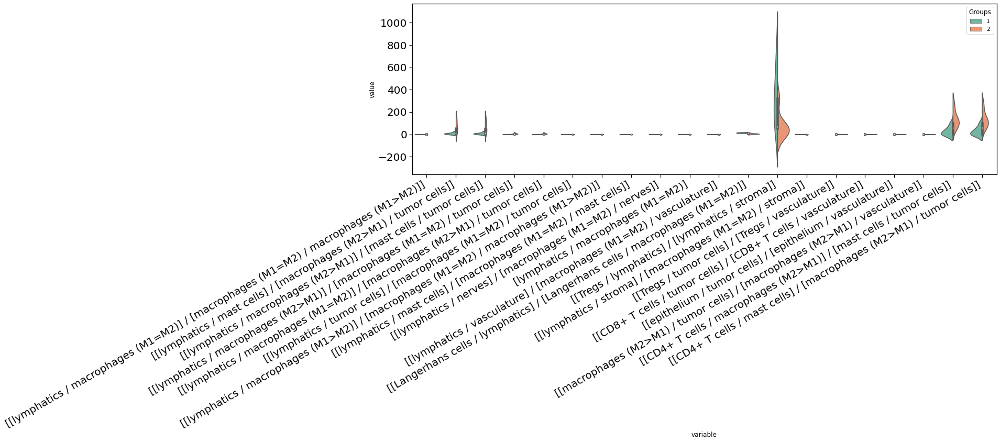

In [161]:
fig, ax = mosna.plot_distrib_groups(
    prop_types_comp, 
    group_var='Groups',
    groups=[1, 2], 
    pval_data=pvals, 
    pval_col='pval', 
    max_cols=20, 
    multi_ind_to_col=True,
    )

Some variables hide the distribution of other variables by their much larger range, we can exclude them to better see the other variables:

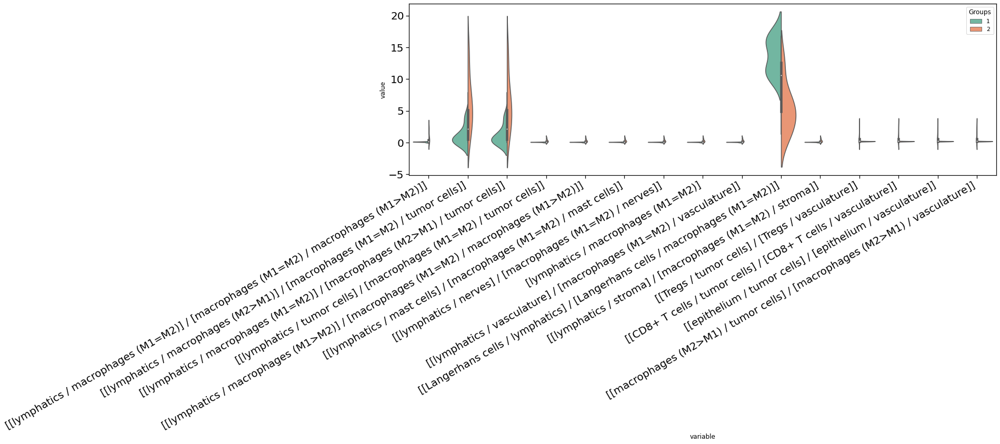

In [163]:
exclude_vars = [
    '[[lymphatics / macrophages (M2>M1)] / [mast cells / tumor cells]]',
    '[[lymphatics / mast cells] / [macrophages (M2>M1) / tumor cells]]',
    '[[Tregs / lymphatics] / [lymphatics / stroma]]',
    '[[CD4+ T cells / macrophages (M2>M1)] / [mast cells / tumor cells]]',
    '[[CD4+ T cells / mast cells] / [macrophages (M2>M1) / tumor cells]]',
]
fig, ax = mosna.plot_distrib_groups(
    prop_types_comp, 
    group_var='Groups',
    groups=[1, 2], 
    pval_data=pvals, 
    pval_col='pval', 
    max_cols=20, 
    multi_ind_to_col=True,
    exclude_vars=exclude_vars,
    )

There is no clear separation of patients into their respective groups from their proportions of cell types scaled across patients.

In [164]:
# we need to clean-up data for further analyses and visualizations
prop_types_comp_cleaned, select_finite = mosna.clean_data(
    prop_types_comp, 
    method='mixed',
    thresh=0.9,
    )

There are 82218 non finite values
Imputing data


In [165]:
pvals = mosna.find_DE_markers(prop_types_comp_cleaned, group_ref=1, group_tgt=2, group_var='Groups')
pvals = pvals.sort_values(by='pval', ascending=True)

In [166]:
(pvals['pval'] < 0.05).sum()

1054

In [167]:
pd.set_option('display.max_rows', None)
pvals.head(50)

,pval,pval_corr
[[lymphatics / macrophages (M1=M2)] / [macrophages (M1=M2) / macrophages (M1>M2)]],0.000583,0.570561
[[CD8+ T cells / macrophages (M1=M2)] / [CLA+ leukocytes / lymphatics]],0.001166,0.570561
[[lymphatics / plasma cells] / [macrophages (M1=M2) / tumor cells]],0.002331,0.570561
[[CD8+ T cells / plasma cells] / [mast cells / tumor cells]],0.002331,0.570561
[[lymphatics / mast cells] / [plasma cells / tumor cells]],0.002331,0.570561
[[CLA+ leukocytes / lymphatics] / [CLA+ leukocytes / macrophages (M1=M2)]],0.002331,0.570561
[[CD8+ T cells / mast cells] / [plasma cells / tumor cells]],0.002331,0.570561
[[lymphatics / plasma cells] / [mast cells / tumor cells]],0.002331,0.570561
[[lymphatics / macrophages (M1=M2)] / [plasma cells / tumor cells]],0.002331,0.570561
[[lymphatics / macrophages (M2>M1)] / [mast cells / tumor cells]],0.004079,0.570561


In [168]:
pd.set_option('display.max_rows', 10)

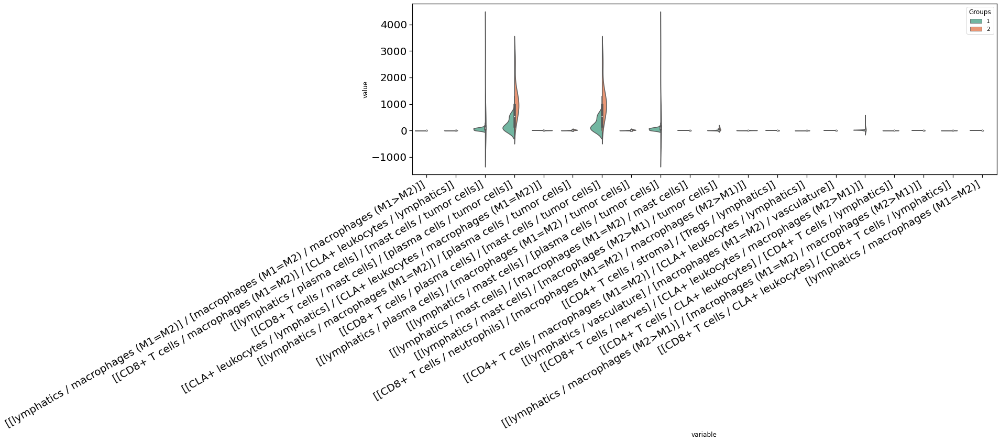

In [169]:
fig, ax = mosna.plot_distrib_groups(
    prop_types_comp_cleaned, 
    group_var='Groups',
    groups=[1, 2], 
    pval_data=pvals, 
    pval_col='pval', 
    max_cols=20, 
    multi_ind_to_col=True,
    )

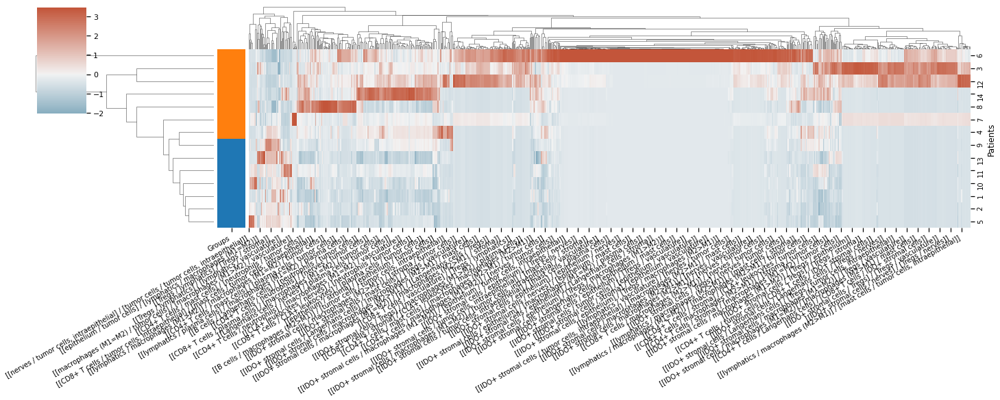

In [170]:
best_pval_names = pvals.loc[pvals['pval'] < 0.05, :].index
# or to select only 20 variables:
# best_pval_names = pvals.head(20).index
mosna.plot_heatmap(
    prop_types_comp_cleaned[best_pval_names].reset_index(), 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    z_score=1,
    figsize=(20, 12),
    )

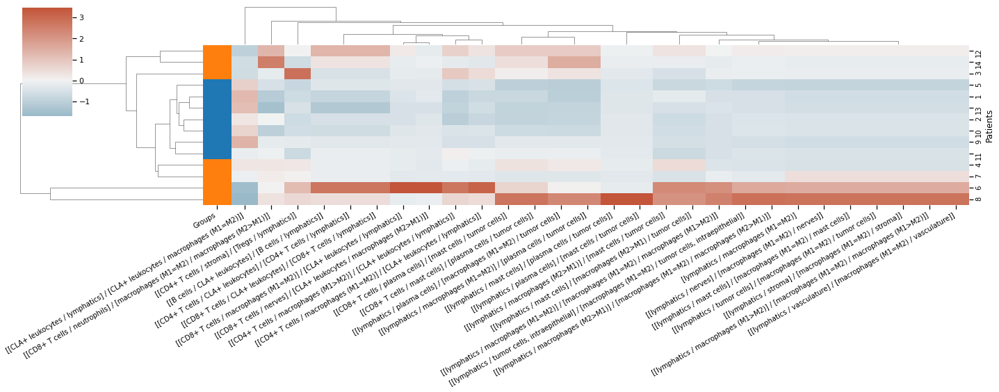

In [171]:
best_pval_names = pvals.loc[pvals['pval'] < 0.005, :].index
# or to select only 20 variables:
# best_pval_names = pvals.head(40).index
mosna.plot_heatmap(
    prop_types_comp_cleaned[best_pval_names].reset_index(), 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    z_score=1,
    figsize=(20, 12),
    )

By selecting the variables with p-values under 5%, although their corresponding corrected p-values are not significant, we can notice a much better separation between patients groups.  
We must be careful though: we have computed a lot of composed variables, and selected those who happened to have the best p-values.

#### Stepwise logistic regression

In [75]:
best_pval_names = pvals.loc[pvals['pval'] < 0.05, :].index.tolist()
model, included = mosna.stepwise_regression(X=prop_types_comp_cleaned, y_name='Groups', y_values=[1, 2], col_names=best_pval_names, verbose=True)

Add  [[CLA+ leukocytes / lymphatics] / [CLA+ leukocytes / macrophages (M1=M2)]] with p-value 0.00080986
Add  [[Tregs / tumor cells] / [lymphatics / macrophages (M2>M1)]] with p-value 0.0138224
Add  [[CD8+ T cells / macrophages (M2>M1)] / [plasma cells / tumor cells]] with p-value 0.0119548
Add  [[CLA+ leukocytes / lymphatics] / [CLA+ leukocytes / vasculature]] with p-value 0.0144521
Drop [[CLA+ leukocytes / lymphatics] / [CLA+ leukocytes / macrophages (M1=M2)]] with p-value 0.0696199
Add  [[lymphatics / macrophages (M1=M2)] / [macrophages (M1=M2) / stroma]] with p-value 0.00138043
Add  [[Langerhans cells / lymphatics] / [Langerhans cells / vasculature]] with p-value 0.00530014
Add  [[CD4+ T cells / macrophages (M2>M1)] / [mast cells / tumor cells]] with p-value 0.0127448
Add  [[CD8+ T cells / lymphatics] / [lymphatics / macrophages (M2>M1)]] with p-value 0.00210904
Add  [[Tregs / tumor cells] / [lymphatics / stroma]] with p-value 0.00414586
Add  [[lymphatics / macrophages (M1=M2)] / [n

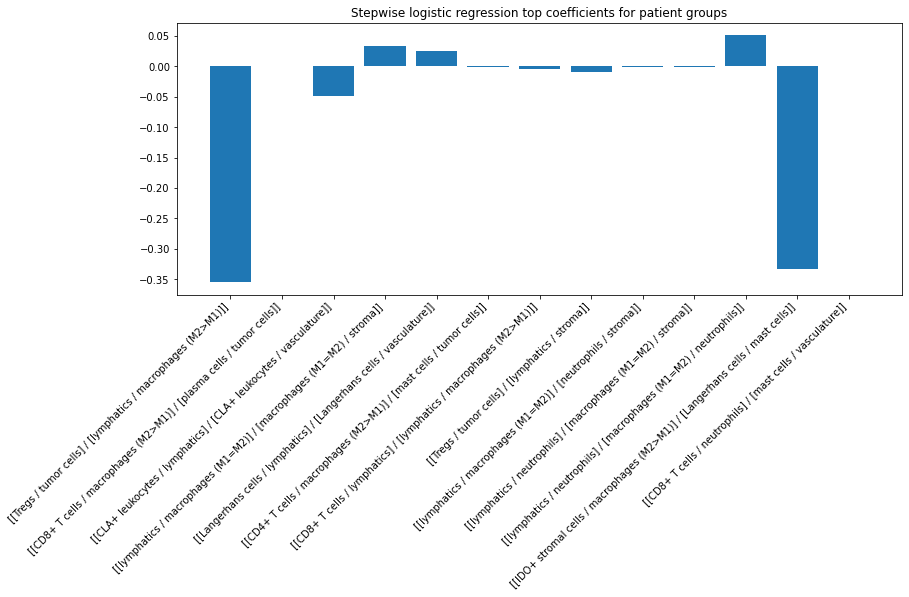

In [76]:
# plot the model's coefficients
coefs = model.params[1:] # skip intercept
nb_coefs = min(coefs.size, 20)
if nb_coefs > 0:
    fig, ax = plt.subplots(figsize=(nb_coefs,5))
    ax.bar(coefs.index, coefs)
    plt.xticks(rotation=45, ha='right');
    title = f"Stepwise logistic regression top coefficients for patient groups"
    plt.title(title)

In [77]:
# TODO: make scikit-learn model object
# result = permutation_importance(
#     model, X_test, y_test, n_repeats=10, random_state=0, n_jobs=8,
# )
# importances = pd.Series(result.importances_mean, index=prop_types_comp_cleaned.columns)


# Need to automatically extract variables from DataFrame and add constant to run prediction
# # y_pred_proba = model.predict_proba(X_test)[:, 1]
# y_pred = model.predict(X_test)
# score = {
#     # 'ROC AUC': metrics.roc_auc_score(y_test, y_pred_proba),
#     # 'AP' : metrics.average_precision_score(y_test, y_pred_proba),
#     'MCC': metrics.matthews_corrcoef(y_test, y_pred),
#     'balanced accuracy' : metrics.balanced_accuracy_score(y_test, y_pred),
#     'f1' : metrics.f1_score(y_test, y_pred, pos_label=1, average='binary'),
# }
# score

Training took {duration}s


<Figure size 432x288 with 0 Axes>

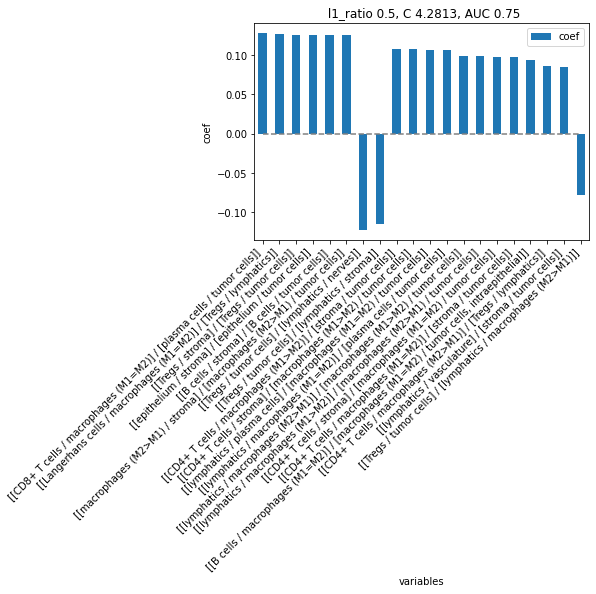

<Figure size 432x288 with 0 Axes>

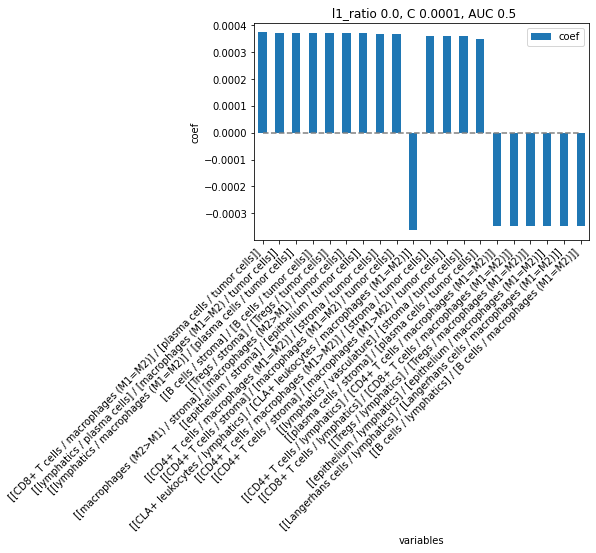

<Figure size 432x288 with 0 Axes>

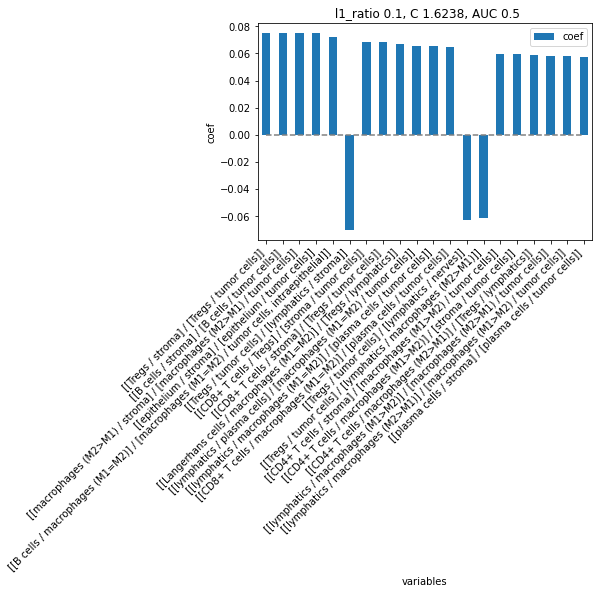

In [78]:
models = mosna.logistic_regression(
    prop_types_comp_cleaned[best_pval_names], 
    y_name='Groups',
    col_drop=['Patients'], 
    )

In [79]:
best_pval_names = pvals.loc[pvals['pval'] < 0.005, :].index

In [80]:
model, included = mosna.stepwise_regression(X=prop_types_comp_cleaned, y_name='Groups', y_values=[1, 2], col_names=best_pval_names, verbose=True)

Add  [[CLA+ leukocytes / lymphatics] / [CLA+ leukocytes / macrophages (M1=M2)]] with p-value 0.00080986


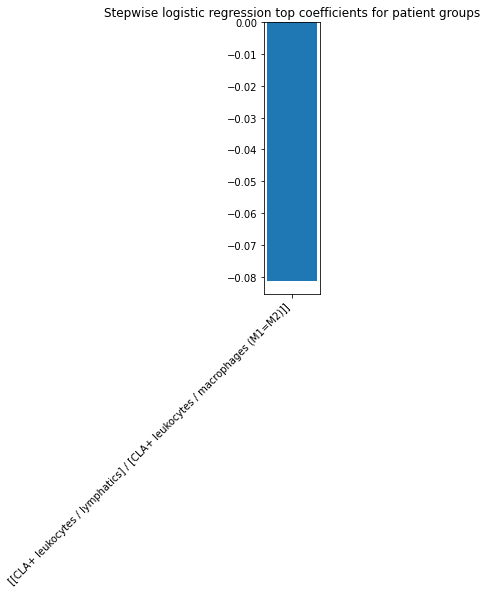

In [81]:
# plot the model's coefficients
coefs = model.params[1:] # skip intercept
nb_coefs = min(coefs.size, 20)
if nb_coefs > 0:
    fig, ax = plt.subplots(figsize=(nb_coefs,5))
    ax.bar(coefs.index, coefs)
    plt.xticks(rotation=45, ha='right');
    title = f"Stepwise logistic regression top coefficients for patient groups"
    plt.title(title)

Training took {duration}s


<Figure size 432x288 with 0 Axes>

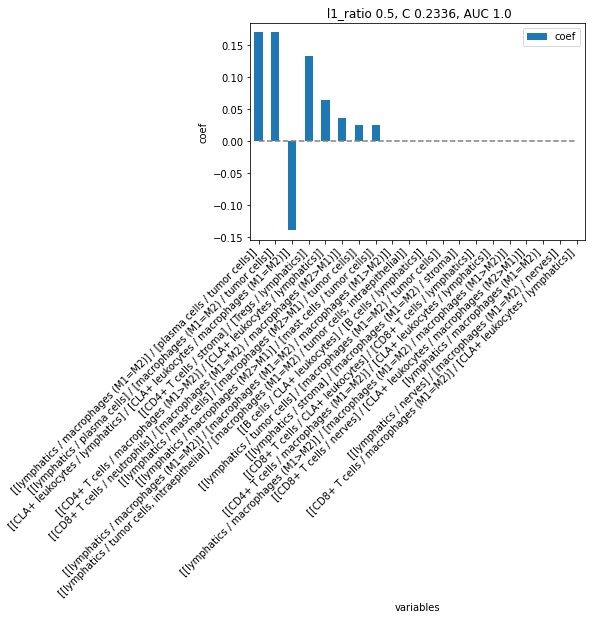

<Figure size 432x288 with 0 Axes>

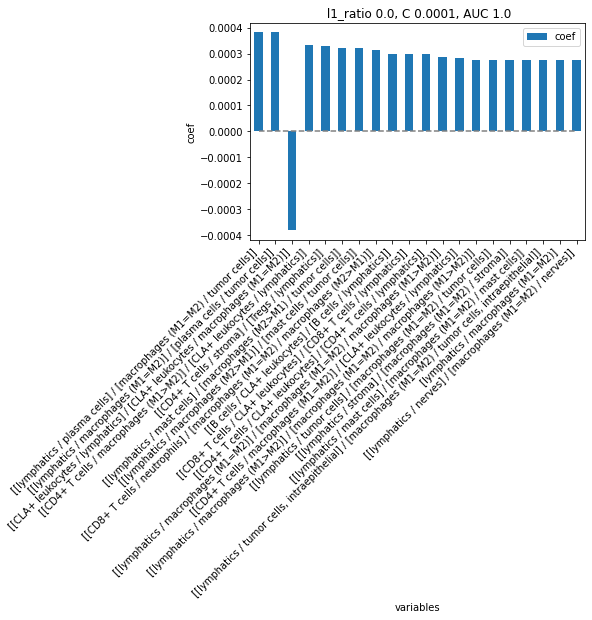

<Figure size 432x288 with 0 Axes>

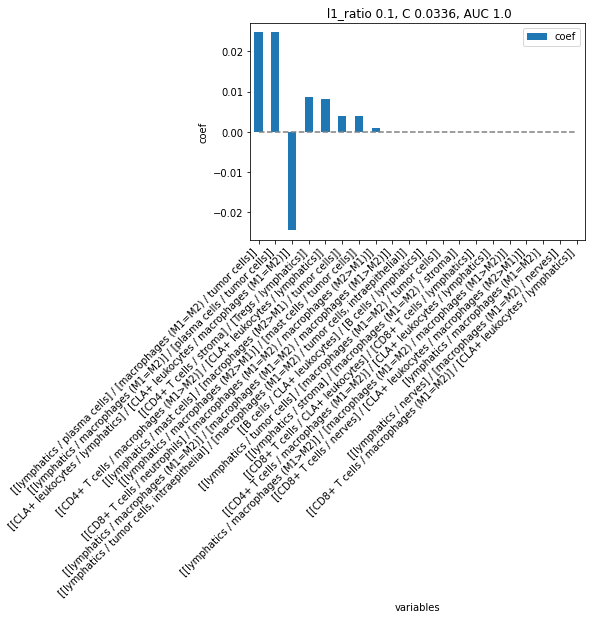

In [82]:
models = mosna.logistic_regression(
    prop_types_comp_cleaned[best_pval_names], 
    y_name='Groups',
    col_drop=['Patients'], 
    )

The first model has a perfect ROC AUC score.  
The second variable involves CD4 and Tregs, which are used in the authors' score to predict response to therapies.

#### Risk ratios

#### Survival analysis

### Marker-positive cells proportions

In [66]:
def highlight_under(s, thresh=0.05, color='darkorange'):
    '''
    highlight values that are under a threshold
    '''
    is_under = s <= thresh
    attr = 'background-color: {}'.format(color)
    return [attr if v else '' for v in is_under]

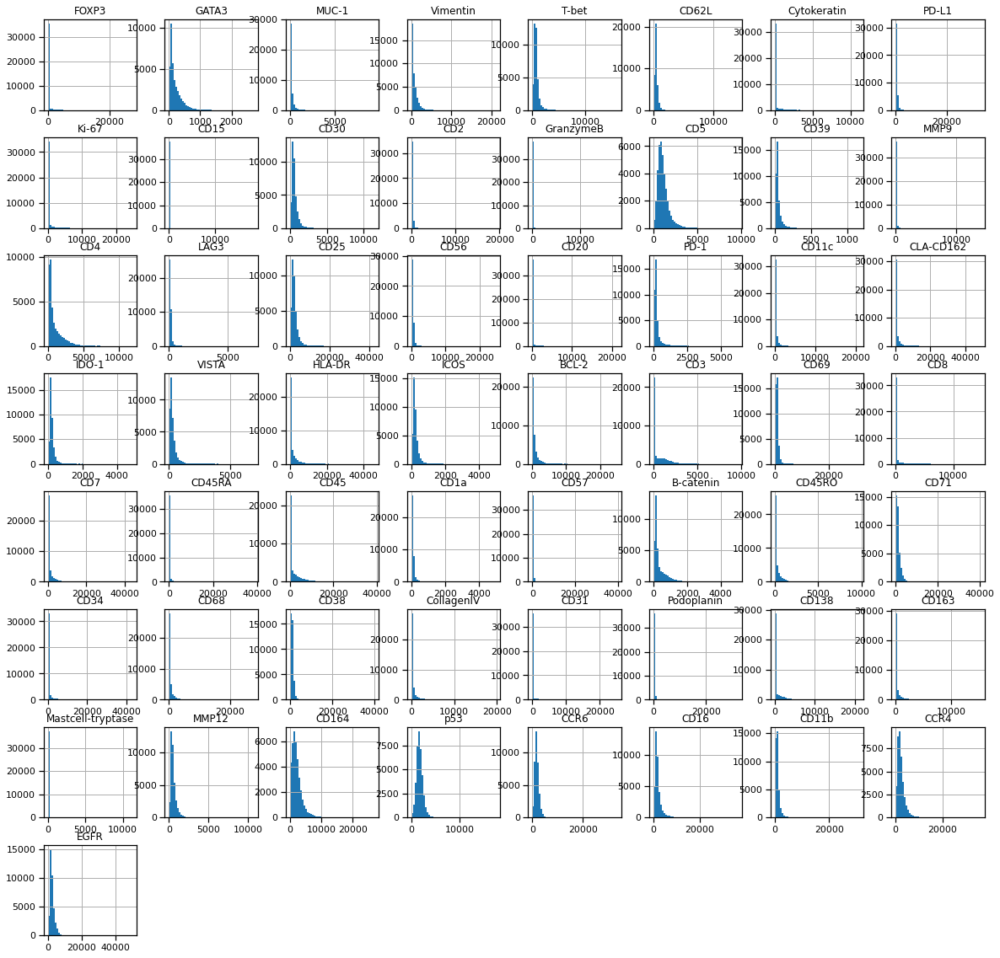

In [68]:
obj[marker_cols].hist(bins=50, figsize=(20, 20));

In [ ]:
marker_thresh = {
    'FOXP3',
    'GATA3',
    'MUC-1',
    'Vimentin',
    'T-bet',
    'CD62L',
    'Cytokeratin',
    'PD-L1',
    'Ki-67',
    'CD15',
    'CD30',
    'CD2',
    'GranzymeB',
    'CD5',
    'CD39',
    'MMP9',
    'CD4',
    'LAG3',
    'CD25',
    'CD56',
    'CD20',
    'PD-1',
    'CD11c',
    'CLA-CD162',
    'IDO-1',
    'VISTA',
    'HLA-DR',
    'ICOS',
    'BCL-2',
    'CD3',
    'CD69',
    'CD8',
    'CD7',
    'CD45RA',
    'CD45',
    'CD1a',
    'CD57',
    'B-catenin',
    'CD45RO',
    'CD71',
    'CD34',
    'CD68',
    'CD38',
    'CollagenIV',
    'CD31',
    'Podoplanin',
    'CD138',
    'CD163',
    'Mastcell-tryptase',
    'MMP12',
    'CD164',
    'p53',
    'CCR6',
    'CD16',
    'CD11b',
    'CCR4',
    'EGFR'
}

We have seen that cell types proportions don't explain response of patient to therapy. But maybe interactions between cell types play a role in response?  
To answer this question we will look at the *mixing matrix* and *assortativity* of tissue networks.  

## Cell types interactions

We compute cell types interactions per sample to aggregate latter per patient or condition.

###  Assortativity and Mixing Matrix

#### Computation of assortativity

In [83]:
grouping = 'FileName'
n_shuffle = 500
load_dir = reconst_dir
save_dir = load_dir / "assortativity"
filename = save_dir / f'network_interactions_stats_grouping-{grouping}_n_shuffle-{n_shuffle}.csv'

if RUN_LONG or not filename.exists():
    print("Computing z-scored assortativity")
    start = time()
    net_stats = mosna.batch_assort_mixmat(nodes_all, edges_all, 
                                    attributes=attribute_uniq, 
                                    groups=obj[grouping], 
                                    n_shuffle=n_shuffle,
                                    parallel_groups=False,
                                    memory_limit='100GB',
                                    save_intermediate_results=False, 
                                    dir_save_interm=save_dir)
    end = time()
    duration = end - start
    print(f"Assortativity took {duration}s for n_suffle {n_shuffle}")

    net_stats.index = net_stats['id']
    net_stats.drop(columns=['id'], inplace=True)

    if not os.path.exists(save_dir):
        os.makedirs(save_dir)
    net_stats.to_csv(filename)
else:
    print("Loading z-scored assortativity")
    net_stats = pd.read_csv(filename, index_col=0)

Loading z-scored assortativity


In [84]:
net_stats

,# total,% B cells,% CD4+ T cells,% CD8+ T cells,% CLA+ leukocytes,"% DCs, CD11c+",% epithelium,% IDO+ stromal cells,% Langerhans cells,% lymphatics,...,vasculature - macrophages (M2>M1) Z,vasculature - mast cells Z,vasculature - nerves Z,vasculature - neutrophils Z,vasculature - plasma cells Z,vasculature - stroma Z,vasculature - Tregs Z,vasculature - tumor cells Z,"vasculature - tumor cells, intraepithelial Z",vasculature - vasculature Z
id,,,,,,,,,,,,,,,,,,,,,
reg001,1301,0.017679,0.012298,0.082244,0.009224,0.0,0.069178,0.0,0.016910,0.011530,...,-1.549946,-0.508612,-0.969886,-1.717401,-2.302747,-5.030768,-3.364859,-4.921611,4.617037,30.524675
reg002,2324,0.004733,0.014630,0.052496,0.003442,0.0,0.009466,0.0,0.008606,0.003442,...,-2.386706,-0.735220,-1.505281,-1.103783,-2.390947,-5.118748,-4.635056,-6.358490,4.408911,34.495248
reg006,603,0.009950,0.004975,0.008292,0.004975,0.0,0.006633,0.0,0.019900,0.008292,...,-2.679097,-0.520487,-0.858949,-0.397250,-0.719195,-4.577619,-1.436174,-4.268267,-0.518298,21.647247
reg035,2053,0.000487,0.007306,0.014613,0.000974,0.0,0.500731,0.0,0.004384,0.000000,...,-0.781031,-1.563830,-0.543025,NaN,NaN,-4.633134,-0.985088,-8.573065,1.618052,25.689617
reg036,618,0.001618,0.006472,0.033981,0.000000,0.0,0.021036,0.0,0.003236,0.006472,...,-1.144622,-1.455334,-1.300634,NaN,NaN,-6.625174,-0.654349,-5.928589,NaN,15.272627
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
reg017,558,0.000000,0.000000,0.001792,0.000000,0.0,0.910394,0.0,0.005376,0.000000,...,-0.257600,-0.151831,-0.198749,NaN,NaN,-0.537285,-0.341667,-0.383833,-0.214535,6.674080
reg005,112,0.000000,0.000000,0.000000,0.000000,0.0,0.017857,0.0,0.000000,0.000000,...,-1.281009,-0.508607,NaN,NaN,NaN,-4.210659,NaN,-1.011409,NaN,5.123528
reg018,458,0.000000,0.000000,0.000000,0.000000,0.0,0.884279,0.0,0.004367,0.000000,...,NaN,-0.169725,-0.261488,NaN,-0.198749,-0.772891,-0.248685,-0.239522,NaN,5.298144


#### Example of Mixing Matrix

In [85]:
sample_id = 'reg001'
# TODO: reimplement the 'RAW' flag
# raw_cols = [x for x in net_stats.columns if x.endswith('RAW') and not x.startswith('assort')]
raw_cols = net_stats.iloc[:, 26:257].columns
z_cols = [x for x in net_stats.columns if x.endswith('Z') and not x.startswith('assort')]

mixmat_raw = mosna.series_to_mixmat(net_stats.loc[sample_id, raw_cols], discard=' RAW').astype(float)
mixmat_z = mosna.series_to_mixmat(net_stats.loc[sample_id, z_cols], discard=' Z').astype(float)
assort_raw = net_stats.loc[sample_id, "assort"]
assort_z = net_stats.loc[sample_id, "assort Z"]

# select_cols = np.logical_and(mixmat_raw.isna(axis=0) == 0, mixmat_z.isna(axis=0) == 0)

Raw assortativity by cell types: 0.97
Z-scored assortativity by cell types: 118.32


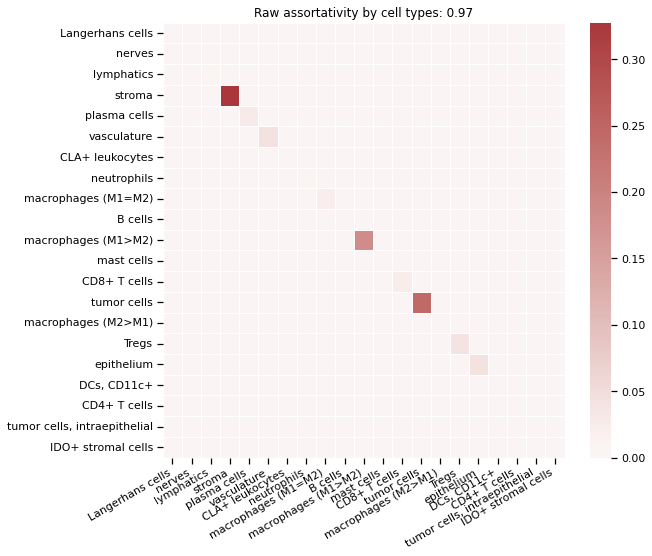

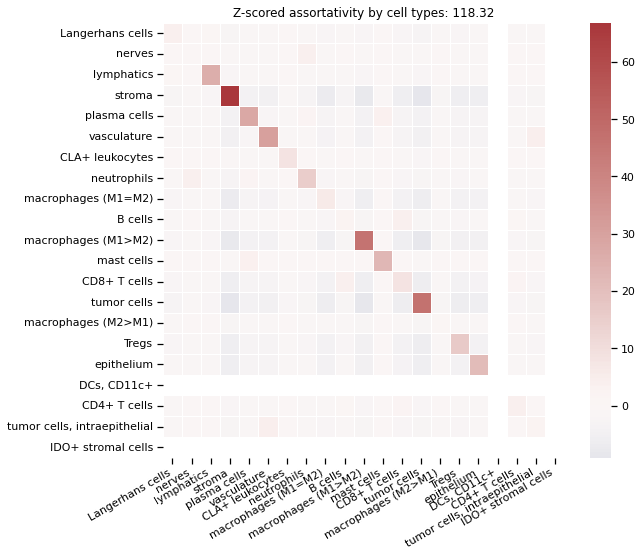

In [86]:
# sns.set_context('talk')
sns.set_context("notebook")
figsize = (9, 8)

title = "Raw assortativity by cell types: {:.2f}".format(assort_raw)
print(title)
f, ax = plt.subplots(figsize=figsize)
sns.heatmap(mixmat_raw, center=0, cmap="vlag", annot=False, linewidths=.5, ax=ax)
ax.set_title(title)
plt.xticks(rotation=30, ha='right');
plt.xticks(rotation=30, ha='right');
# plt.xticks(rotation=30, ha='right', fontsize=20);
# plt.yticks(fontsize=20);
plt.savefig(save_dir / f"assortativity_raw_sample-{sample_id}", bbox_inches='tight', facecolor='white')

title = "Z-scored assortativity by cell types: {:.2f}".format(assort_z)
print(title)
f, ax = plt.subplots(figsize=figsize)
sns.heatmap(mixmat_z, center=0, cmap="vlag", annot=False, linewidths=.5, ax=ax)
ax.set_title(title)
plt.xticks(rotation=30, ha='right');
plt.savefig(save_dir / "assortativity_z-scored_sample-{sample_id}", bbox_inches='tight', facecolor='white')

Raw assortativity by cell types: 0.97
Z-scored assortativity by cell types: 118.32


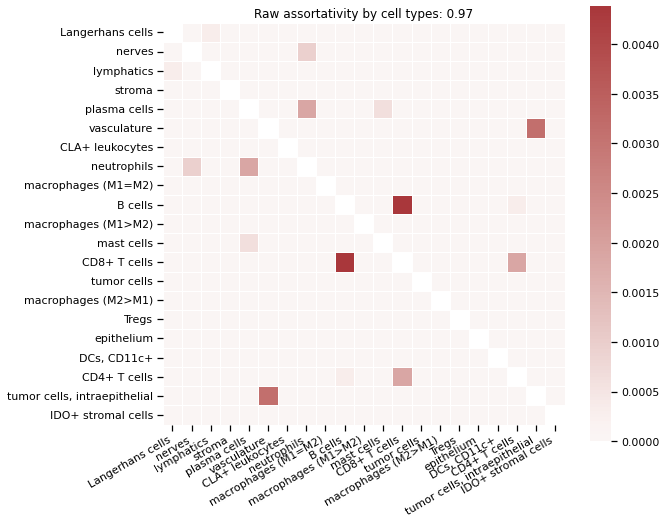

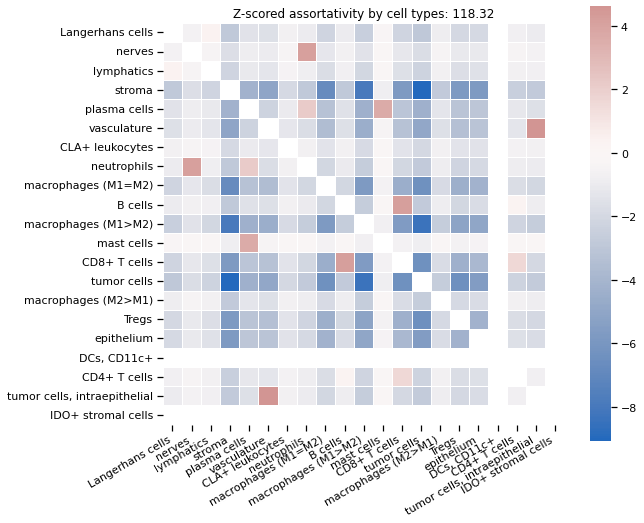

In [87]:
# Hide diagonal
# # Generate a mask for the upper triangle
# mask = np.triu(np.ones_like(mixmat_raw, dtype=bool))
# Generate a mask for the diagonal
mask = np.eye(mixmat_raw.shape[0], dtype=bool)

# sns.set_context('talk')
sns.set_context("notebook")
figsize = (9, 8)

title = "Raw assortativity by cell types: {:.2f}".format(assort_raw)
print(title)
f, ax = plt.subplots(figsize=figsize)
sns.heatmap(mixmat_raw, mask=mask, center=0, cmap="vlag", annot=False, square=True, linewidths=.5, ax=ax)
ax.set_title(title)
plt.xticks(rotation=30, ha='right');
plt.xticks(rotation=30, ha='right');#, fontsize=20);
# plt.yticks(fontsize=20);
plt.savefig(save_dir / f"assortativity_raw_sample-{sample_id}_diagonal", bbox_inches='tight', facecolor='white')

title = "Z-scored assortativity by cell types: {:.2f}".format(assort_z)
print(title)
f, ax = plt.subplots(figsize=figsize)
sns.heatmap(mixmat_z, mask=mask, center=0, cmap="vlag", annot=False, square=True, linewidths=.5, ax=ax)
ax.set_title(title)
plt.xticks(rotation=30, ha='right');
plt.savefig(save_dir / "assortativity_z-scored_sample-{sample_id}_diagonal", bbox_inches='tight', facecolor='white')

After removing highly self-assortative cell-types, we can notice that ~~most cell types tend to avoid other cell types in this sample.~~

#### Assortativity and patients response

In [88]:
z_cols = [x for x in net_stats.columns if x.endswith('Z')]
z_net_stats = net_stats[z_cols]

In [89]:
z_net_stats

,assort Z,B cells - B cells Z,CD4+ T cells - B cells Z,CD4+ T cells - CD4+ T cells Z,CD8+ T cells - B cells Z,CD8+ T cells - CD4+ T cells Z,CD8+ T cells - CD8+ T cells Z,CLA+ leukocytes - B cells Z,CLA+ leukocytes - CD4+ T cells Z,CLA+ leukocytes - CD8+ T cells Z,...,vasculature - macrophages (M2>M1) Z,vasculature - mast cells Z,vasculature - nerves Z,vasculature - neutrophils Z,vasculature - plasma cells Z,vasculature - stroma Z,vasculature - Tregs Z,vasculature - tumor cells Z,"vasculature - tumor cells, intraepithelial Z",vasculature - vasculature Z
id,,,,,,,,,,,,,,,,,,,,,
reg001,118.322045,2.303197,0.319617,3.737300,4.237213,1.592328,8.319898,-0.695376,-0.598468,-1.417702,...,-1.549946,-0.508612,-0.969886,-1.717401,-2.302747,-5.030768,-3.364859,-4.921611,4.617037,30.524675
reg002,137.208092,-0.231748,0.942463,6.068523,7.768863,2.053927,28.931623,-0.291235,-0.534386,-0.949284,...,-2.386706,-0.735220,-1.505281,-1.103783,-2.390947,-5.118748,-4.635056,-6.358490,4.408911,34.495248
reg006,55.655024,-0.177131,-0.257600,-0.127515,-0.280056,-0.201949,12.910897,-0.181818,-0.149983,-0.217241,...,-2.679097,-0.520487,-0.858949,-0.397250,-0.719195,-4.577619,-1.436174,-4.268267,-0.518298,21.647247
reg035,97.992931,NaN,-0.135388,15.522748,-0.189234,-0.841861,23.532646,NaN,-0.265827,-0.303167,...,-0.781031,-1.563830,-0.543025,NaN,NaN,-4.633134,-0.985088,-8.573065,1.618052,25.689617
reg036,49.643293,NaN,-0.119159,-0.135388,-0.243207,-0.465250,10.063439,NaN,NaN,NaN,...,-1.144622,-1.455334,-1.300634,NaN,NaN,-6.625174,-0.654349,-5.928589,NaN,15.272627
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
reg017,36.384874,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.257600,-0.151831,-0.198749,NaN,NaN,-0.537285,-0.341667,-0.383833,-0.214535,6.674080
reg005,10.062674,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-1.281009,-0.508607,NaN,NaN,NaN,-4.210659,NaN,-1.011409,NaN,5.123528
reg018,29.590299,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-0.169725,-0.261488,NaN,-0.198749,-0.772891,-0.248685,-0.239522,NaN,5.298144


In [90]:
# Have a look at nan values
for name, value in z_net_stats.isna().sum().iteritems():
    print(name, ' ' * (52- len(name)), value)

assort Z                                              0
B cells - B cells Z                                   10
CD4+ T cells - B cells Z                              8
CD4+ T cells - CD4+ T cells Z                         6
CD8+ T cells - B cells Z                              7
CD8+ T cells - CD4+ T cells Z                         6
CD8+ T cells - CD8+ T cells Z                         5
CLA+ leukocytes - B cells Z                           15
CLA+ leukocytes - CD4+ T cells Z                      13
CLA+ leukocytes - CD8+ T cells Z                      13
CLA+ leukocytes - CLA+ leukocytes Z                   15
DCs, CD11c+ - B cells Z                               28
DCs, CD11c+ - CD4+ T cells Z                          27
DCs, CD11c+ - CD8+ T cells Z                          27
DCs, CD11c+ - CLA+ leukocytes Z                       28
DCs, CD11c+ - DCs, CD11c+ Z                           29
epithelium - B cells Z                                7
epithelium - CD4+ T cells Z           

(array([31., 45., 53., 21., 29., 11.,  1.,  0., 19., 22.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

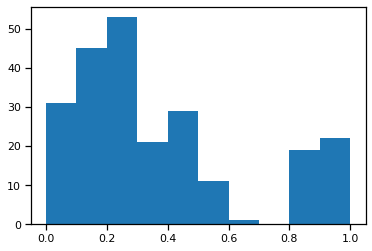

In [91]:
plt.hist(z_net_stats.isna().sum(axis=0) / z_net_stats.shape[0])

In [92]:
nans = z_net_stats.isna().sum(axis=1) / z_net_stats.shape[1]
nans.sort_values()[-10:]

id
reg014    0.418103
reg035    0.422414
reg031    0.426724
reg042    0.482759
reg036    0.482759
reg017    0.646552
reg018    0.724138
reg026    0.810345
reg005    0.844828
reg025    0.909483
dtype: float64

There are some nan values due to interactions between rare cell types that never happened.  
Can can have a first look at the sample, but it would be more informative to have a look at samples before therapy, grouping them per patient.

In [93]:
# we need to clean-up data for further analyses and visualizations
z_net_stats_cleaned, select_finite = mosna.clean_data(
    z_net_stats, 
    method='mixed',
    thresh=0.9,
    )
print("Final z_net_stats shape:", z_net_stats_cleaned.shape)

There are 2422 non finite values
Imputing data
Final z_net_stats shape: (29, 210)


In [94]:
# try dropping first observations with too many NaN, then columns:
print("Original z_net_stats shape:", z_net_stats.shape)
z_net_stats_cleaned, select_finite = mosna.clean_data(
    z_net_stats, 
    method='drop',
    thresh=0.8,
    axis=1,
    )
unselected = ~select_finite
print(f"There are {unselected.sum()} observations discarded")
print("Intermediate z_net_stats shape:", z_net_stats_cleaned.shape)

z_net_stats_cleaned, select_finite = mosna.clean_data(
    z_net_stats_cleaned, 
    method='mixed',
    thresh=0.7,
    axis=0,
    )
unselected = ~select_finite
print(f"There are {unselected.sum()} variables discarded")
print("Final z_net_stats shape:", z_net_stats_cleaned.shape)

Original z_net_stats shape: (29, 232)
There are 2422 non finite values
There are 3 observations discarded
Intermediate z_net_stats shape: (26, 232)
There are 1827 non finite values
Imputing data
There are 41 variables discarded
Final z_net_stats shape: (26, 191)


In [95]:
z_net_stats_cleaned

,assort Z,B cells - B cells Z,CD4+ T cells - B cells Z,CD4+ T cells - CD4+ T cells Z,CD8+ T cells - B cells Z,CD8+ T cells - CD4+ T cells Z,CD8+ T cells - CD8+ T cells Z,CLA+ leukocytes - B cells Z,CLA+ leukocytes - CD4+ T cells Z,CLA+ leukocytes - CD8+ T cells Z,...,vasculature - macrophages (M2>M1) Z,vasculature - mast cells Z,vasculature - nerves Z,vasculature - neutrophils Z,vasculature - plasma cells Z,vasculature - stroma Z,vasculature - Tregs Z,vasculature - tumor cells Z,"vasculature - tumor cells, intraepithelial Z",vasculature - vasculature Z
id,,,,,,,,,,,,,,,,,,,,,
reg001,118.322045,2.303197,0.319617,3.737300,4.237213,1.592328,8.319898,-0.695376,-0.598468,-1.417702,...,-1.549946,-0.508612,-0.969886,-1.717401,-2.302747,-5.030768,-3.364859,-4.921611,4.617037,30.524675
reg002,137.208092,-0.231748,0.942463,6.068523,7.768863,2.053927,28.931623,-0.291235,-0.534386,-0.949284,...,-2.386706,-0.735220,-1.505281,-1.103783,-2.390947,-5.118748,-4.635056,-6.358490,4.408911,34.495248
reg006,55.655024,-0.177131,-0.257600,-0.127515,-0.280056,-0.201949,12.910897,-0.181818,-0.149983,-0.217241,...,-2.679097,-0.520487,-0.858949,-0.397250,-0.719195,-4.577619,-1.436174,-4.268267,-0.518298,21.647247
reg035,97.992931,0.353385,-0.135388,15.522748,-0.189234,-0.841861,23.532646,-0.321044,-0.265827,-0.303167,...,-0.781031,-1.563830,-0.543025,-1.136264,-0.960592,-4.633134,-0.985088,-8.573065,1.618052,25.689617
reg036,49.643293,0.903052,-0.119159,-0.135388,-0.243207,-0.465250,10.063439,-0.136941,-0.236958,-0.289252,...,-1.144622,-1.455334,-1.300634,-0.677810,-0.546862,-6.625174,-0.654349,-5.928589,-0.744839,15.272627
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
reg058,119.864610,-0.163383,-0.452958,5.909709,-0.597786,-0.833593,9.905430,-0.219586,-0.319438,-0.437026,...,-1.228719,-1.566373,-0.675685,-0.351254,-0.558898,-3.822750,-7.263098,-7.303158,-0.913572,47.412794
reg041,76.101295,15.160629,0.716309,13.915332,-0.162637,-0.600945,10.112783,-0.138509,-0.307889,-0.299099,...,-1.619653,-1.036785,-0.509510,-1.078642,-0.696688,-2.992963,-2.281734,-3.144842,-1.097275,62.617902
reg010,129.346618,6.780520,-0.236597,18.643403,-0.785932,-2.936095,34.715332,-0.235698,-1.045686,-0.928886,...,-1.109047,-1.168038,-0.973434,-1.397907,-0.727825,-3.558751,-1.730742,-4.416154,-2.586322,75.161613


Let's add information about patients' group and time of biopsy

In [96]:
if 'FileName' in status.columns:
    status.index = status['FileName']
    status.drop(columns=['FileName'], inplace=True)
    status.index.name = 'id'
# status.sort_values('Spots')
status

,Patients,Groups,Spots
id,,,
reg001,1,1,1
reg002,1,1,2
reg005,2,1,5
reg006,2,1,6
reg009,3,2,9
...,...,...,...
reg046,12,2,46
reg051,13,1,51
reg052,13,1,52


In [97]:
# samples 25, 36, 37, 40, 44 are missing
# pd.set_option('display.max_rows', 10)
# reg026 and reg044 not in biopsies
z_net_stats_cleaned = pd.concat([status, z_net_stats_cleaned], axis=1, join='inner')#.sort_values('Spots')
# z_net_stats_cleaned.drop(columns=['Spots'], inplace=True)
z_net_stats_cleaned

,Patients,Groups,Spots,assort Z,B cells - B cells Z,CD4+ T cells - B cells Z,CD4+ T cells - CD4+ T cells Z,CD8+ T cells - B cells Z,CD8+ T cells - CD4+ T cells Z,CD8+ T cells - CD8+ T cells Z,...,vasculature - macrophages (M2>M1) Z,vasculature - mast cells Z,vasculature - nerves Z,vasculature - neutrophils Z,vasculature - plasma cells Z,vasculature - stroma Z,vasculature - Tregs Z,vasculature - tumor cells Z,"vasculature - tumor cells, intraepithelial Z",vasculature - vasculature Z
id,,,,,,,,,,,,,,,,,,,,,
reg001,1,1,1,118.322045,2.303197,0.319617,3.737300,4.237213,1.592328,8.319898,...,-1.549946,-0.508612,-0.969886,-1.717401,-2.302747,-5.030768,-3.364859,-4.921611,4.617037,30.524675
reg002,1,1,2,137.208092,-0.231748,0.942463,6.068523,7.768863,2.053927,28.931623,...,-2.386706,-0.735220,-1.505281,-1.103783,-2.390947,-5.118748,-4.635056,-6.358490,4.408911,34.495248
reg006,2,1,6,55.655024,-0.177131,-0.257600,-0.127515,-0.280056,-0.201949,12.910897,...,-2.679097,-0.520487,-0.858949,-0.397250,-0.719195,-4.577619,-1.436174,-4.268267,-0.518298,21.647247
reg009,3,2,9,147.886215,0.569049,-0.553307,31.125710,-0.529696,-4.215097,30.693043,...,-0.836447,-0.658226,-0.358074,-1.168980,-0.372213,-2.332969,-1.347953,-3.170252,-2.498158,45.250934
reg010,3,2,10,129.346618,6.780520,-0.236597,18.643403,-0.785932,-2.936095,34.715332,...,-1.109047,-1.168038,-0.973434,-1.397907,-0.727825,-3.558751,-1.730742,-4.416154,-2.586322,75.161613
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
reg046,12,2,46,58.320174,-0.127515,2.069256,14.043893,-0.536480,-0.975387,2.046266,...,-0.681015,-0.761447,-0.505641,-0.274784,-0.581513,-2.918940,-1.759396,-3.840053,-1.686975,29.846570
reg051,13,1,51,73.188113,-0.044766,2.821890,8.566951,-0.163383,-0.647322,8.224060,...,-1.112099,-1.256780,-0.759326,-1.804454,-1.129151,-5.246719,-1.594605,-5.598527,-1.216330,64.150258
reg052,13,1,52,104.690865,-0.089803,-0.312898,13.080265,-0.182989,-0.425656,6.667424,...,-0.510580,-0.335473,-0.793651,-1.026081,-0.337292,-2.082092,-1.294113,-3.159960,-0.623933,33.387218


In [98]:
pvals = mosna.find_DE_markers(z_net_stats_cleaned.drop(columns=['Patients', 'Spots']), group_ref=2, group_tgt=1, group_var='Groups')
pvals = pvals.sort_values(by='pval', ascending=True)

In [99]:
pd.set_option('display.max_rows', None)
pvals.loc[pvals['pval'] < 0.05, :]

,pval,pval_corr
neutrophils - neutrophils Z,0.000222,0.038435
CD8+ T cells - B cells Z,0.000402,0.038435
Langerhans cells - Langerhans cells Z,0.000713,0.045380
tumor cells - lymphatics Z,0.001031,0.047161
vasculature - vasculature Z,0.001235,0.047161
CD8+ T cells - CD4+ T cells Z,0.002091,0.059235
lymphatics - CD4+ T cells Z,0.002481,0.059235
tumor cells - CD4+ T cells Z,0.002481,0.059235
tumor cells - macrophages (M1>M2) Z,0.002936,0.062309
tumor cells - B cells Z,0.003466,0.066199


In [100]:
pd.set_option('display.max_rows', 10)

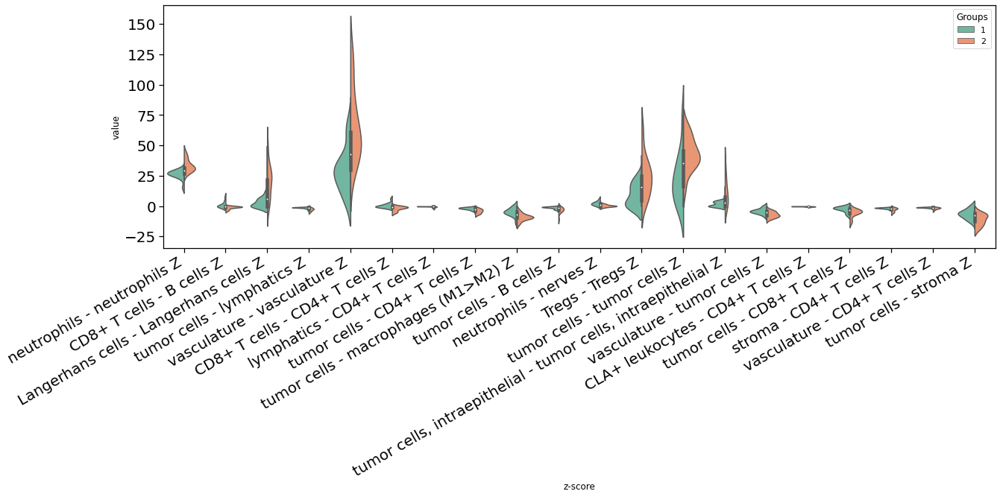

In [101]:
reload(mosna)
fig, ax = mosna.plot_distrib_groups(
    z_net_stats_cleaned, 
    group_var='Groups',
    groups=[1, 2], 
    pval_data=pvals, 
    pval_col='pval', 
    max_cols=20, 
    multi_ind_to_col=True,
    var_name='z-score',
    )

Some variables hide the distribution of other variables by their much larger range, we can exclude them to better see the other variables:

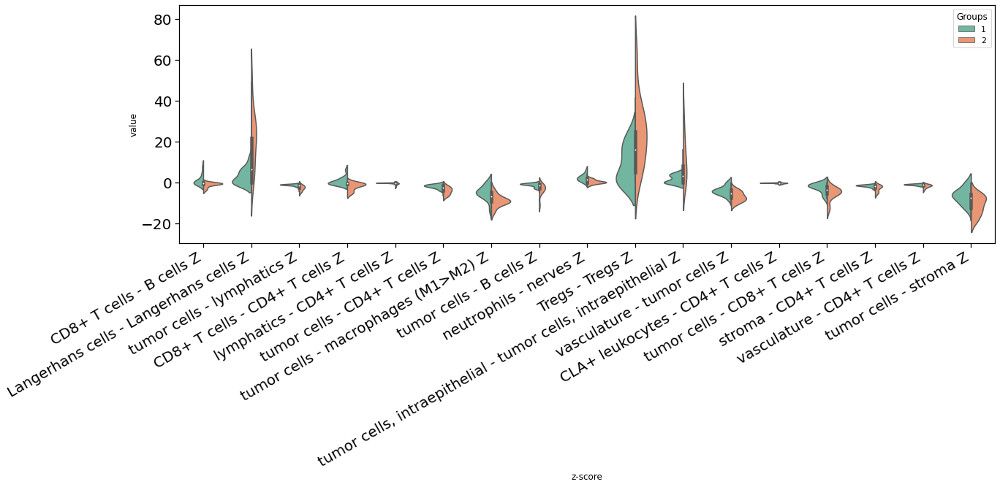

In [102]:
exclude_vars = [
    'assort Z',
    'vasculature - vasculature Z',
    'neutrophils - neutrophils Z',
    'tumor cells - tumor cells Z',
]
fig, ax = mosna.plot_distrib_groups(
    z_net_stats_cleaned, 
    group_var='Groups',
    groups=[1, 2], 
    pval_data=pvals, 
    pval_col='pval', 
    max_cols=20, 
    multi_ind_to_col=True,
    var_name='z-score',
    exclude_vars=exclude_vars,
    )

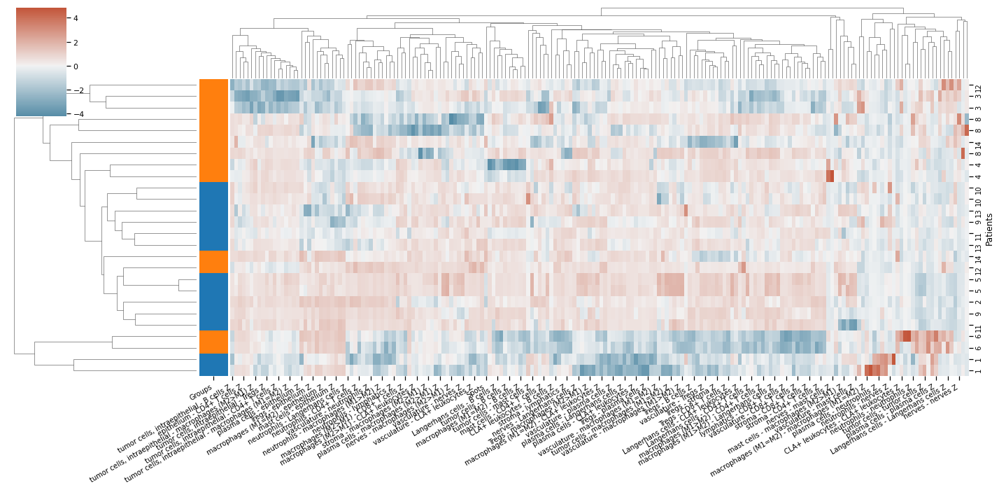

In [103]:
mosna.plot_heatmap(
    z_net_stats_cleaned, 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    figsize=(20, 12),
    skip_cols=['assort Z'],
    )

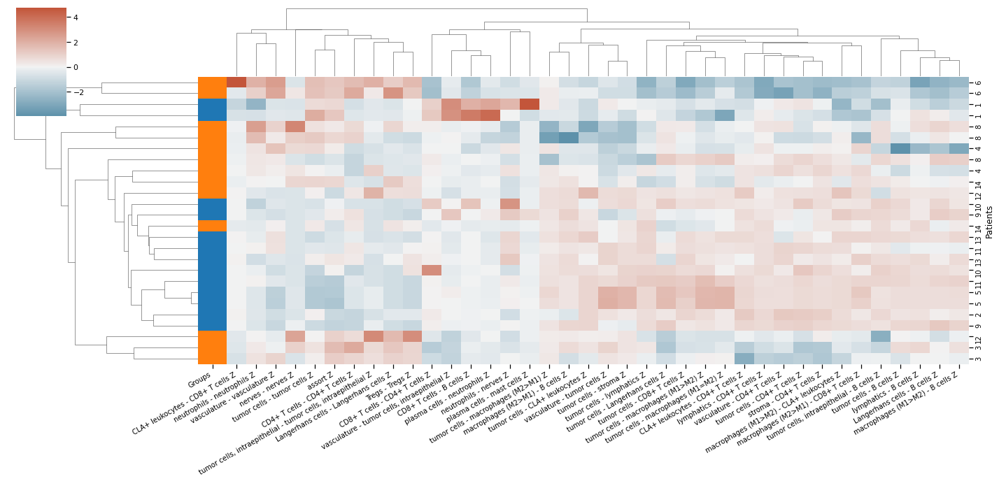

In [104]:
best_pval_names = pvals.loc[pvals['pval'] < 0.05, :].index.tolist()

mosna.plot_heatmap(
    z_net_stats_cleaned[best_pval_names+['Patients', 'Groups']], 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    figsize=(20, 12),
    skip_cols=['assort Z'],
    )

Samples are a bit clustered into consistent response groups, but it's not incredible.  
We also need to aggregate samples per patient and time of biopsy, that may help us correcting nan values and have more variables, and hopefully better clusters.

Add  Langerhans cells - Langerhans cells Z with p-value 0.000171344
Add  vasculature - tumor cells Z    with p-value 0.00268311
Add  stroma - stroma Z              with p-value 0.00671814
Add  tumor cells, intraepithelial - B cells Z with p-value 0.00908887
Add  neutrophils - Langerhans cells Z with p-value 0.0295481
Add  vasculature - stroma Z         with p-value 0.0336967
Add  Tregs - Tregs Z                with p-value 0.0479127
Add  macrophages (M1>M2) - macrophages (M1>M2) Z with p-value 0.0107978
Add  macrophages (M1>M2) - macrophages (M1=M2) Z with p-value 0.0265788
Drop Tregs - Tregs Z                with p-value 0.137111
Add  nerves - mast cells Z          with p-value 0.0245955
Add  Tregs - neutrophils Z          with p-value 0.04493
Add  nerves - nerves Z              with p-value 0.000288533
Drop macrophages (M1>M2) - macrophages (M1>M2) Z with p-value 0.129823
Add  mast cells - CD4+ T cells Z    with p-value 0.00940058


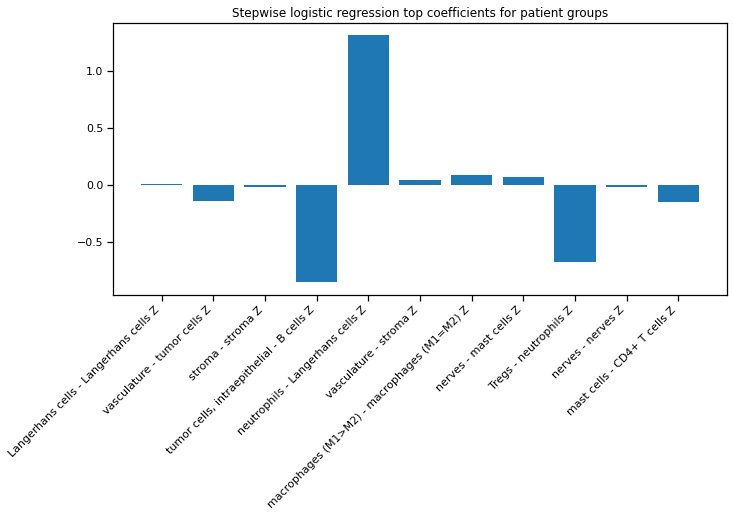

In [105]:
reload(mosna)
# Stepwise logistic regression
best_pval_names = pvals.loc[pvals['pval'] < 0.05, :].index.tolist()
if len(best_pval_names) > 0:
    model, included = mosna.stepwise_regression(X=z_net_stats_cleaned.drop(columns=['Spots']), y_name='Groups', y_values=[1, 2], verbose=True)

    # plot the model's coefficients
    coefs = model.params[1:] # skip intercept
    nb_coefs = min(coefs.size, 20)
    if nb_coefs > 0:
        fig, ax = plt.subplots(figsize=(nb_coefs,5))
        ax.bar(range(len(coefs.index)), coefs)
        plt.xticks(ticks=range(len(coefs.index)), labels=coefs.index, rotation=45, ha='right');
        title = f"Stepwise logistic regression top coefficients for patient groups"
        plt.title(title)
else:
    print("There is no interaction statistically related to response group")

In [106]:
z_net_stats_cleaned

,Patients,Groups,Spots,assort Z,B cells - B cells Z,CD4+ T cells - B cells Z,CD4+ T cells - CD4+ T cells Z,CD8+ T cells - B cells Z,CD8+ T cells - CD4+ T cells Z,CD8+ T cells - CD8+ T cells Z,...,vasculature - macrophages (M2>M1) Z,vasculature - mast cells Z,vasculature - nerves Z,vasculature - neutrophils Z,vasculature - plasma cells Z,vasculature - stroma Z,vasculature - Tregs Z,vasculature - tumor cells Z,"vasculature - tumor cells, intraepithelial Z",vasculature - vasculature Z
id,,,,,,,,,,,,,,,,,,,,,
reg001,1,1,1,118.322045,2.303197,0.319617,3.737300,4.237213,1.592328,8.319898,...,-1.549946,-0.508612,-0.969886,-1.717401,-2.302747,-5.030768,-3.364859,-4.921611,4.617037,30.524675
reg002,1,1,2,137.208092,-0.231748,0.942463,6.068523,7.768863,2.053927,28.931623,...,-2.386706,-0.735220,-1.505281,-1.103783,-2.390947,-5.118748,-4.635056,-6.358490,4.408911,34.495248
reg006,2,1,6,55.655024,-0.177131,-0.257600,-0.127515,-0.280056,-0.201949,12.910897,...,-2.679097,-0.520487,-0.858949,-0.397250,-0.719195,-4.577619,-1.436174,-4.268267,-0.518298,21.647247
reg009,3,2,9,147.886215,0.569049,-0.553307,31.125710,-0.529696,-4.215097,30.693043,...,-0.836447,-0.658226,-0.358074,-1.168980,-0.372213,-2.332969,-1.347953,-3.170252,-2.498158,45.250934
reg010,3,2,10,129.346618,6.780520,-0.236597,18.643403,-0.785932,-2.936095,34.715332,...,-1.109047,-1.168038,-0.973434,-1.397907,-0.727825,-3.558751,-1.730742,-4.416154,-2.586322,75.161613
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
reg046,12,2,46,58.320174,-0.127515,2.069256,14.043893,-0.536480,-0.975387,2.046266,...,-0.681015,-0.761447,-0.505641,-0.274784,-0.581513,-2.918940,-1.759396,-3.840053,-1.686975,29.846570
reg051,13,1,51,73.188113,-0.044766,2.821890,8.566951,-0.163383,-0.647322,8.224060,...,-1.112099,-1.256780,-0.759326,-1.804454,-1.129151,-5.246719,-1.594605,-5.598527,-1.216330,64.150258
reg052,13,1,52,104.690865,-0.089803,-0.312898,13.080265,-0.182989,-0.425656,6.667424,...,-0.510580,-0.335473,-0.793651,-1.026081,-0.337292,-2.082092,-1.294113,-3.159960,-0.623933,33.387218


Training took {duration}s


<Figure size 432x288 with 0 Axes>

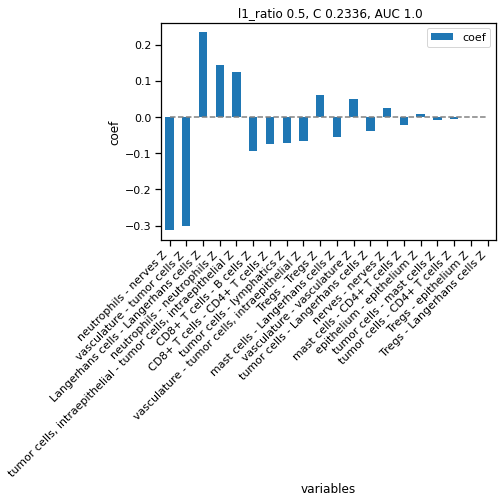

<Figure size 432x288 with 0 Axes>

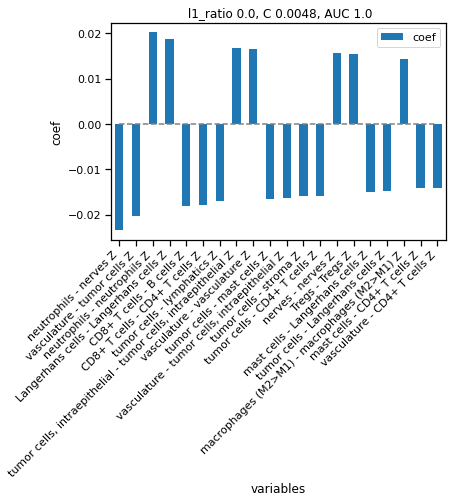

<Figure size 432x288 with 0 Axes>

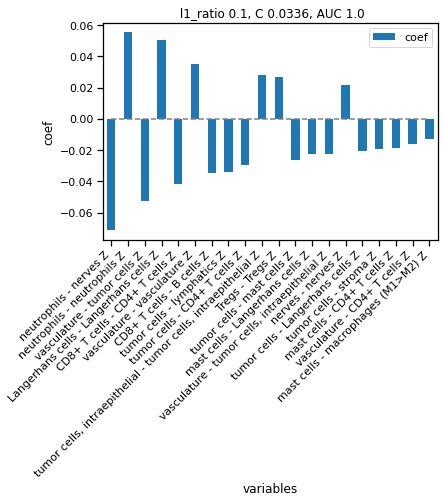

In [107]:
models = mosna.logistic_regression(
    z_net_stats_cleaned,
    y_name='Groups',
    col_drop=['id', 'Patients', 'Spots'],
    )

Training took {duration}s


<Figure size 432x288 with 0 Axes>

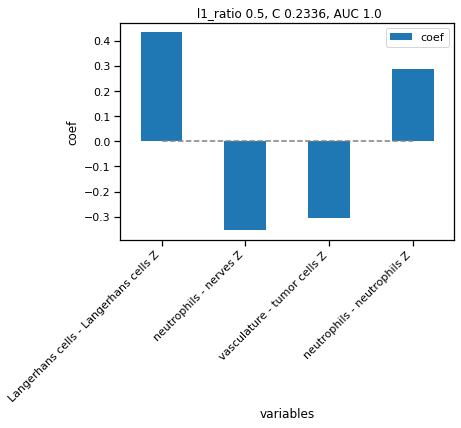

<Figure size 432x288 with 0 Axes>

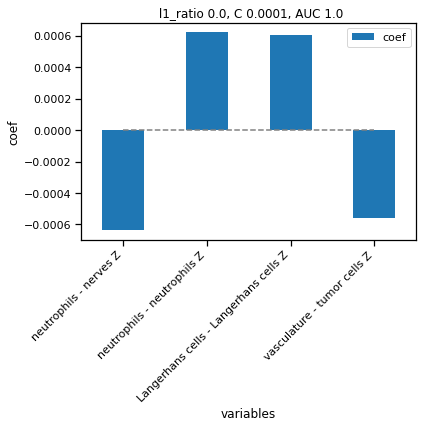

<Figure size 432x288 with 0 Axes>

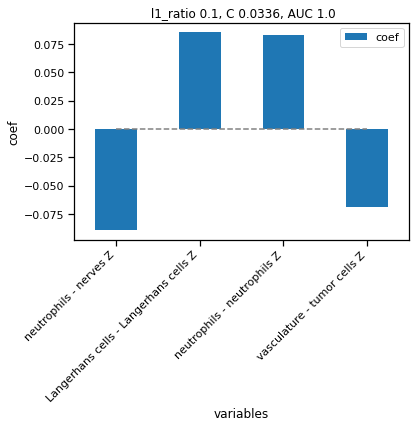

In [108]:
columns = [
    'neutrophils - nerves Z',
    'vasculature - tumor cells Z',
    'Langerhans cells - Langerhans cells Z',
    'neutrophils - neutrophils Z', 
]

models = mosna.logistic_regression(
    z_net_stats_cleaned[columns+['Groups']],
    y_name='Groups',
    col_drop=['id'],
    )

#### Samples aggregation per patient and time point.

In [109]:
z_net_stats = pd.concat([status, z_net_stats], axis=1, join='inner')#.sort_values('Spots')
# z_net_stats.drop(columns=['Spots'], inplace=True)

In [110]:
# good news: the mean of aggregated data already ignores nans
z_net_stats_agg = z_net_stats.groupby(['Patients', 'Groups']).mean()
z_net_stats_agg

,,Spots,assort Z,B cells - B cells Z,CD4+ T cells - B cells Z,CD4+ T cells - CD4+ T cells Z,CD8+ T cells - B cells Z,CD8+ T cells - CD4+ T cells Z,CD8+ T cells - CD8+ T cells Z,CLA+ leukocytes - B cells Z,CLA+ leukocytes - CD4+ T cells Z,...,vasculature - macrophages (M2>M1) Z,vasculature - mast cells Z,vasculature - nerves Z,vasculature - neutrophils Z,vasculature - plasma cells Z,vasculature - stroma Z,vasculature - Tregs Z,vasculature - tumor cells Z,"vasculature - tumor cells, intraepithelial Z",vasculature - vasculature Z
Patients,Groups,,,,,,,,,,,,,,,,,,,,,
1,1,1.5,127.765069,1.035724,0.631040,4.902911,6.003038,1.823127,18.625760,-0.493305,-0.566427,...,-1.968326,-0.621916,-1.237584,-1.410592,-2.346847,-5.074758,-3.999958,-5.640050,4.512974,32.509961
2,1,5.5,32.858849,-0.177131,-0.257600,-0.127515,-0.280056,-0.201949,12.910897,-0.181818,-0.149983,...,-1.980053,-0.514547,-0.858949,-0.397250,-0.719195,-4.394139,-1.436174,-2.639838,-0.518298,13.385387
3,2,9.5,138.616416,NaN,-0.553307,24.884557,-0.529696,-3.575596,32.704188,-0.119159,-0.901588,...,-0.972747,-0.913132,-0.665754,NaN,-0.372213,-2.945860,-1.539348,-3.793203,-2.542240,60.206274
4,2,13.5,93.038644,45.875689,-0.469180,1.022058,-1.638282,-0.664937,8.211085,NaN,NaN,...,-0.881655,-1.038831,-0.842403,NaN,-0.550534,-5.252879,-0.868580,-8.796836,-0.627303,70.429987
5,1,17.5,32.987587,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.257600,-0.160778,-0.230118,NaN,-0.198749,-0.655088,-0.295176,-0.311678,-0.214535,5.986112
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10,1,39.5,92.129112,-0.089098,2.411048,2.199037,1.320280,3.977240,16.262644,NaN,NaN,...,-1.852742,-1.549453,-0.924616,-0.646822,-0.621122,-6.762844,-3.622394,-4.290160,-0.725103,27.751304
11,1,41.5,57.383863,-0.044766,NaN,13.915332,-0.135388,-0.600945,5.024705,NaN,NaN,...,-1.968847,-2.190047,-0.716017,NaN,NaN,-6.383974,-1.812220,-3.405113,-1.012430,48.760463
12,2,45.5,92.459723,1.679651,2.815254,15.350211,-0.775285,-1.416192,3.875523,-0.158009,-0.298877,...,-0.914137,-0.686932,-0.715281,-0.284834,-0.598010,-2.767009,-2.458750,-4.482084,-2.201828,34.872804


In [111]:
# Have a look at nan values
for name, value in z_net_stats_agg.isna().sum().iteritems():
    print(name, ' ' * (52- len(name)), value)

Spots                                                 0
assort Z                                              0
B cells - B cells Z                                   4
CD4+ T cells - B cells Z                              3
CD4+ T cells - CD4+ T cells Z                         2
CD8+ T cells - B cells Z                              2
CD8+ T cells - CD4+ T cells Z                         2
CD8+ T cells - CD8+ T cells Z                         2
CLA+ leukocytes - B cells Z                           6
CLA+ leukocytes - CD4+ T cells Z                      5
CLA+ leukocytes - CD8+ T cells Z                      5
CLA+ leukocytes - CLA+ leukocytes Z                   6
DCs, CD11c+ - B cells Z                               13
DCs, CD11c+ - CD4+ T cells Z                          12
DCs, CD11c+ - CD8+ T cells Z                          12
DCs, CD11c+ - CLA+ leukocytes Z                       13
DCs, CD11c+ - DCs, CD11c+ Z                           14
epithelium - B cells Z                     

(array([95., 40., 19., 15., 21.,  1.,  1., 17., 17.,  7.]),
 array([0.        , 0.04827586, 0.09655172, 0.14482759, 0.19310345,
        0.24137931, 0.28965517, 0.33793103, 0.3862069 , 0.43448276,
        0.48275862]),
 <BarContainer object of 10 artists>)

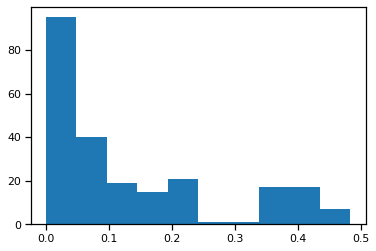

In [112]:
plt.hist(z_net_stats_agg.isna().sum(axis=0) / z_net_stats.shape[0])

In [113]:
pd.set_option('display.max_rows', 20)
z_net_stats_agg.isna().sum(axis=1) / z_net_stats_agg.shape[1]

Patients  Groups
1         1         0.175966
2         1         0.180258
3         2         0.188841
4         2         0.334764
5         1         0.592275
6         2         0.094421
7         2         0.806867
8         2         0.184549
9         1         0.356223
10        1         0.257511
11        1         0.347639
12        2         0.094421
13        1         0.175966
14        2         0.107296
dtype: float64

There are some nan values due to interactions between rare cell types that never happened.  
Can can have a first look at the sample, but it would be more informative to have a look at samples before therapy, grouping them per patient.

In [114]:
print("Original z_net_stats_agg shape:", z_net_stats_agg.shape)
z_net_agg_cleaned, select_finite = mosna.clean_data(
    z_net_stats_agg, 
    method='mixed',
    thresh=0.9,
    )
print("Final z_net_stats_agg shape:", z_net_agg_cleaned.shape)

Original z_net_stats_agg shape: (14, 233)
There are 908 non finite values
Imputing data
Final z_net_stats_agg shape: (14, 226)


In [115]:
pvals = mosna.find_DE_markers(z_net_agg_cleaned.iloc[:, 1:], group_ref=2, group_tgt=1, group_var='Groups')
pvals = pvals.sort_values(by='pval', ascending=True)

In [116]:
pvals.head(10)

,pval,pval_corr
neutrophils - neutrophils Z,0.000583,0.131119
"tumor cells, intraepithelial - tumor cells, intraepithelial Z",0.006993,0.245848
CD8+ T cells - B cells Z,0.006993,0.245848
Langerhans cells - Langerhans cells Z,0.011072,0.245848
lymphatics - CD4+ T cells Z,0.011072,0.245848
CD8+ T cells - CD4+ T cells Z,0.017483,0.245848
"tumor cells, intraepithelial - B cells Z",0.017483,0.245848
tumor cells - CD4+ T cells Z,0.017483,0.245848
"mast cells - DCs, CD11c+ Z",0.026224,0.245848
"nerves - DCs, CD11c+ Z",0.026224,0.245848


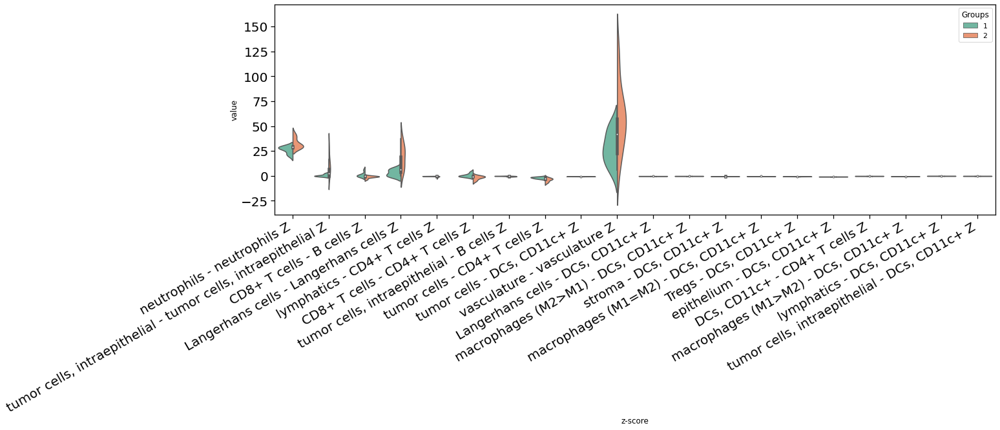

In [117]:
fig, ax = mosna.plot_distrib_groups(
    z_net_agg_cleaned, 
    group_var='Groups',
    groups=[1, 2], 
    pval_data=pvals, 
    pval_col='pval', 
    max_cols=20, 
    multi_ind_to_col=True,
    var_name='z-score',
    )

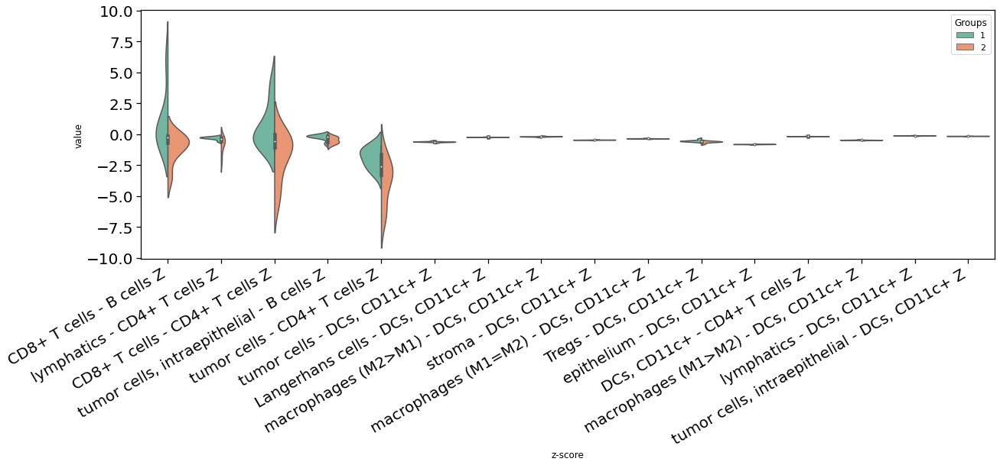

In [118]:
exclude_vars = [
    'vasculature - vasculature Z',
    'neutrophils - neutrophils Z',
    'Langerhans cells - Langerhans cells Z',
     'tumor cells, intraepithelial - tumor cells, intraepithelial Z',
]

fig, ax = mosna.plot_distrib_groups(
    z_net_agg_cleaned, 
    group_var='Groups',
    groups=[1, 2], 
    exclude_vars=exclude_vars,
    pval_data=pvals, 
    pval_col='pval', 
    max_cols=20, 
    multi_ind_to_col=True,
    var_name='z-score',
    )

Distributions of Z scored interactions between -2 and 2 are not significative.

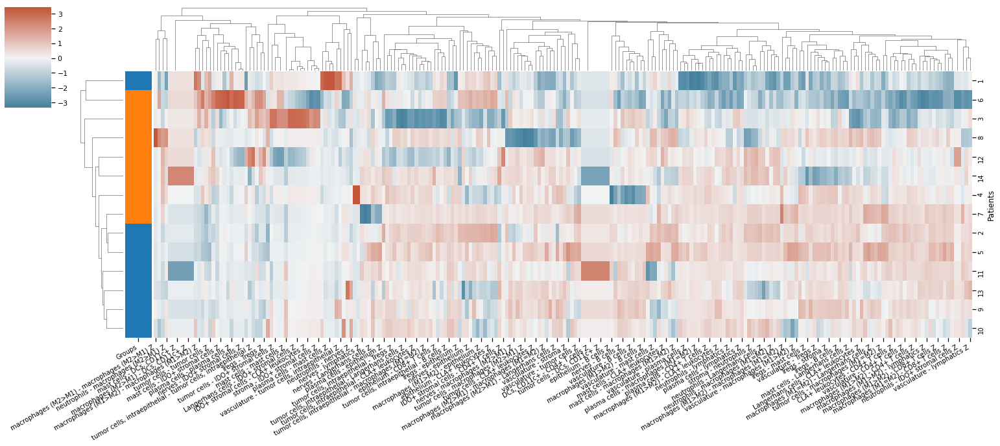

In [119]:
mosna.plot_heatmap(
    z_net_agg_cleaned.reset_index(), 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    figsize=(20, 12),
    dendrogram_ratio=[0.05, 0.2],
    cbar_pos=(-0.07, 0.8, 0.05, 0.18)
    )
plt.savefig(save_dir / "assortativity_z-scored_clustering-patients", bbox_inches='tight', facecolor='white')

In [118]:
# mosna.plot_heatmap(
#     z_net_agg_cleaned.reset_index(), 
#     obs_labels='Patients', 
#     group_var='Groups', 
#     groups=[1, 2],
#     figsize=(80, 12),
#     dendrogram_ratio=[0.05, 0.2],
#     cbar_pos=(-0.07, 0.8, 0.05, 0.18)
#     )
# plt.savefig(save_dir / "assortativity_z-scored_clustering-patients_wide", bbox_inches='tight', facecolor='white')

#### Logistic regression on interaction coefficients

In [120]:
best_pval_names = pvals.loc[pvals['pval'] < 0.05, :].index.tolist()

Add  Langerhans cells - Langerhans cells Z with p-value 0.0053547
Add  macrophages (M1=M2) - lymphatics Z with p-value 0.000699537
Add  nerves - nerves Z              with p-value 0.00409421
Add  vasculature - macrophages (M1=M2) Z with p-value 0.000565896
Add  mast cells - CD8+ T cells Z    with p-value 0.00570139
Add  mast cells - macrophages (M1>M2) Z with p-value 0.0351673
Add  plasma cells - plasma cells Z  with p-value 0.0346666
Add  CD4+ T cells - B cells Z       with p-value 0.0385667
Add  mast cells - mast cells Z      with p-value 0.00575502
Add  stroma - Langerhans cells Z    with p-value 0.00375342
Add  plasma cells - macrophages (M2>M1) Z with p-value 0.00205694
Add  IDO+ stromal cells - CD4+ T cells Z with p-value 0.00332534


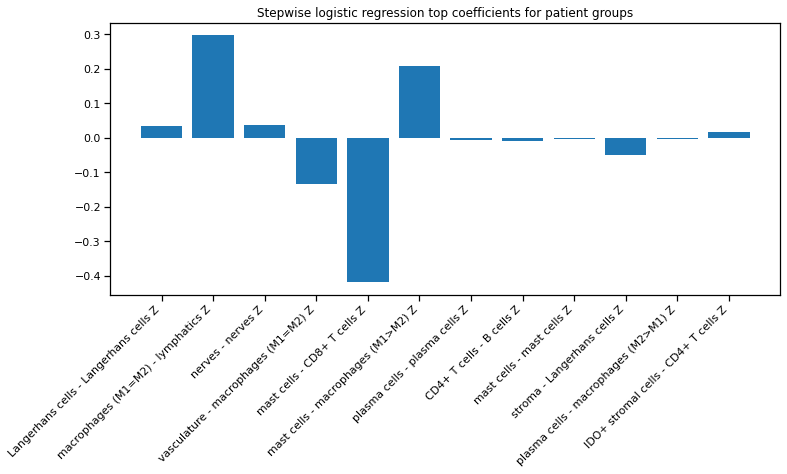

In [166]:
# Stepwise logistic regression
if len(best_pval_names) > 0:
    model, included = mosna.stepwise_regression(X=z_net_agg_cleaned.drop(columns=['Spots']), y_name='Groups', y_values=[1, 2], verbose=True)

    # plot the model's coefficients
    coefs = model.params[1:] # skip intercept
    nb_coefs = min(coefs.size, 20)
    if nb_coefs > 0:
        fig, ax = plt.subplots(figsize=(nb_coefs,5))
        ax.bar(range(len(coefs.index)), coefs)
        plt.xticks(ticks=range(len(coefs.index)), labels=coefs.index, rotation=45, ha='right');
        title = f"Stepwise logistic regression top coefficients for patient groups"
        plt.title(title)
else:
    print("There is no interaction statistically related to response group")

TODO: Compute performance metrics for SWLR models

Training took {duration}s


<Figure size 432x288 with 0 Axes>

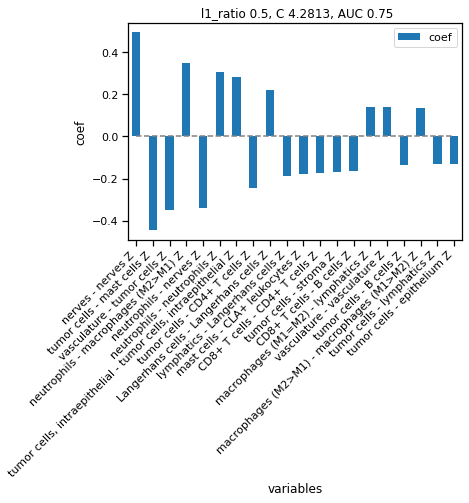

<Figure size 432x288 with 0 Axes>

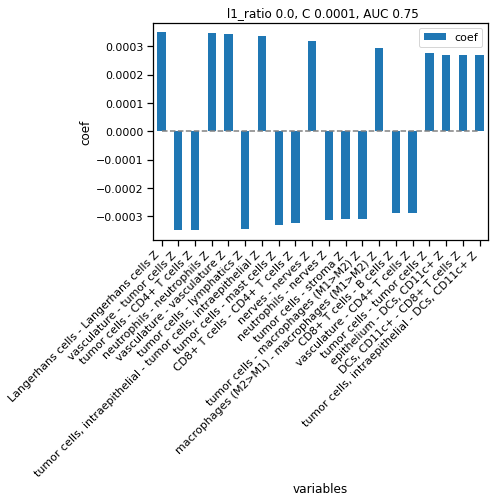

<Figure size 432x288 with 0 Axes>

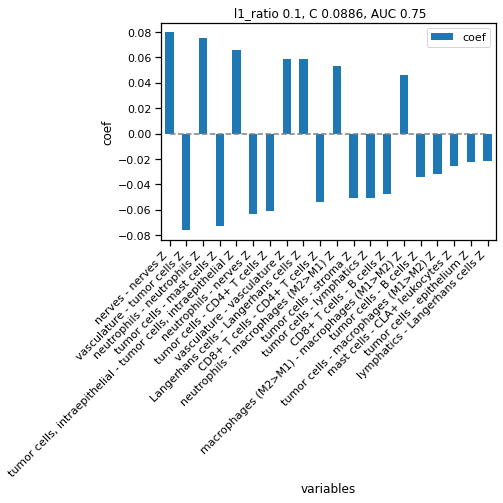

In [121]:
models = mosna.logistic_regression(
    z_net_agg_cleaned,
    y_name='Groups',
    col_drop=['Patients', 'Spots'],
    )

In [99]:
# columns = [
#     'neutrophils - neutrophils Z', 
#     'tumor cells, intraepithelial - tumor cells, intraepithelial Z',
#     'vasculature -vascilature Z',
#     'neutrophils - nerves Z',
#     'vasculature - tumor cells Z',
#     'Langerhans cells - Langerhans cells Z',
#     'vasculature - vasculature Z',
#     'neutrophils - neutrophils Z',
#     'Langerhans cells - Langerhans cells Z',
# ]

Training took {duration}s


<Figure size 432x288 with 0 Axes>

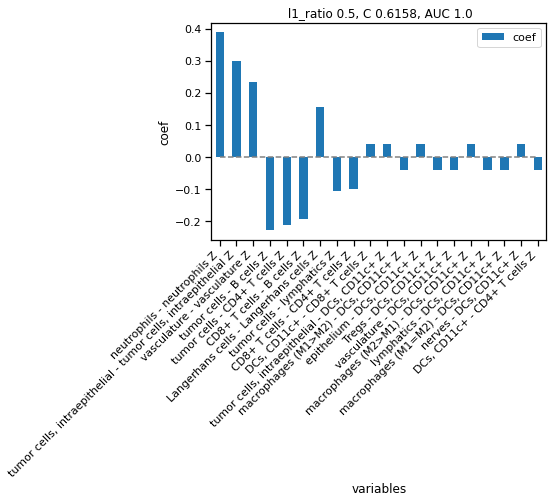

<Figure size 432x288 with 0 Axes>

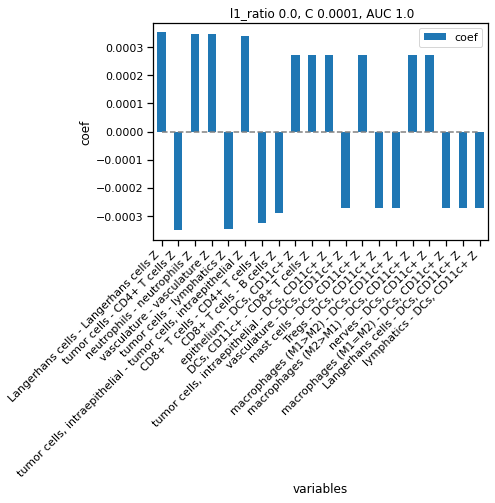

<Figure size 432x288 with 0 Axes>

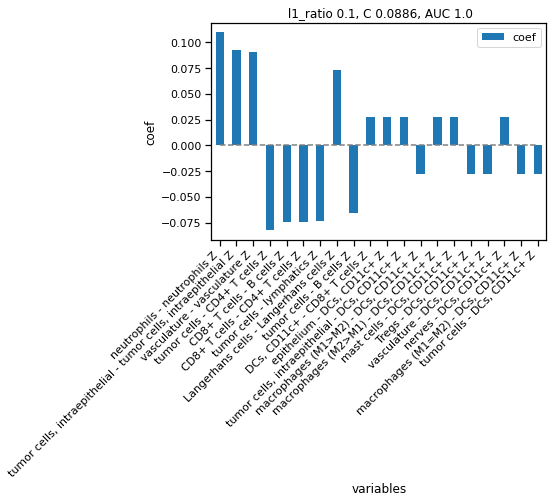

In [122]:
models = mosna.logistic_regression(
    z_net_agg_cleaned[best_pval_names],
    y_name='Groups',
    col_drop=['Patients'],
    )

Training took {duration}s


<Figure size 432x288 with 0 Axes>

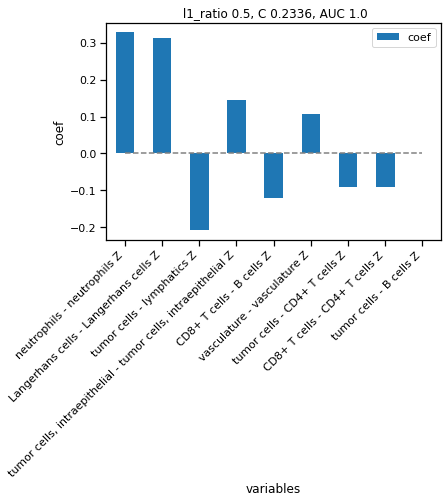

<Figure size 432x288 with 0 Axes>

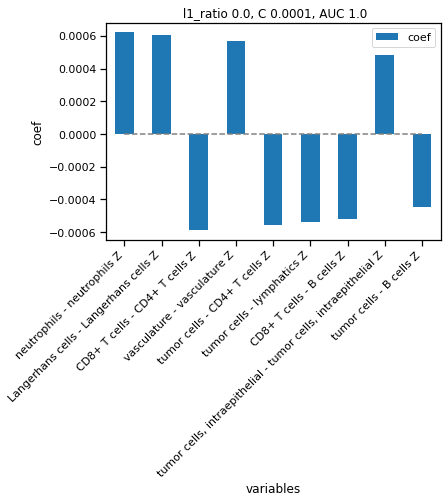

<Figure size 432x288 with 0 Axes>

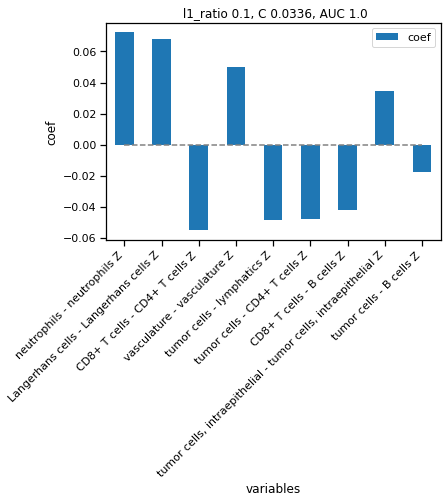

In [123]:
columns = models['default']['coef'].index[:9].tolist() + ['Groups']

models = mosna.logistic_regression(
    z_net_stats_cleaned[columns],
    y_name='Groups',
    col_drop=['id'],
    )

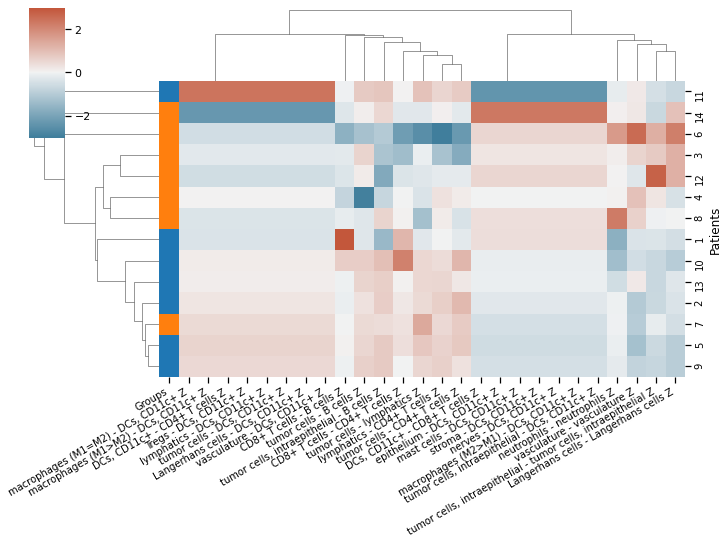

In [124]:
# use the most statistically relevant variable separating groups
# Note: that's to have a clue, do not use this method for real,
# it's a tautology!

nb_vars = np.sum(pvals['pval'] <= 0.05)
# nb_vars = min(nb_vars, 20)
marker_vars = pvals.sort_values(by='pval', ascending=True).head(nb_vars).index.tolist()

mosna.plot_heatmap(
    z_net_agg_cleaned[marker_vars].reset_index(), 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    figsize=(10, 10),
    )

### Ratio of MM elements

In [125]:
pvals = mosna.find_DE_markers(z_net_agg_cleaned.drop(columns=['Spots']).copy(), group_ref=1, group_tgt=2, group_var='Groups', composed_vars=False)
pvals = pvals.sort_values(by='pval', ascending=True)
pvals

,pval,pval_corr
neutrophils - neutrophils Z,0.000583,0.131119
"tumor cells, intraepithelial - tumor cells, intraepithelial Z",0.006993,0.245848
CD8+ T cells - B cells Z,0.006993,0.245848
Langerhans cells - Langerhans cells Z,0.011072,0.245848
lymphatics - CD4+ T cells Z,0.011072,0.245848
...,...,...
plasma cells - Langerhans cells Z,1.000000,1.000000
mast cells - macrophages (M1=M2) Z,1.000000,1.000000
macrophages (M2>M1) - macrophages (M1=M2) Z,1.000000,1.000000
stroma - macrophages (M1=M2) Z,1.000000,1.000000


In [126]:
# `find_DE_markers` can make composite variables, but we do it beforehand to reuse them
z_agg_ratios = pd.concat([z_net_agg_cleaned.drop(columns=['Spots']).copy(), mosna.make_composed_variables(z_net_agg_cleaned.drop(columns=['Spots']).copy(), order=1)], axis=1)

pvals = mosna.find_DE_markers(z_agg_ratios, group_ref=1, group_tgt=2, group_var='Groups')
pvals = pvals.sort_values(by='pval', ascending=True)

In [127]:
pvals.head(20)

,pval,pval_corr
[lymphatics - CD4+ T cells Z / macrophages (M1=M2) - CD4+ T cells Z],0.000583,0.722361
"[DCs, CD11c+ - CD8+ T cells Z / neutrophils - neutrophils Z]",0.000583,0.722361
[tumor cells - tumor cells Z / vasculature - macrophages (M1=M2) Z],0.000583,0.722361
[Langerhans cells - Langerhans cells Z / macrophages (M1=M2) - Langerhans cells Z],0.000583,0.722361
[lymphatics - CD4+ T cells Z / neutrophils - macrophages (M1=M2) Z],0.000583,0.722361
[Langerhans cells - Langerhans cells Z / macrophages (M1>M2) - Langerhans cells Z],0.000583,0.722361
[Langerhans cells - Langerhans cells Z / stroma - Langerhans cells Z],0.000583,0.722361
[neutrophils - macrophages (M1>M2) Z / tumor cells - CD4+ T cells Z],0.000583,0.722361
[Langerhans cells - Langerhans cells Z / plasma cells - Langerhans cells Z],0.000583,0.722361
[Langerhans cells - Langerhans cells Z / plasma cells - macrophages (M1>M2) Z],0.000583,0.722361


In [130]:
(pvals['pval'] < 0.05).sum()

1171

In [128]:
z_agg_ratios

,,assort Z,B cells - B cells Z,CD4+ T cells - B cells Z,CD4+ T cells - CD4+ T cells Z,CD8+ T cells - B cells Z,CD8+ T cells - CD4+ T cells Z,CD8+ T cells - CD8+ T cells Z,CLA+ leukocytes - B cells Z,CLA+ leukocytes - CD4+ T cells Z,CLA+ leukocytes - CD8+ T cells Z,...,[vasculature - stroma Z / vasculature - Tregs Z],[vasculature - stroma Z / vasculature - tumor cells Z],"[vasculature - stroma Z / vasculature - tumor cells, intraepithelial Z]",[vasculature - stroma Z / vasculature - vasculature Z],[vasculature - Tregs Z / vasculature - tumor cells Z],"[vasculature - Tregs Z / vasculature - tumor cells, intraepithelial Z]",[vasculature - Tregs Z / vasculature - vasculature Z],"[vasculature - tumor cells Z / vasculature - tumor cells, intraepithelial Z]",[vasculature - tumor cells Z / vasculature - vasculature Z],"[vasculature - tumor cells, intraepithelial Z / vasculature - vasculature Z]"
Patients,Groups,,,,,,,,,,,,,,,,,,,,,
1,1,127.765069,1.035724,0.631040,4.902911,6.003038,1.823127,18.625760,-0.493305,-0.566427,-1.183493,...,1.268703,0.899772,-1.124482,-0.156099,0.709206,-0.886324,-0.123038,-1.249741,-0.173487,0.138818
2,1,32.858849,-0.177131,-0.257600,-0.127515,-0.280056,-0.201949,12.910897,-0.181818,-0.149983,-0.217241,...,3.059615,1.664549,8.478013,-0.328279,0.544039,2.770941,-0.107294,5.093281,-0.197218,-0.038721
3,2,138.616416,0.441319,-0.553307,24.884557,-0.529696,-3.575596,32.704188,-0.119159,-0.901588,-0.849985,...,1.913707,0.776615,1.158765,-0.048929,0.405817,0.605508,-0.025568,1.492071,-0.063003,-0.042226
4,2,93.038644,45.875689,-0.469180,1.022058,-1.638282,-0.664937,8.211085,-0.189824,-0.339773,-0.374884,...,6.047665,0.597133,8.373754,-0.074583,0.098738,1.384626,-0.012333,14.023271,-0.124902,-0.008907
5,1,32.987587,0.100203,0.718808,5.368425,-0.022184,0.151678,11.922889,-0.189779,-0.237101,-0.298550,...,2.219314,2.101813,3.053532,-0.109435,0.947055,1.375890,-0.049310,1.452809,-0.052067,-0.035839
6,2,135.110854,8.737449,5.091435,28.393471,-3.510018,-5.323816,15.450405,-0.524361,-0.820920,1.838965,...,1.352774,0.857408,5.902083,-0.053592,0.633815,4.362949,-0.039617,6.883631,-0.062505,-0.009080
7,2,19.212448,0.139954,0.791565,5.963435,-0.104734,0.040978,11.277219,-0.191499,-0.238348,-0.304200,...,2.697249,6.854718,7.268306,-0.205644,2.541374,2.694711,-0.076242,1.060336,-0.030000,-0.028293
8,2,97.791916,-0.220003,-0.000031,12.226180,-0.388645,-0.541957,8.565034,-0.333506,-0.463886,-0.409522,...,5.584271,0.730999,10.724504,-0.113744,0.130903,1.920484,-0.020369,14.671020,-0.155600,-0.010606
9,1,73.818112,7.739196,-0.127273,7.693680,-0.216220,-0.653556,16.798042,-0.194055,-0.265827,-0.303167,...,6.867178,0.776347,-3.478971,-0.274846,0.113052,-0.506609,-0.040023,-4.481209,-0.354025,0.079002


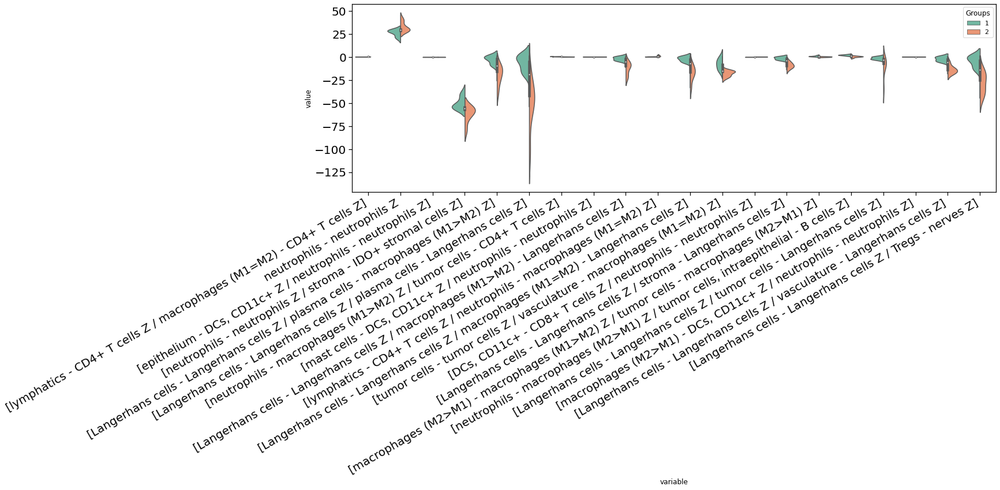

In [129]:
fig, ax = mosna.plot_distrib_groups(
    z_agg_ratios, 
    group_var='Groups',
    groups=[1, 2], 
    pval_data=pvals, 
    pval_col='pval', 
    max_cols=20, 
    multi_ind_to_col=True,
    )

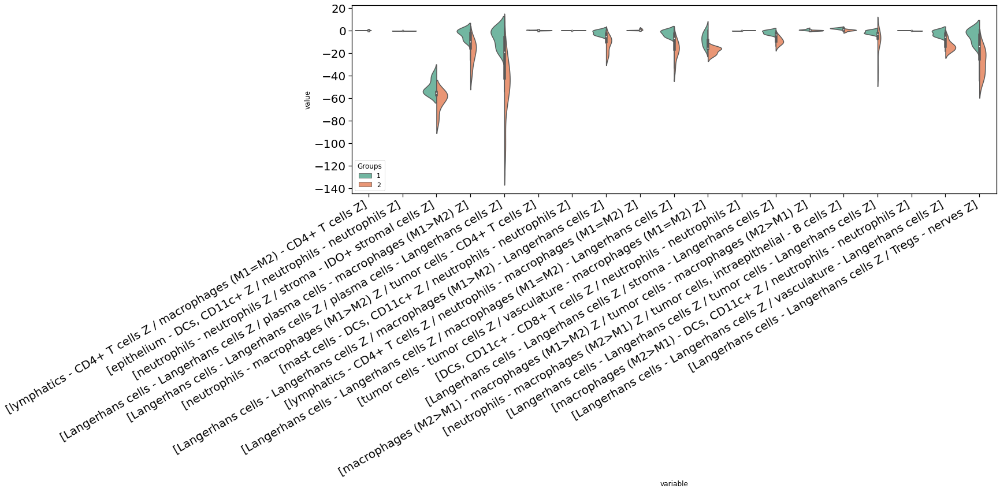

In [131]:
exclude_vars = [
    'Langerhans cells - Langerhans cells Z / plasma cells - Langerhans cells Z',
    'neutrophils - neutrophils Z / stroma - IDO+ stromal cells Z',
    'Langerhans cells - Langerhans cells Z / plasma cells - macrophages (M1>M2) Z',
    'neutrophils - neutrophils Z',
    'Langerhans cells - Langerhans cells Z / Tregs - nerves Z',
]


fig, ax = mosna.plot_distrib_groups(
    z_agg_ratios, 
    group_var='Groups',
    groups=[1, 2], 
    pval_data=pvals, 
    pval_col='pval', 
    max_cols=20, 
    multi_ind_to_col=True,
    exclude_vars=exclude_vars,
    )

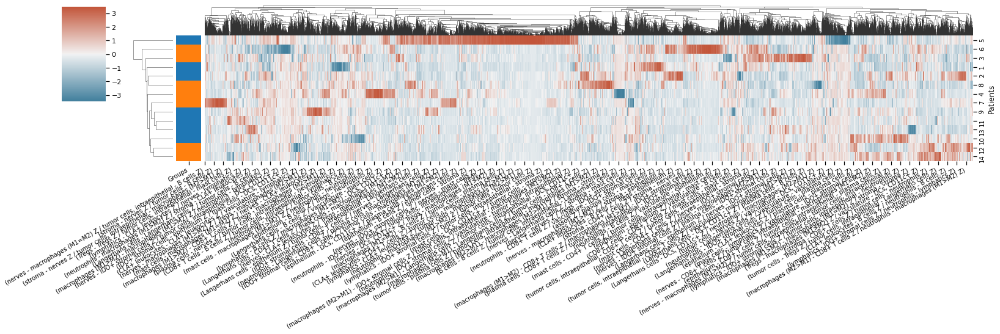

In [188]:
mosna.plot_heatmap(
    z_agg_ratios.reset_index(), 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    figsize=(20, 12),
    dendrogram_ratio=[0.05, 0.2],
    cbar_pos=(-0.07, 0.8, 0.05, 0.18)
    )
# plt.savefig(save_dir / "assortativity_z-scored_ratios_clustering-patients", bbox_inches='tight', facecolor='white')

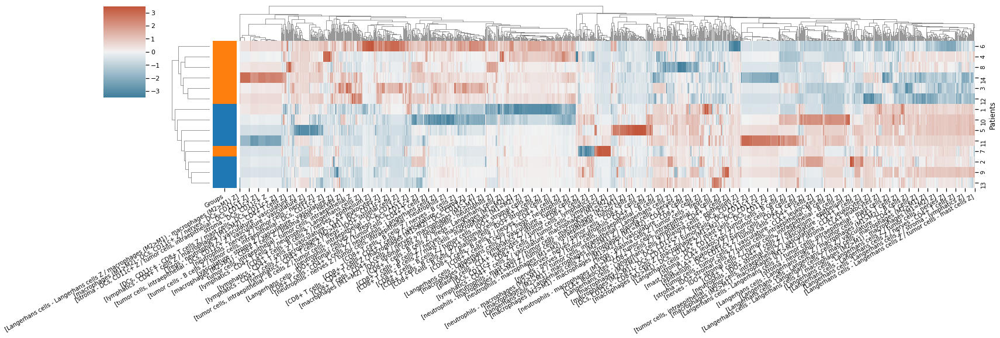

In [133]:
best_pval_names = pvals.loc[pvals['pval'] < 0.05, :].index.tolist()

mosna.plot_heatmap(
    z_agg_ratios[best_pval_names].reset_index(), 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    figsize=(20, 12),
    dendrogram_ratio=[0.05, 0.2],
    cbar_pos=(-0.07, 0.8, 0.05, 0.18)
    )

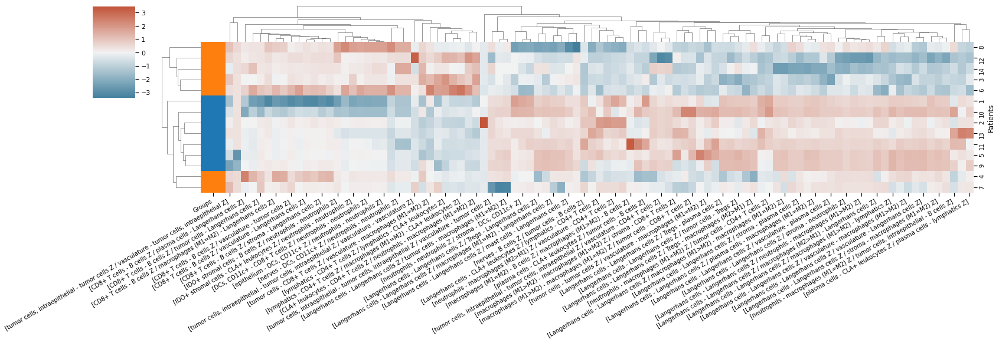

In [134]:
best_pval_names = pvals.loc[pvals['pval'] < 0.005, :].index.tolist()

mosna.plot_heatmap(
    z_agg_ratios[best_pval_names].reset_index(), 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    figsize=(20, 12),
    dendrogram_ratio=[0.05, 0.2],
    cbar_pos=(-0.07, 0.8, 0.05, 0.18)
    )

Training took {duration}s


<Figure size 432x288 with 0 Axes>

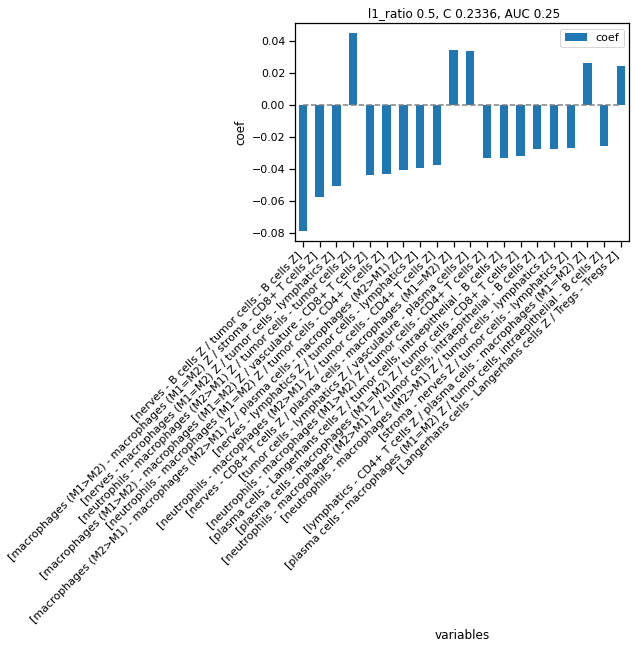

<Figure size 432x288 with 0 Axes>

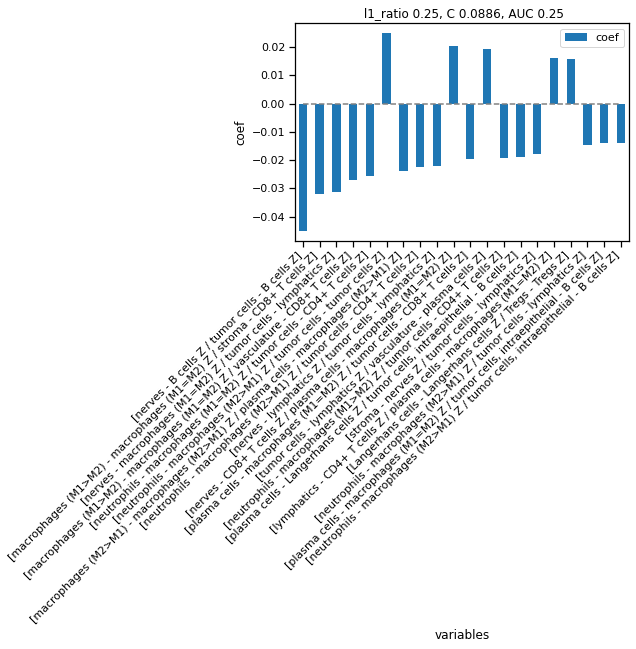

<Figure size 432x288 with 0 Axes>

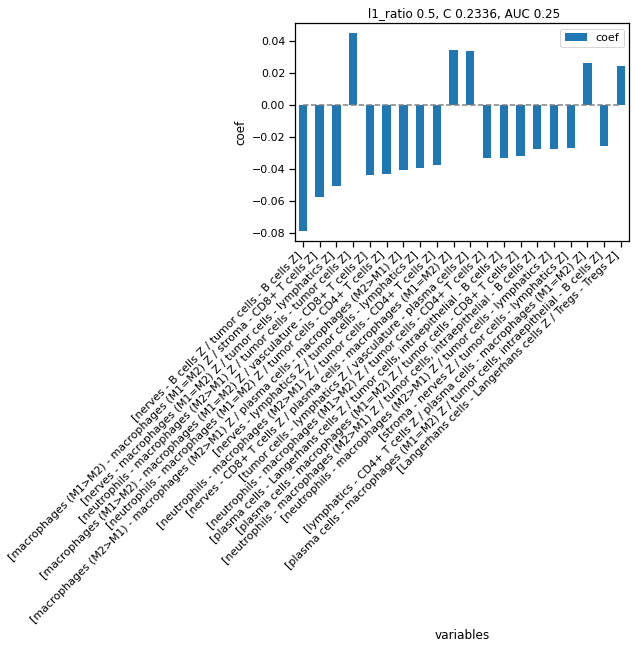

In [135]:
models = mosna.logistic_regression(
    z_agg_ratios,
    y_name='Groups',
    col_drop=['Patients'],
    )

Training took {duration}s


<Figure size 432x288 with 0 Axes>

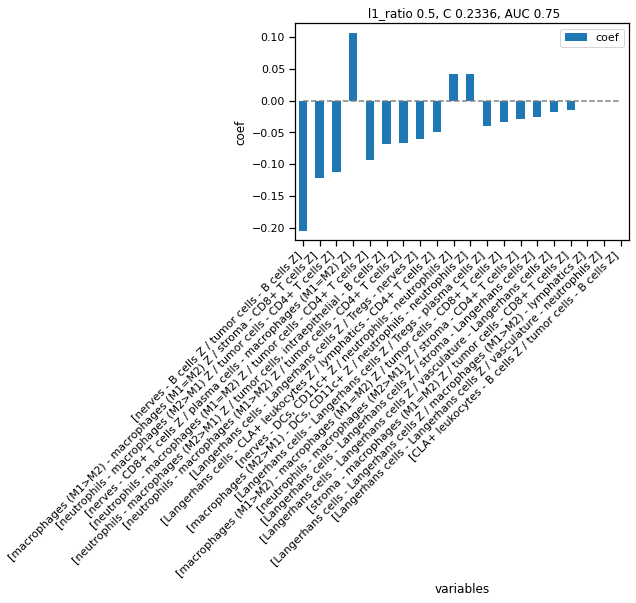

<Figure size 432x288 with 0 Axes>

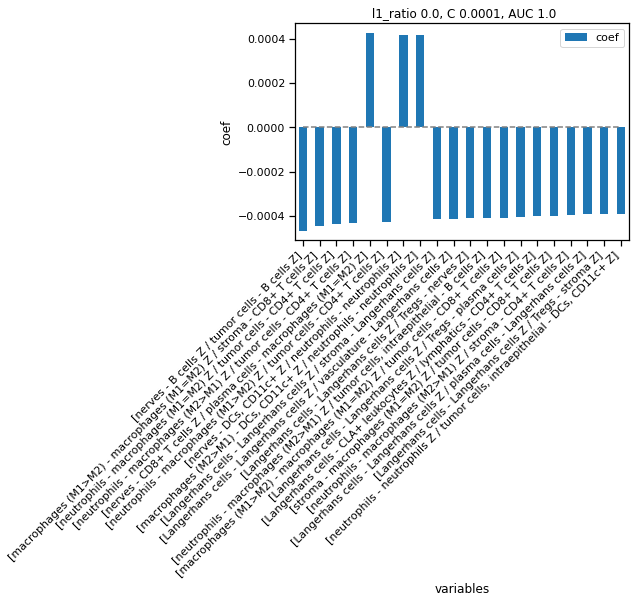

<Figure size 432x288 with 0 Axes>

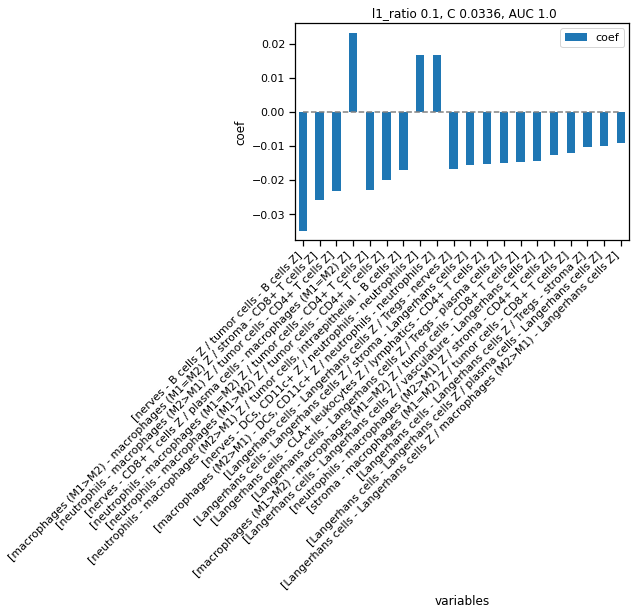

In [136]:
best_pval_names = pvals.loc[pvals['pval'] < 0.005, :].index.tolist()

models = mosna.logistic_regression(
    z_agg_ratios[best_pval_names],
    y_name='Groups',
    col_drop=['Patients'],
    )

### Marker-positive cells interactions

We can also compute the mixing matrix and assortativity between marker-positive cells.

## Cellular neighborhoods

The mixing matrix and assortativity give us information about the global network organization.  
Here we will see how to use the *Neighbors Aggregation Statistics* method to find local "cellular communities", or "neighborhoods", or "niches", that can be relevant to understand disease progression or response to therapies.  

### On cell types

First order neighbors, mean and std

In [50]:
order = 1
var_type = 'cell-types'
stat_names = 'mean-std'
aggreg_vars = cell_type_cols

# For UMAP visualization
marker = '.'
size_points = 10

In [51]:
nas_dir = reconst_dir / f"nas_on-{var_type}_stats-{stat_names}_order-{order}"    
if not os.path.exists(nas_dir):
    os.makedirs(nas_dir)

In [52]:
# attrib_all = obj[cell_type_cols]
X = obj[aggreg_vars].values
edges_all = pd.read_csv(reconst_dir/ 'sample_all-edges.csv')
pairs = edges_all.values

In [53]:
filename = nas_dir / f'aggregation_statistics.csv'

if filename.exists():
    var_aggreg = pd.read_csv(filename)
else:
    var_aggreg = mosna.aggregate_k_neighbors(
        X=X,
        pairs=pairs,
        order=order,
        var_names=aggreg_vars,
    )
    var_aggreg.to_csv(filename, index=False)

In [54]:
n_neighbors = 70
metric = 'euclidean'
min_dist = 0.0

reducer = umap.UMAP(
    random_state=0,
    n_neighbors=n_neighbors,
    metric=metric,
    min_dist=min_dist,
    # we don't modify the other parameters
    # spread=1.0,
    # set_op_mix_ratio=1.0,
    # local_connectivity=1.0,
    # repulsion_strength=1.0,
    # negative_sample_rate=5,
    # transform_queue_size=4.0,
    )
embedding = reducer.fit_transform(var_aggreg)
reducer_name = f"reducer-umap_nneigh-{n_neighbors}_metric-{metric}_min_dist-{min_dist}"
# save reduced coordinates
np.save(nas_dir / (reducer_name + '.npy'), embedding, allow_pickle=False, fix_imports=False)
# save the reducer object
joblib.dump(reducer, nas_dir / (reducer_name + '.pkl'))
embedding.shape

/home/alexis/.pyenv/versions/3.8.10/envs/spatial-networks/lib/python3.8/site-packages/scipy/sparse/_index.py:125: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


(117170, 2)

In [47]:
joblib.dump(reducer, str(nas_dir / (reducer_name + '.pkl')))

['../data/processed/CODEX_CTCL/all_samples_networks_xy_trim_dist-percentile_size_solitary-0/nas_on-cell-types_stats-mean-std_order-1/reducer-umap_nneigh-70_metric-euclidean_min_dist-0.0.pkl']

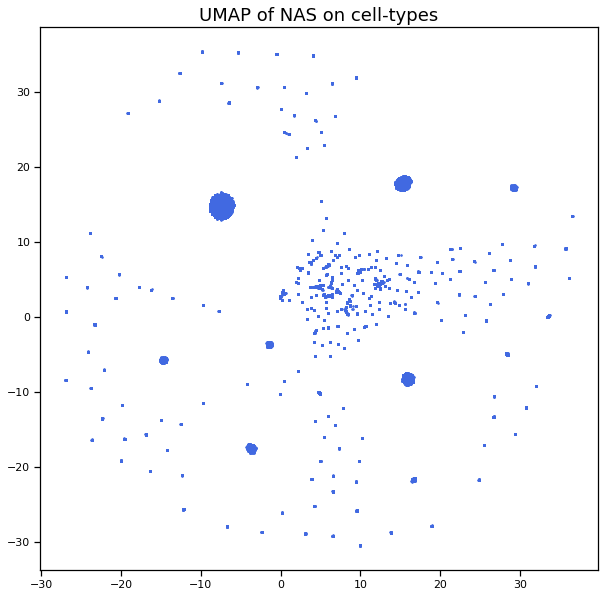

In [48]:
plt.figure(figsize=[10,10])
plt.scatter(embedding[:, 0], embedding[:, 1], c='royalblue', marker=marker, s=size_points)
title = f"UMAP of NAS on {var_type}"
plt.title(title, fontsize=18);

#### Screen NAS parameters

In [ ]:
from importlib import reload
reload(mosna)

orders = [1]
dim_clusts = [2, 3, 4, 5, 6, 7, 8, 9]
min_cluster_sizes = [100, 250, 500, 750, 1000]
parallel_dim = 'max'
parallel_clustering = 4
processed_dir = Path('../data/processed/CODEX_CTCL')
opt_str = '_samples-all_stat-mean-std'
save_dir = 'test-parallel'

mosna.screen_nas_parameters(X, pairs, markers, orders, dim_clusts, min_cluster_sizes, processed_dir, save_dir=save_dir, soft_clustering=True, 
                            opt_str=opt_str, parallel_dim=parallel_dim, parallel_clustering=parallel_clustering, memory_limit='800GB')


#### Clusters visualization

dim_clust: 2
    min_cluster_size: 100


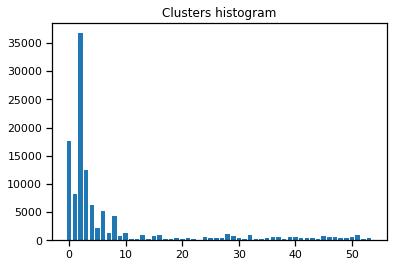

No handles with labels found to put in legend.


        sample: 1


In [188]:
reload(mosna)

orders = [1]
dim_clusts = [2, 3, 4, 5, 6, 7, 8, 9]
min_cluster_sizes = [100, 250, 500, 750, 1000]
processed_dir = Path('../data/processed/CODEX_CTCL')
opt_str = '_samples-all_stat-mean-std'

mosna.plot_screened_parameters(obj, cell_pos_cols, cell_type_cols, orders, dim_clusts, processed_dir,
                               min_cluster_sizes, all_edges='all_samples_networks', sampling=False, var_type=None, 
                               downsample=False, aggreg_dir=None, load_dir=None, save_dir=None, opt_str=opt_str)

### On markers

In [38]:
order = 1
var_type = 'markers'
stat_names = 'mean-std'
aggreg_vars = marker_cols

# For UMAP visualization
marker = '.'
size_points = 10

In [39]:
nas_dir = reconst_dir / f"nas_on-{var_type}_stats-{stat_names}_order-{order}"    
if not os.path.exists(nas_dir):
    os.makedirs(nas_dir)

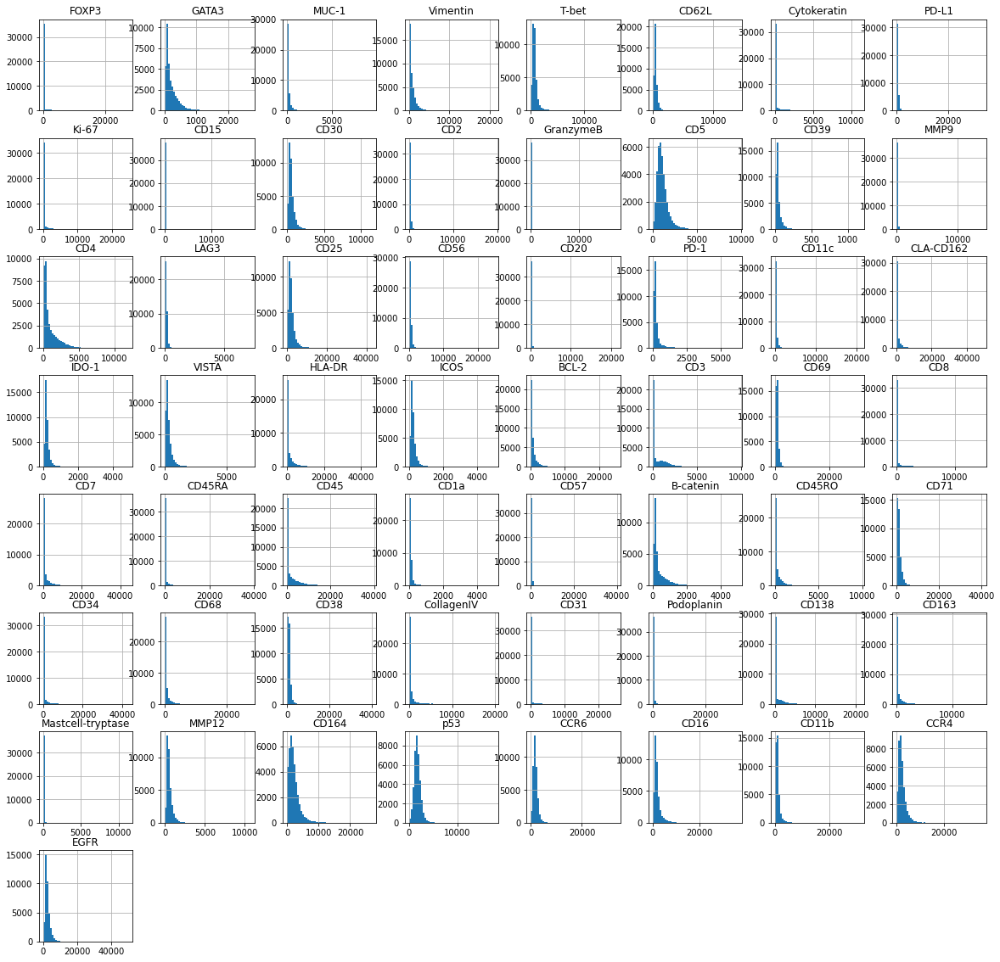

In [40]:
obj[aggreg_vars].hist(bins=50, figsize=(20, 20));

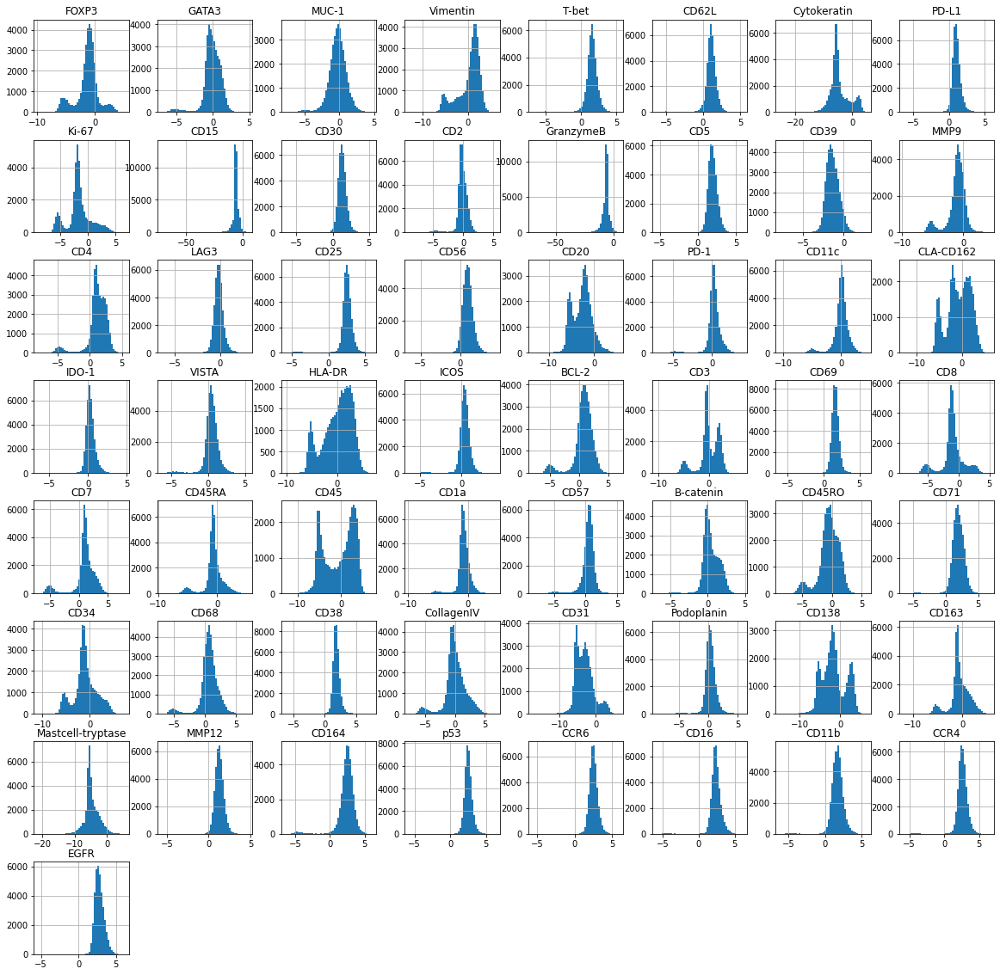

In [41]:
X = obj[aggreg_vars].values
X[X == 0] = X.max() / 100000

X_clr = cs.clr(cs.closure(X))
aggreg_vars_clr = obj[aggreg_vars].copy()
aggreg_vars_clr.loc[:, :] = X_clr
aggreg_vars_clr.hist(bins=50, figsize=(20, 20));

In [42]:
edges_all = pd.read_csv(reconst_dir/ 'sample_all-edges.csv')
pairs = edges_all.iloc[:, :2].values

In [43]:
file_path = nas_dir / f'aggregation_statistics.csv'

if file_path.is_file():
    print("Loading Neighbors Aggregation Statistics file")
    var_aggreg = pd.read_csv(file_path)
else:
    print("Computing Neighbors Aggregation Statistics")
    var_aggreg = mosna.aggregate_k_neighbors(
        X=X_clr,
        pairs=pairs,
        order=order,
        var_names=aggreg_vars,
    )
    var_aggreg.to_csv(file_path, index=False)

Loading Neighbors Aggregation Statistics file


In [33]:
embedding, reducer = mosna.get_reducer(
    data=var_aggreg, 
    save_dir=nas_dir,
    reducer_type='umap', 
    n_neighbors=15, 
    metric='euclidean', 
    min_dist=0.0,
    )

Loading reducer object and reduced coordinates


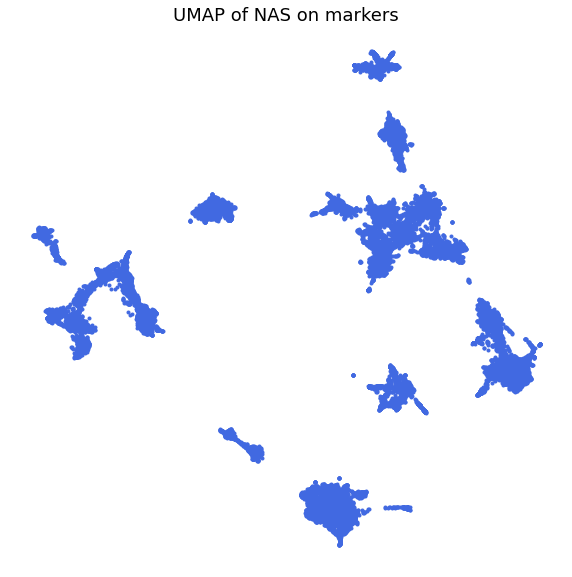

In [31]:
mosna.plot_clusters(embedding)
title = f"UMAP of NAS on {var_type}"
plt.title(title, fontsize=18);

#### Leinden clustering

Test:
  - reducer-umap_dim-2_nneigh-75_metric-euclidean_min_dist-0.0/clusterer-leiden_n_neighbors-15/biclustering_resolution-0.05_normalized-clr
  - reducer-umap_dim-2_nneigh-75_metric-euclidean_min_dist-0.0/clusterer-leiden_n_neighbors-15/biclustering_resolution-0.05_normalized-obs

In [74]:
cluster_params = {
    'reducer_type': 'umap', 
    'n_neighbors': 75, 
    'metric': 'euclidean', 
    'min_dist': 0.0,
    'clusterer_type': 'leiden', 
    'dim_clust': 2, 
    'k_cluster': 15, 
    'resolution_parameter': 0.05,
}

cluster_labels, cluster_dir, nb_clust, _ = mosna.get_clusterer(var_aggreg, nas_dir, **cluster_params)

Loading clusterer object and cluster labels
There are 17 clusters


Loading reducer object and reduced coordinates


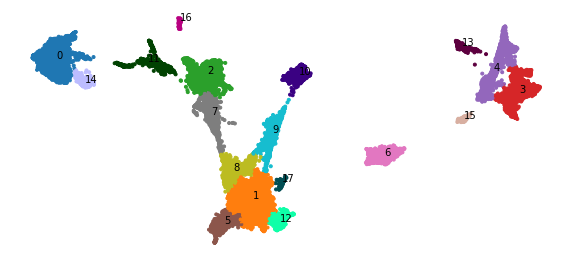

In [78]:
embed_viz, _ = mosna.get_reducer(var_aggreg, nas_dir, reducer_type='umap', n_neighbors=cluster_params['n_neighbors'])
fig, ax, niches_color_mapper = mosna.plot_clusters(embed_viz, cluster_labels, nas_dir, cluster_params=cluster_params, return_cmap=True)

In [ ]:
save_dir = cluster_dir / 'spatial_networks_niches'
save_dir.mkdir(parents=True, exist_ok=True)

# colormap for cell-types
n_cell_types = obj['ClusterName'].unique().size
# palette = sns.color_palette(cc.glasbey, n_colors=n_cell_types).as_hex()
# palette = [mpl.colors.rgb2hex(x) for x in mpl.cm.get_cmap('tab20').colors]
niche_colors = np.array([niches_color_mapper[x] for x in cluster_labels])

plots_marker = '.'
for sample in obj['FileName'].unique():
    print("filename: {}".format(sample))
    select = np.array(obj['FileName'] == sample)

    # load nodes and edges
    coords = obj.loc[select, cell_pos_cols].values
    # TODO: find a way to reuse pairs compatible with aggregated nodes
    # pairs = edges_all.loc[edges_all['filename'] == sample, ['source', 'target']].values
    pairs = ty.build_delaunay(coords, trim_dist=trim_dist)
    if k_sol > 0:
        pairs = ty.link_solitaries(coords, pairs, method='knn', k=k_sol)

    # Big summary plot
    fig, ax = plt.subplots(1, 4, figsize=(int(7*4)+1, 7), tight_layout=False)
    i = 0
    ty.plot_network(coords, 
                    pairs,
                    labels=obj.loc[select, 'ClusterName'], 
                    color_mapper=celltypes_color_mapper, 
                    marker=plots_marker, 
                    size_nodes=size_points, 
                    ax=ax[0])
    ax[i].set_title('Spatial map of phenotypes', fontsize=14);

    i += 1
    ax[i].scatter(coords[:, 0], coords[:, 1], c=niche_colors[select], marker=plots_marker, s=size_points)
    ax[i].set_title('Spatial map of detected areas', fontsize=14);
    ax[i].set_aspect('equal')

    i += 1
    ax[i].scatter(embed_viz[select, 0], embed_viz[select, 1], c=niche_colors[select], s=5);
    ax[i].set_title("Clustering on NAS", fontsize=14);
    ax[i].set_aspect('equal')

    i += 1
    ax[i].scatter(embed_viz[:, 0], embed_viz[:, 1], c=niche_colors);
    ax[i].set_title("Clustering on NAS of all samples", fontsize=14);
    ax[i].set_aspect('equal')
    
    # make plot limits equal
    ax[i-1].set_xlim(ax[i].get_xlim())
    ax[i-1].set_ylim(ax[i].get_ylim())

    suptitle = f"Spatial omics data and detected areas - sample {sample}";
    fig.suptitle(suptitle, fontsize=18)

    fig.savefig(save_dir / suptitle, bbox_inches='tight', facecolor='white', dpi=300)
    plt.show()

In [34]:
cluster_params = {
    'reducer_type': 'umap', 
    'n_neighbors': 15, 
    'metric': 'euclidean', 
    'min_dist': 0.0,
    'clusterer_type': 'leiden', 
    'dim_clust': 2, 
    'k_cluster': 15, 
    'resolution_parameter': 0.005,
}

cluster_labels, cluster_dir, nb_clust, _ = mosna.get_clusterer(var_aggreg, nas_dir, **cluster_params)

Loading clusterer object and cluster labels
There are 15 clusters


Loading reducer object and reduced coordinates


(<Figure size 720x720 with 1 Axes>, <AxesSubplot:>)

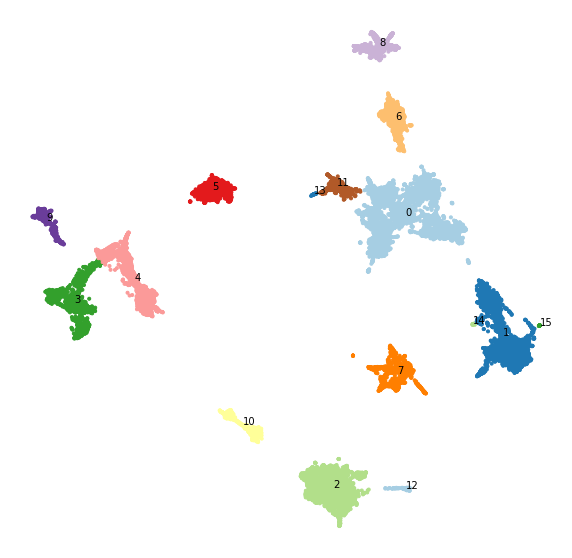

In [35]:
embed_viz, _ = mosna.get_reducer(var_aggreg, nas_dir, reducer_type='umap', n_neighbors=cluster_params['n_neighbors'])
mosna.plot_clusters(embed_viz, cluster_labels, nas_dir, cluster_params=cluster_params)

#### Screen clustering parameters

In [ ]:
# for dim_clust in tqdm([2, 3, 4, 5], leave=False):
for dim_clust in tqdm([2], leave=False):
    for n_neighbors in tqdm([15, 45, 75, 100, 200], leave=False):
        for metric in tqdm(['euclidean', 'cosine'], leave=False):
            for k_cluster in tqdm([15, 50], leave=False):
                cluster_params = {
                    'reducer_type': 'umap', 
                    'n_neighbors': n_neighbors, 
                    'metric': metric,
                    'min_dist': 0.0,
                    'clusterer_type': 'leiden', 
                    'dim_clust': dim_clust, 
                    'k_cluster': 15, 
                    'resolution_parameter': 0.005,
                }

                cluster_labels, cluster_dir, nb_clust, _ = mosna.get_clusterer(var_aggreg, nas_dir, **cluster_params)
                
                embed_viz, _ = mosna.get_reducer(
                    var_aggreg, 
                    nas_dir, 
                    reducer_type='umap', 
                    n_neighbors=n_neighbors, 
                    metric=metric,
                    )
                
                mosna.plot_clusters(embed_viz, cluster_labels, nas_dir, cluster_params=cluster_params)

Loading clusterer object and cluster labels
There are 23 clusters
Loading reducer object and reduced coordinates


(<Figure size 720x720 with 1 Axes>, <AxesSubplot:>)

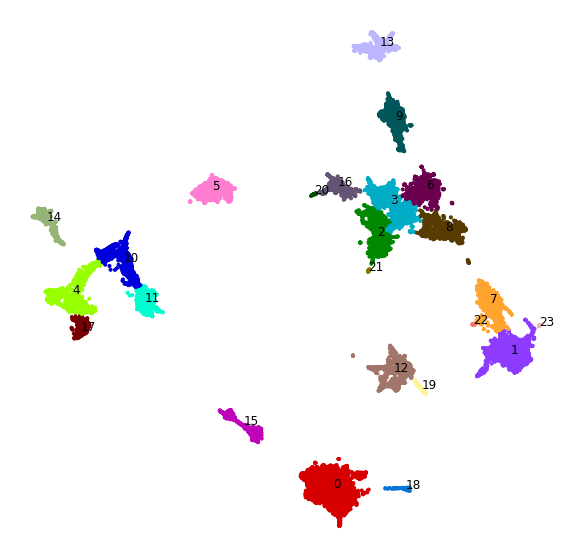

In [62]:
cluster_params = {
    'reducer_type': 'umap', 
    'n_neighbors': 15, 
    'metric': 'euclidean',
    'min_dist': 0.0,
    'clusterer_type': 'leiden', 
    'dim_clust': 2, 
    'k_cluster': 15, 
    'resolution_parameter': 0.05,
}

cluster_labels, cluster_dir, nb_clust, _ = mosna.get_clusterer(var_aggreg, nas_dir, **cluster_params)

embed_viz, _ = mosna.get_reducer(
    var_aggreg, 
    nas_dir, 
    reducer_type='umap', 
    n_neighbors=15, 
    metric='euclidean',
    )

mosna.plot_clusters(embed_viz, cluster_labels, nas_dir, cluster_params=cluster_params)

Loading clusterer object and cluster labels
There are 18 clusters
Loading reducer object and reduced coordinates


(<Figure size 720x720 with 1 Axes>, <AxesSubplot:>)

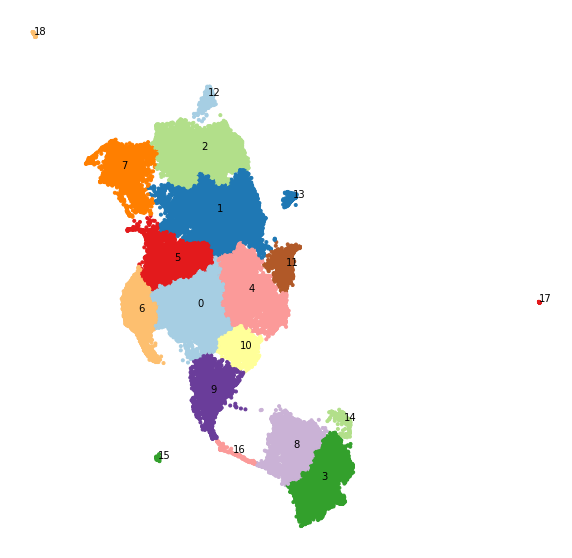

In [ ]:
cluster_params = {
    'reducer_type': 'umap', 
    'n_neighbors': 15, 
    'metric': 'euclidean',
    'min_dist': 0.0,
    'clusterer_type': 'leiden', 
    'dim_clust': 2, 
    'k_cluster': 15, 
    'resolution_parameter': 0.05,
}

cluster_labels, cluster_dir, nb_clust, _ = mosna.get_clusterer(var_aggreg, nas_dir, **cluster_params)

embed_viz, _ = mosna.get_reducer(
    var_aggreg, 
    nas_dir, 
    reducer_type='umap', 
    n_neighbors=15, 
    metric='euclidean',
    )

mosna.plot_clusters(embed_viz, cluster_labels, nas_dir, cluster_params=cluster_params)

In [200]:
# Merge some small adjacent clusters
# merge_dict = {
#     19: 18,
#     21: 17,
#     24: 1,
#     # 23: 1,
#     # 25: 1,
# }
# merge_dict = {
#     20: 2,
#     18: 16,
#     19: 16,
#     # 23: 1,
#     # 25: 1,
# }
merge_dict = {
    13: 11,
    14: 1,
    15: 1,
    # 23: 1,
    # 25: 1,
}
for old, new in merge_dict.items():
    cluster_labels[cluster_labels == old] = new
    
# rename clusters ordered by size
class_id, class_count = np.unique(cluster_labels, return_counts=True)


(<Figure size 720x720 with 1 Axes>, <AxesSubplot:>)

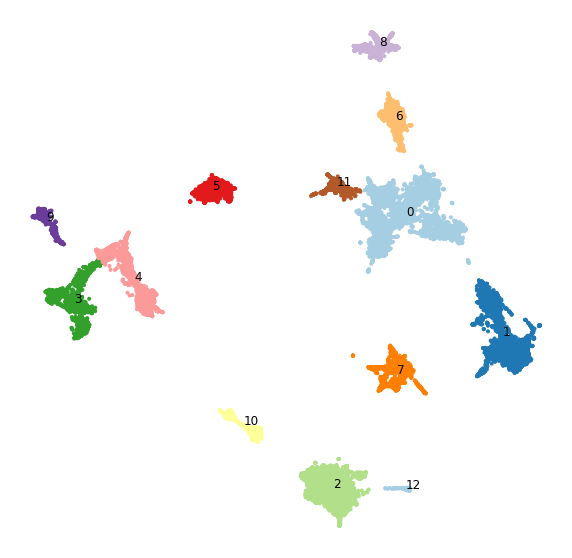

In [201]:
mosna.plot_clusters(embed_viz, cluster_labels, nas_dir, cluster_params=cluster_params)

In [30]:
# rename clusters ordered by size
class_id, class_count = np.unique(cluster_labels, return_counts=True)
decreasing_counts_ids = np.argsort(class_count)[::-1]
new_ids = np.arange(len(class_id))[decreasing_counts_ids]
for old, new in zip(class_id, new_ids):
    cluster_labels[cluster_labels == old] = new

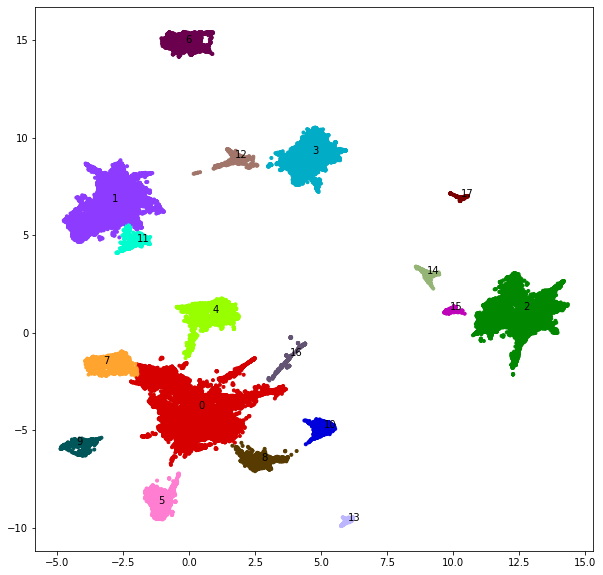

In [31]:
embed_viz = embedding

# choose colormap
if nb_clust < 20:
    clusters_cmap = sns.color_palette('Paired', 20)
    cluster_colors = [clusters_cmap[x] if x >= 0
                      else (0.5, 0.5, 0.5)
                      for x in cluster_labels]
else:
    clusters_cmap = cc.palette["glasbey"]
    # make color mapper
    # series to sort by decreasing order
    uniq = pd.Series(cluster_labels).value_counts().index.astype(int)
    n_colors = len(clusters_cmap)
    labels_color_mapper = {x: clusters_cmap[i % n_colors] for i, x in enumerate(uniq)}
    labels_color_mapper[-1] = (0.5, 0.5, 0.5)
    cluster_colors = [labels_color_mapper[x] for x in cluster_labels]

plt.figure(figsize=(10,10))
plt.scatter(embed_viz[:, 0], embed_viz[:, 1], c=cluster_colors, marker='.');

for clust_id in np.unique(cluster_labels):
    clust_targ = cluster_labels == clust_id
    x_mean = embed_viz[clust_targ, 0].mean()
    y_mean = embed_viz[clust_targ, 1].mean()
    plt.text(x_mean, y_mean, str(clust_id))

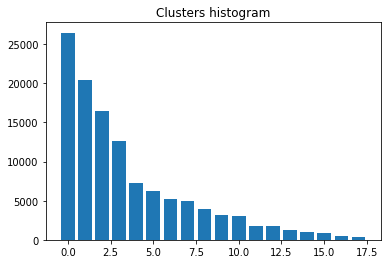

In [32]:
class_id, class_count = np.unique(cluster_labels, return_counts=True)
plt.bar(class_id, class_count, width=0.8);
plt.title('Clusters histogram');

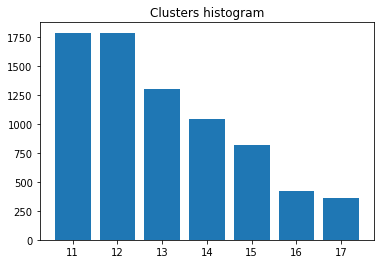

In [33]:
class_id, class_count = np.unique(cluster_labels[cluster_labels > 10], return_counts=True)
plt.bar(class_id, class_count, width=0.8);
plt.title('Clusters histogram');

In [34]:
other_str = '_manual-cleaning'

clusterer_name = f"partition-{'RBConfigurationVertexPartition'}_resolution-{resolution_parameter}{other_str}"
file_path = cluster_dir / clusterer_name

# save cluster labels
np.save(str(file_path) + '.npy', cluster_labels, allow_pickle=False, fix_imports=False)

## Survival analysis

We use labels from the Leiden clustering.

In [202]:
cell_types = nodes_all['CellCluster']
niches = cluster_labels
other_str = ''

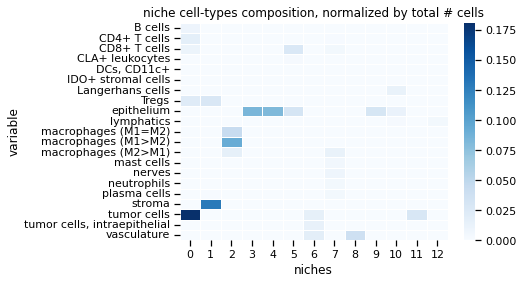

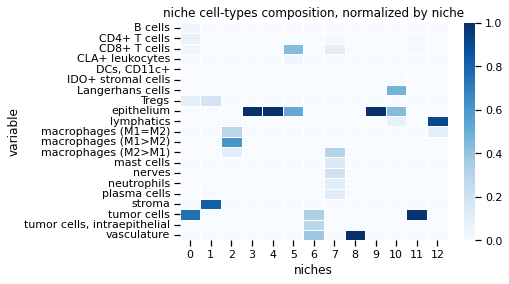

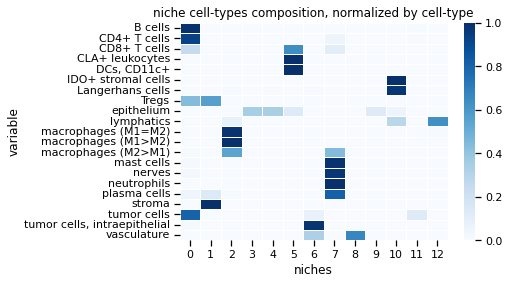

In [203]:
mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types')
title = "niche cell-types composition, normalized by total # cells"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types', normalize='niche')
title = "niche cell-types composition, normalized by niche"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types', normalize='obs')
title = "niche cell-types composition, normalized by cell-type"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

(<Figure size 720x720 with 1 Axes>, <AxesSubplot:>)

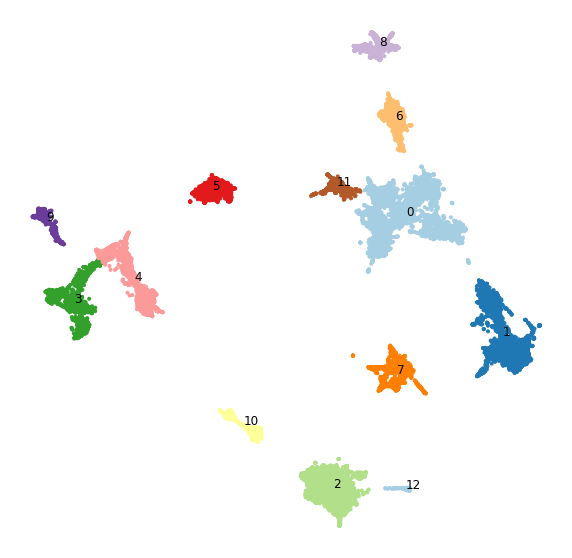

In [204]:
mosna.plot_clusters(embed_viz, cluster_labels, cluster_params=cluster_params)

In [205]:
# proportion of cells in niches per sample
counts = mosna.make_niches_composition(obj['FileName'], niches, var_label='variable', normalize='obs')
counts

niches,0,1,2,3,4,5,6,7,8,9,10,11,12
variable,,,,,,,,,,,,,
reg001,0.276710,0.243659,0.235972,0.000000,0.000000,0.078401,0.064566,0.069946,0.002306,0.000000,0.026902,0.000000,0.001537
reg002,0.316265,0.260757,0.297762,0.000000,0.000000,0.012909,0.045611,0.052496,0.000430,0.000000,0.012048,0.000861,0.000861
reg005,0.035714,0.419643,0.125000,0.000000,0.000000,0.017857,0.383929,0.008929,0.008929,0.000000,0.000000,0.000000,0.000000
reg006,0.280265,0.281924,0.293532,0.000000,0.000000,0.011609,0.086235,0.016584,0.001658,0.000000,0.028192,0.000000,0.000000
reg009,0.172665,0.083976,0.149957,0.003428,0.413453,0.022708,0.071551,0.033419,0.011997,0.000000,0.035561,0.000857,0.000428
...,...,...,...,...,...,...,...,...,...,...,...,...,...
reg046,0.311881,0.137376,0.193069,0.000000,0.000000,0.037129,0.043317,0.023515,0.061881,0.153465,0.025990,0.000000,0.012376
reg051,0.198706,0.143253,0.101664,0.393715,0.001848,0.001848,0.007394,0.037893,0.087800,0.000000,0.022181,0.003697,0.000000
reg052,0.149385,0.074985,0.074985,0.579965,0.050967,0.002929,0.005272,0.027534,0.014060,0.000000,0.019918,0.000000,0.000000


In [206]:
# merge clinical data and proportion of cells in niches per sample
counts_clinic = pd.concat([status, counts], axis=1, join='inner').sort_values('Spots').fillna(0)
counts_clinic.drop(columns=['Spots'], inplace=True)
counts_clinic = counts_clinic.groupby(['Patients', 'Groups']).mean()

In [207]:
counts_clinic

,,0,1,2,3,4,5,6,7,8,9,10,11,12
Patients,Groups,,,,,,,,,,,,,
1,1,0.296488,0.252208,0.266867,0.000000,0.000000,0.045655,0.055088,0.061221,0.001368,0.000000,0.019475,0.000430,0.001199
2,1,0.157990,0.350783,0.209266,0.000000,0.000000,0.014733,0.235082,0.012756,0.005293,0.000000,0.014096,0.000000,0.000000
3,2,0.175419,0.101379,0.137415,0.002221,0.405965,0.022268,0.062933,0.036760,0.020719,0.000000,0.033009,0.001697,0.000214
4,2,0.065573,0.118526,0.100569,0.000394,0.300294,0.013381,0.001748,0.009319,0.060862,0.002756,0.005243,0.319981,0.001354
5,1,0.009548,0.039837,0.024554,0.008147,0.002884,0.885215,0.017890,0.006159,0.000896,0.000000,0.004872,0.000000,0.000000
6,2,0.279430,0.215821,0.218409,0.000000,0.002325,0.140945,0.004567,0.023415,0.053511,0.000000,0.020473,0.020741,0.020364
7,2,0.009309,0.475384,0.064324,0.000000,0.000000,0.000000,0.000000,0.372892,0.068364,0.000000,0.001946,0.000000,0.007782
8,2,0.423863,0.199892,0.082082,0.000523,0.008525,0.007627,0.002172,0.138019,0.066297,0.056789,0.001697,0.000477,0.012038
9,1,0.301893,0.201832,0.110924,0.216314,0.000487,0.043595,0.086409,0.029395,0.001618,0.000000,0.007290,0.000244,0.000000


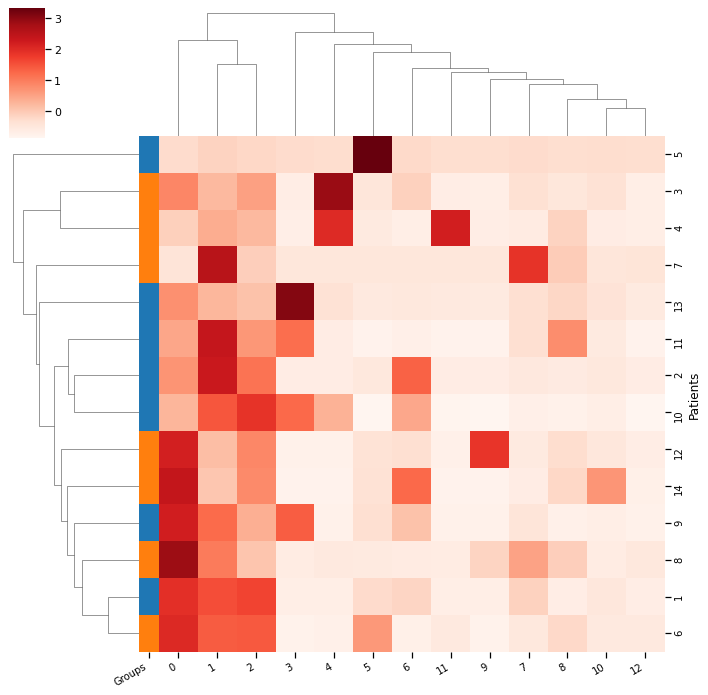

In [208]:
g, d =mosna.plot_heatmap(
    counts_clinic.reset_index(), 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    figsize=(10, 10),
    z_score=False,
    cmap=sns.color_palette("Reds", as_cmap=True),
    return_data=True,
    )

figname = f"resolution-{cluster_params['resolution_parameter']}{other_str}_biclustering_normalized-obs.png"
plt.savefig(cluster_dir / figname)

In [209]:
# proportion of cells in niches per sample, normalized per niche total count
counts = mosna.make_niches_composition(obj['FileName'], niches, var_label='variable', normalize='niche')
counts

niches,0,1,2,3,4,5,6,7,8,9,10,11,12
variable,,,,,,,,,,,,,
reg001,0.039164,0.052302,0.052840,0.000000,0.000000,0.044561,0.045504,0.055966,0.002098,0.000000,0.032649,0.000000,0.009804
reg002,0.079961,0.099984,0.119105,0.000000,0.000000,0.013106,0.057421,0.075031,0.000699,0.000000,0.026119,0.001817,0.009804
reg005,0.000435,0.007754,0.002410,0.000000,0.000000,0.000874,0.023294,0.000615,0.000699,0.000000,0.000000,0.000000,0.000000
reg006,0.018386,0.028048,0.030465,0.000000,0.000000,0.003058,0.028169,0.006150,0.000699,0.000000,0.015858,0.000000,0.000000
reg009,0.043842,0.032338,0.060241,0.002507,0.311190,0.023154,0.090466,0.047970,0.019580,0.000000,0.077425,0.001817,0.004902
...,...,...,...,...,...,...,...,...,...,...,...,...,...
reg046,0.027415,0.018314,0.026850,0.000000,0.000000,0.013106,0.018960,0.011685,0.034965,0.108581,0.019590,0.000000,0.049020
reg051,0.023390,0.025573,0.018933,0.133500,0.000645,0.000874,0.004334,0.025215,0.066434,0.000000,0.022388,0.003633,0.000000
reg052,0.027742,0.021119,0.022031,0.310248,0.028055,0.002184,0.004875,0.028905,0.016783,0.000000,0.031716,0.000000,0.000000


In [210]:
# merge clinical data and proportion of cells in niches per sample
counts_clinic = pd.concat([status, counts], axis=1, join='inner').sort_values('Spots').fillna(0)
counts_clinic.drop(columns=['Spots'], inplace=True)
counts_clinic = counts_clinic.groupby(['Patients', 'Groups']).mean()

In [211]:
counts_clinic

,,0,1,2,3,4,5,6,7,8,9,10,11,12
Patients,Groups,,,,,,,,,,,,,
1,1,0.059563,0.076143,0.085972,0.000000,0.000000,0.028834,0.051463,0.065498,0.001399,0.000000,0.029384,0.000908,0.009804
2,1,0.009410,0.017901,0.016437,0.000000,0.000000,0.001966,0.025731,0.003383,0.000699,0.000000,0.007929,0.000000,0.000000
3,2,0.041014,0.035473,0.051291,0.001567,0.282167,0.020970,0.074215,0.048278,0.030070,0.000000,0.066698,0.003179,0.002451
4,2,0.011913,0.030111,0.025990,0.000157,0.144147,0.008956,0.001354,0.008918,0.065035,0.003065,0.006996,0.439146,0.009804
5,1,0.000544,0.003217,0.002151,0.001254,0.000484,0.196811,0.004875,0.001845,0.000350,0.000000,0.002332,0.000000,0.000000
6,2,0.073053,0.085382,0.090534,0.000000,0.001774,0.148318,0.005959,0.034440,0.089161,0.000000,0.045709,0.046776,0.240196
7,2,0.000218,0.014849,0.002238,0.000000,0.000000,0.000000,0.000000,0.047355,0.011189,0.000000,0.000466,0.000000,0.009804
8,2,0.078982,0.049717,0.026104,0.000313,0.005267,0.006262,0.001986,0.129971,0.071329,0.083479,0.002799,0.000606,0.076797
9,1,0.044060,0.029863,0.017814,0.134441,0.000322,0.039100,0.047671,0.017835,0.000699,0.000000,0.007463,0.000454,0.000000


In [212]:
counts_clinic.sum(axis=0)

0     0.460509
1     0.475142
2     0.486948
3     0.499843
4     0.497366
5     0.496869
6     0.499007
7     0.435014
8     0.464336
9     0.458260
10    0.498601
11    0.499697
12    0.461601
dtype: float64

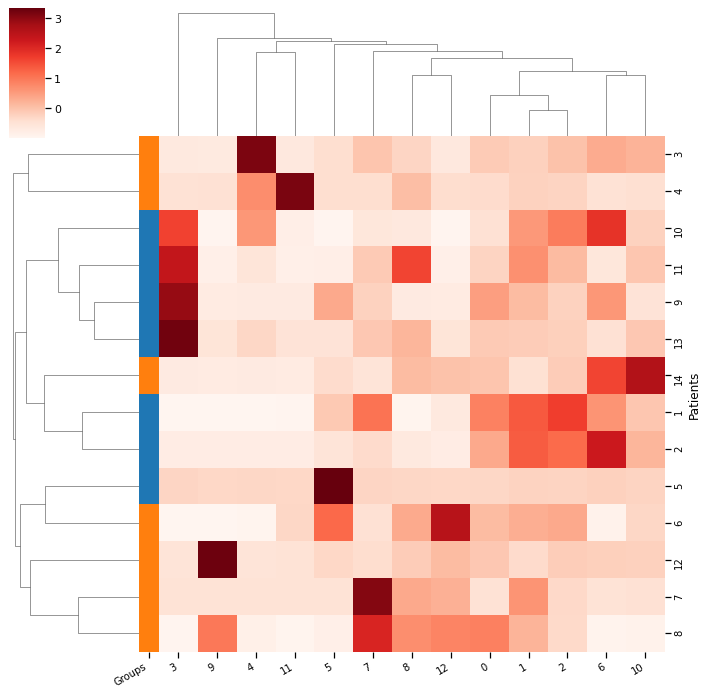

In [213]:
g, d = mosna.plot_heatmap(
    counts_clinic.reset_index(), 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    figsize=(10, 10),
    z_score=False,
    cmap=sns.color_palette("Reds", as_cmap=True),
    return_data=True,
    )

figname = f"resolution-{cluster_params['resolution_parameter']}{other_str}_biclustering_normalized-niche.png"
plt.savefig(cluster_dir / figname)

Text(0.5, 1.0, 'niche cell-types composition, normalized by niche')

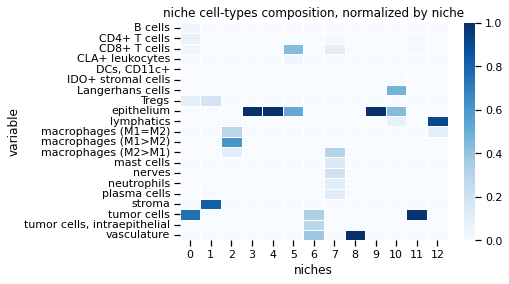

In [214]:
# mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types')
# plt.title("niche cell-types composition, normalized by total # cells")
mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types', normalize='niche')
plt.title("niche cell-types composition, normalized by niche")
# mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types', normalize='obs')
# plt.title("niche cell-types composition, normalized by cell-type")

That look just great, but even if the idea that we should also somehow take into account proportions per niche for normalization sounds correct, it doesn't seem right to ignore proportions per patient. For example if we normalize by the total number of cells we obtain again a very different result:

In [215]:
# proportion of cells in niches per sample, normalized per total count
counts = mosna.make_niches_composition(obj['FileName'], niches, var_label='variable', normalize='total')
counts

niches,0,1,2,3,4,5,6,7,8,9,10,11,12
variable,,,,,,,,,,,,,
reg001,0.009458,0.008328,0.008065,0.000000,0.000000,0.002680,0.002207,0.002391,0.000079,0.000000,0.000919,0.000000,0.000053
reg002,0.019309,0.015920,0.018179,0.000000,0.000000,0.000788,0.002785,0.003205,0.000026,0.000000,0.000736,0.000053,0.000053
reg005,0.000105,0.001235,0.000368,0.000000,0.000000,0.000053,0.001130,0.000026,0.000026,0.000000,0.000000,0.000000,0.000000
reg006,0.004440,0.004466,0.004650,0.000000,0.000000,0.000184,0.001366,0.000263,0.000026,0.000000,0.000447,0.000000,0.000000
reg009,0.010587,0.005149,0.009195,0.000210,0.025351,0.001392,0.004387,0.002049,0.000736,0.000000,0.002180,0.000053,0.000026
...,...,...,...,...,...,...,...,...,...,...,...,...,...
reg046,0.006620,0.002916,0.004098,0.000000,0.000000,0.000788,0.000919,0.000499,0.001314,0.003258,0.000552,0.000000,0.000263
reg051,0.005648,0.004072,0.002890,0.011191,0.000053,0.000053,0.000210,0.001077,0.002496,0.000000,0.000631,0.000105,0.000000
reg052,0.006699,0.003363,0.003363,0.026008,0.002286,0.000131,0.000236,0.001235,0.000631,0.000000,0.000893,0.000000,0.000000


In [216]:
# merge clinical data and proportion of cells in niches per sample
counts_clinic = pd.concat([status, counts], axis=1, join='inner').sort_values('Spots').fillna(0)
counts_clinic.drop(columns=['Spots'], inplace=True)
counts_clinic = counts_clinic.groupby(['Patients', 'Groups']).mean()

In [217]:
counts_clinic

,,0,1,2,3,4,5,6,7,8,9,10,11,12
Patients,Groups,,,,,,,,,,,,,
1,1,0.014383,0.012124,0.013122,0.000000,0.000000,0.001734,0.002496,0.002798,0.000053,0.000000,0.000828,0.000026,0.000053
2,1,0.002272,0.002850,0.002509,0.000000,0.000000,0.000118,0.001248,0.000144,0.000026,0.000000,0.000223,0.000000,0.000000
3,2,0.009904,0.005648,0.007829,0.000131,0.022987,0.001261,0.003599,0.002062,0.001130,0.000000,0.001878,0.000092,0.000013
4,2,0.002877,0.004794,0.003967,0.000013,0.011743,0.000539,0.000066,0.000381,0.002443,0.000092,0.000197,0.012702,0.000053
5,1,0.000131,0.000512,0.000328,0.000105,0.000039,0.011835,0.000236,0.000079,0.000013,0.000000,0.000066,0.000000,0.000000
6,2,0.017641,0.013595,0.013818,0.000000,0.000144,0.008919,0.000289,0.001471,0.003350,0.000000,0.001287,0.001353,0.001287
7,2,0.000053,0.002364,0.000342,0.000000,0.000000,0.000000,0.000000,0.002023,0.000420,0.000000,0.000013,0.000000,0.000053
8,2,0.019073,0.007916,0.003984,0.000026,0.000429,0.000377,0.000096,0.005552,0.002680,0.002504,0.000079,0.000018,0.000412
9,1,0.010640,0.004755,0.002719,0.011270,0.000026,0.002351,0.002312,0.000762,0.000026,0.000000,0.000210,0.000013,0.000000


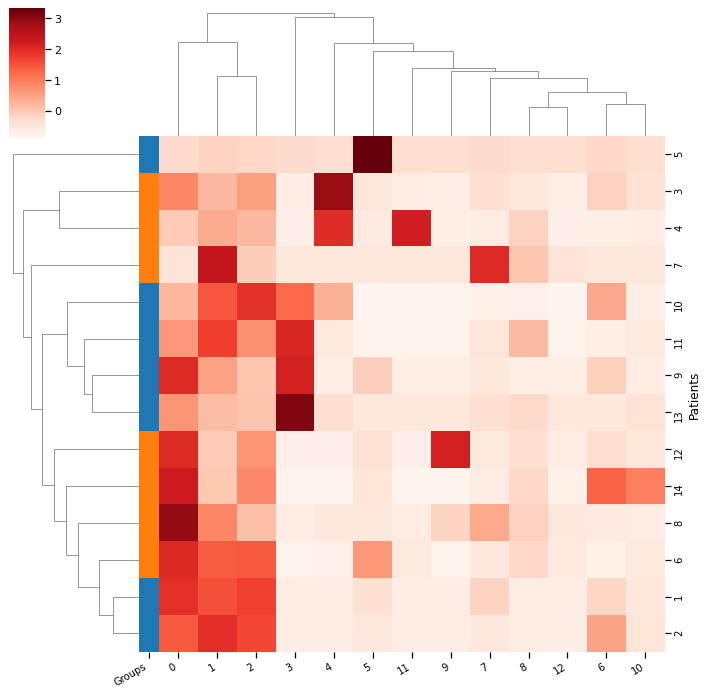

In [218]:
g, d =mosna.plot_heatmap(
    counts_clinic.reset_index(), 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    figsize=(10, 10),
    z_score=False,
    cmap=sns.color_palette("Reds", as_cmap=True),
    return_data=True,
    )

figname = f"resolution-{cluster_params['resolution_parameter']}{other_str}_biclustering_normalized-total.png"
plt.savefig(cluster_dir / figname)

A more statistically sound way to take jointly into account proportions per variable and per observation is the Central Log Ratio, that we already applied to protein composition:

In [219]:
# proportion of cells in niches per sample, normalized with Central Log Ratio
counts = mosna.make_niches_composition(obj['FileName'], niches, var_label='variable', normalize='clr')
counts

niches,0,1,2,3,4,5,6,7,8,9,10,11,12
variable,,,,,,,,,,,,,
reg001,4.490486,4.363284,4.331230,-5.931262,-5.931262,3.229355,3.035199,3.115242,-0.297006,-5.931262,2.159730,-5.931262,-0.702471
reg002,4.790135,4.597145,4.729851,-6.345380,-6.345380,1.591462,2.853704,2.994286,-1.809735,-6.345380,1.522469,-1.116588,-1.116588
reg005,2.531219,4.995072,3.783982,-3.390720,-3.390720,1.838072,4.906125,1.144924,1.144924,-3.390720,-3.390720,-3.390720,-3.390720
reg006,4.837854,4.843754,4.884105,-4.827689,-4.827689,1.653866,3.659199,2.010541,-0.292045,-4.827689,2.541169,-4.827689,-4.827689
reg009,2.657391,1.936569,2.516387,-1.262104,3.530582,0.628746,1.776448,1.015163,-0.009341,-7.877190,1.077295,-2.648399,-3.341546
...,...,...,...,...,...,...,...,...,...,...,...,...,...
reg046,3.555408,2.735509,3.075835,-6.509666,-6.509666,1.427176,1.581327,0.970417,1.938002,2.846260,1.070501,-6.509666,0.328564
reg051,3.186390,2.859177,2.516232,3.870191,-1.491101,-1.491101,-0.104807,1.529324,2.369629,-6.719892,0.993806,-0.797954,-6.719892
reg052,3.436400,2.747166,2.747166,4.792841,2.361044,-0.495426,0.092361,1.745284,1.073190,-6.640508,1.421497,-6.640508,-6.640508


In [220]:
# merge clinical data and proportion of cells in niches per sample
counts_clinic = pd.concat([status, counts], axis=1, join='inner').sort_values('Spots').fillna(0)
counts_clinic.drop(columns=['Spots'], inplace=True)
counts_clinic = counts_clinic.groupby(['Patients', 'Groups']).mean()

In [221]:
counts_clinic

,,0,1,2,3,4,5,6,7,8,9,10,11,12
Patients,Groups,,,,,,,,,,,,,
1,1,4.640311,4.480214,4.530540,-6.138321,-6.138321,2.410408,2.944451,3.054764,-1.053371,-6.138321,1.841100,-3.523925,-0.909530
2,1,3.684537,4.919413,4.334044,-4.109204,-4.109204,1.745969,4.282662,1.577733,0.426440,-4.109204,-0.424775,-4.109204,-4.109204
3,2,2.809985,2.246842,2.561756,-1.733582,3.649030,0.745870,1.775535,1.243202,0.576448,-7.655520,1.136716,-1.968584,-5.387698
4,2,1.505367,2.331608,2.169266,-5.110877,3.258399,0.152677,-1.947176,-0.219543,1.668227,-4.137922,-0.848563,3.328447,-2.149908
5,1,1.289039,2.695744,2.285254,1.120802,0.113351,5.870298,1.964002,0.806498,-2.501045,-4.768867,0.662657,-4.768867,-4.768867
6,2,3.708084,3.446781,3.460266,-7.336841,-1.212170,3.021954,-0.407451,1.216281,2.017456,-7.336841,1.085390,-2.751654,1.088746
7,2,1.846954,5.793491,3.812867,-3.237996,-3.237996,-3.237996,-3.237996,5.564968,3.656897,-3.237996,-0.970174,-3.237996,-0.277027
8,2,3.939494,3.151158,2.038240,-3.827018,-4.272675,-0.544890,-1.435451,2.632931,2.055703,1.929460,-1.621989,-4.058067,0.013102
9,1,4.649180,4.012481,3.459126,3.472269,-3.101122,-0.854003,3.289589,2.185038,-3.101122,-5.715518,0.867298,-3.447696,-5.715518


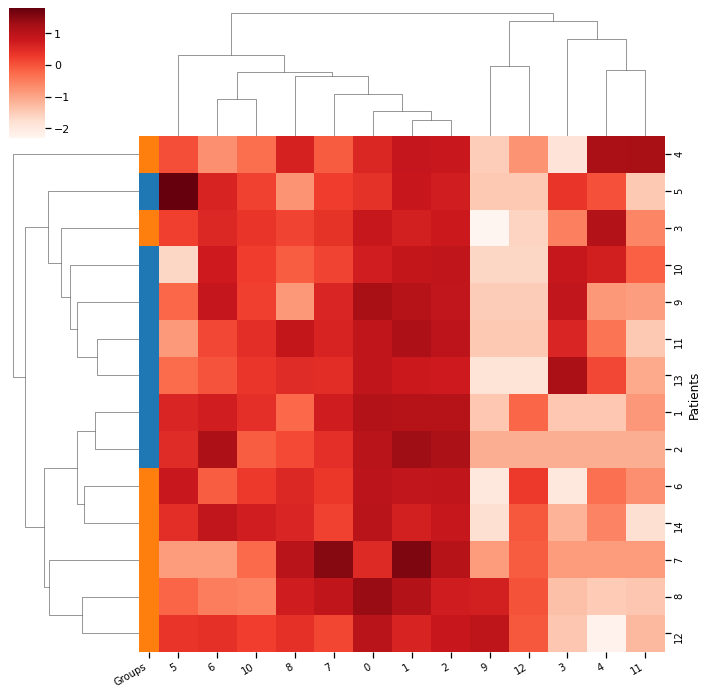

In [222]:
g, d =mosna.plot_heatmap(
    counts_clinic.reset_index(), 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    figsize=(10, 10),
    z_score=False,
    cmap=sns.color_palette("Reds", as_cmap=True),
    return_data=True,
    )

figname = f"resolution-{cluster_params['resolution_parameter']}{other_str}_biclustering_normalized-clr.png"
plt.savefig(cluster_dir / figname)

With this more statistically sound way of normalizing data we still obtain a good, although not perfect, blind clustering of patients into responders and non responders.

In [189]:
# the colorbar is just wrong
import seaborn as sns
cm = sns.light_palette("green", as_cmap=True)
s = d.style.background_gradient(cmap=cm)
s

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
Patients,,,,,,,,,,,,,,,,,,
1,4.709711,4.079832,4.234183,-6.017335,-3.378078,-1.085394,2.526618,3.553021,3.609602,3.066606,0.662860,3.155751,-3.031504,-6.017335,2.011808,-6.017335,-3.378078,-2.684931
2,4.786449,3.235278,5.329225,-3.709339,-3.709339,-1.416655,2.027321,-0.097126,3.710969,4.673722,1.771908,1.974641,-3.709339,-3.709339,-0.030361,-3.709339,-3.709339,-3.709339
3,3.060523,3.284595,2.458749,-1.278826,4.137485,-4.925535,1.177501,1.287895,-0.697251,2.281961,1.081018,0.800615,-1.390398,-7.218219,1.599045,-1.736972,-4.925535,1.003348
4,3.745875,3.309193,3.875648,-2.366848,4.825989,-3.565796,1.702209,0.336326,-5.858480,-0.377232,3.238170,1.086137,4.843574,-5.858480,0.721380,-5.858480,-0.926538,-2.872649
5,3.017820,1.317221,3.231542,2.290176,1.061808,-4.072865,6.608981,1.408382,1.408382,2.709727,-1.780182,1.552223,-4.072865,-4.072865,1.611114,-4.072865,-4.072865,-4.072865
6,3.428415,2.786507,3.003251,-7.422767,-1.248372,3.055464,2.955289,2.304196,-1.074219,-0.284427,1.981254,0.913970,-2.964717,-7.422767,0.891694,-1.189481,1.052543,-0.765832
7,4.324976,2.048038,6.222188,-2.883903,-2.883903,-0.591219,-2.883903,-2.883903,-2.883903,-0.591219,3.983638,5.913345,-2.883903,-2.883903,-0.591219,-2.883903,0.101928,2.250770
8,2.488410,2.296509,2.005034,0.615781,-4.175148,3.336321,-0.385828,2.993825,-0.119659,-3.266943,2.214765,2.510396,-3.915580,0.949725,-1.558822,-5.444036,0.172164,-0.716912
9,3.645428,4.771651,4.157127,3.599711,-0.208283,-3.305686,-0.723293,0.026719,1.269172,3.434813,-2.500967,2.007126,-3.305686,-5.598369,0.981490,-3.305686,-5.598369,0.653100


In [190]:
pvals = mosna.find_DE_markers(counts_clinic, group_ref=2, group_tgt=1, group_var='Groups')
pvals = pvals.sort_values(by='pval', ascending=True)

In [191]:
pvals.head(20)

,pval,pval_corr
16,0.008159,0.146853
8,0.053030,0.159091
1,0.053030,0.159091
2,0.053030,0.159091
3,0.053030,0.159091
11,0.053030,0.159091
5,0.212121,0.424242
14,0.212121,0.424242
9,0.212121,0.424242
15,0.575175,0.647072


In [261]:
counts_clinic

,,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
Patients,Groups,,,,,,,,,,,,,,,,
1,1,0.082975,0.083997,0.006266,0.070380,0.000304,0.000154,0.028370,0.083745,0.007651,0.064757,0.093058,0.000000,0.050091,0.000000,0.016279,0.005155
2,1,0.013497,0.015936,0.000989,0.023654,0.000000,0.000000,0.001589,0.004119,0.002661,0.031005,0.005030,0.000000,0.013661,0.000000,0.002326,0.000000
3,2,0.067025,0.050963,0.003408,0.040084,0.265359,0.002304,0.020881,0.028281,0.029607,0.082025,0.029175,0.000000,0.109290,0.007447,0.002326,0.005155
4,2,0.016334,0.025315,0.107960,0.041715,0.135189,0.002151,0.009079,0.002471,0.061876,0.000785,0.010060,0.000000,0.012750,0.000000,0.002326,0.005155
5,1,0.001150,0.002075,0.000000,0.003962,0.000912,0.002765,0.200409,0.000824,0.000333,0.007064,0.002515,0.000000,0.005464,0.002128,0.000000,0.000000
6,2,0.026074,0.088479,0.129068,0.082382,0.001673,0.000000,0.146618,0.089237,0.084830,0.006672,0.042757,0.000000,0.068306,0.011702,0.000000,0.247423
7,2,0.000383,0.002407,0.000330,0.021906,0.000000,0.000000,0.000000,0.000549,0.008649,0.000000,0.070926,0.000000,0.000911,0.000000,0.004651,0.010309
8,2,0.015491,0.032703,0.140721,0.023693,0.004968,0.020276,0.006204,0.114406,0.067642,0.002093,0.079142,0.033115,0.004857,0.000709,0.308527,0.080756
9,1,0.062347,0.017513,0.001429,0.041715,0.001369,0.131951,0.038130,0.002197,0.002329,0.065934,0.020121,0.000000,0.010929,0.004255,0.002326,0.000000


From this plot we would like to add niches 4 and 17 to those that seggregate patients into groups 1 and 2.

Add                              16 with p-value 0.000363948
Add                               4 with p-value 0.0406529
Add                              17 with p-value 0.0424053
Add                               2 with p-value 0.0361688


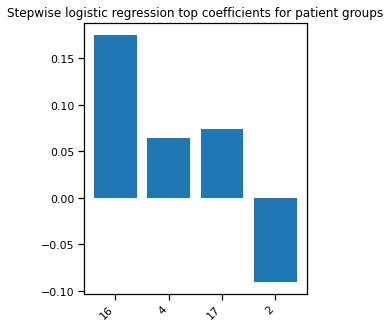

In [196]:
# Stepwise logistic regression
best_pval_names = pvals.loc[pvals['pval'] < 0.05, :].index.tolist()
if len(best_pval_names) > 0:
    model, included = mosna.stepwise_regression(X=counts_clinic, y_name='Groups', y_values=[1, 2], verbose=True)

    # plot the model's coefficients
    coefs = model.params[1:] # skip intercept
    nb_coefs = min(coefs.size, 20)
    if nb_coefs > 0:
        fig, ax = plt.subplots(figsize=(nb_coefs,5))
        ax.bar(range(len(coefs.index)), coefs)
        plt.xticks(ticks=range(len(coefs.index)), labels=coefs.index, rotation=45, ha='right');
        title = f"Stepwise logistic regression top coefficients for patient groups"
        plt.title(title)
else:
    print("There is no niche statistically related to response group")

##### Elasticnet logistic regression







-------------------------------------------
------------------- END -------------------
-------------------------------------------
Training took {duration}s


<Figure size 432x288 with 0 Axes>

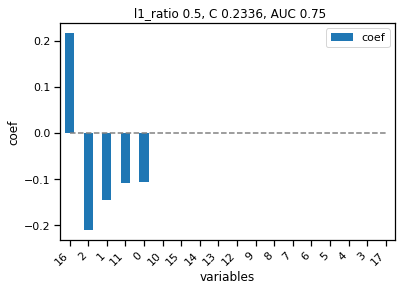

<Figure size 432x288 with 0 Axes>

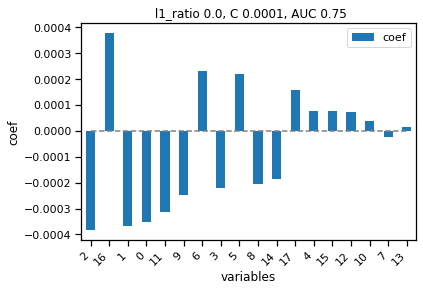

<Figure size 432x288 with 0 Axes>

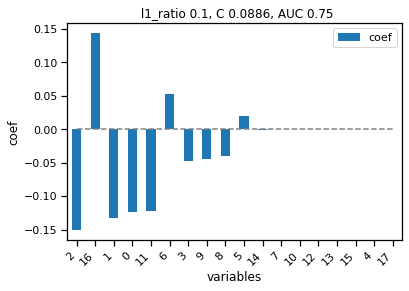

In [200]:
models = mosna.logistic_regression(
    counts_clinic,
    y_name='Groups',
    col_drop=['Patients'],
    )

In [ ]:
# save_dir = cluster_dir / (clusterer_name + "_spatial_networks_figures")
# save_dir.mkdir(parents=True, exist_ok=True)

# sample_ids = [
#     "reg001",
#     "reg003",
#     "reg005",
#     "reg006",
#     "reg037",
#     "reg040",
#     "reg042",
#     "reg051",
#     "reg054",
#     "reg055",
#     "reg016",
#     "reg058",
#     "reg060",
#     "reg019",
# ]

# # choose colormap
# if nb_clust <= 20:
#     clusters_cmap = sns.color_palette('Paired', 20)
#     cluster_colors = [clusters_cmap[x] if x >= 0
#                       else (0.5, 0.5, 0.5)
#                       for x in cluster_labels]
# else:
#     clusters_cmap = cc.palette["glasbey"]
#     # make color mapper
#     # series to sort by decreasing order
#     uniq = pd.Series(cluster_labels).value_counts().index.astype(int)
#     n_colors = len(clusters_cmap)
#     labels_color_mapper = {x: clusters_cmap[i % n_colors] for i, x in enumerate(uniq)}
#     labels_color_mapper[-1] = (0.5, 0.5, 0.5)
#     cluster_colors = np.array([labels_color_mapper[x] for x in cluster_labels])

# # colormap for cell-types
# n_cell_types = obj['ClusterName'].unique().size
# # palette = sns.color_palette(cc.glasbey, n_colors=n_cell_types).as_hex()
# palette = [mpl.colors.rgb2hex(x) for x in mpl.cm.get_cmap('tab20').colors]

# plots_marker = '.'
# for sample in sample_ids:
#     print("filename: {}".format(sample))
#     select = np.array(obj['FileName'] == sample)

#     # load nodes and edges
#     coords = obj.loc[select, cell_pos_cols].values
#     pairs = edges_all.loc[edges_all['filename'] == sample, ['source', 'target']].values

#     # Big summary plot
#     fig, ax = plt.subplots(1, 4, figsize=(int(7*4)+1, 7), tight_layout=False)
#     i = 0
#     ty.plot_network(coords, pairs, labels=obj.loc[select, 'ClusterName'], cmap_nodes=palette, marker=plots_marker, size_nodes=size_points, ax=ax[0])
#     ax[i].set_title('Spatial map of phenotypes', fontsize=14);

#     i += 1
#     ax[i].scatter(coords[:, 0], coords[:, 1], c=cluster_colors[select], marker=plots_marker, s=size_points)
#     ax[i].set_title('Spatial map of detected areas', fontsize=14);
#     ax[i].set_aspect('equal')

#     i += 1
#     ax[i].scatter(embed_viz[select, 0], embed_viz[select, 1], c=cluster_colors[select], s=5);
#     ax[i].set_title("HDBSCAN clustering on NAS", fontsize=14);
#     ax[i].set_aspect('equal')

#     i += 1
#     ax[i].scatter(embed_viz[:, 0], embed_viz[:, 1], c=cluster_colors);
#     ax[i].set_title("HDBSCAN clustering on NAS of all samples", fontsize=14);
#     ax[i].set_aspect('equal')
    
#     # make plot limits equal
#     ax[i-1].set_xlim(ax[i].get_xlim())
#     ax[i-1].set_ylim(ax[i].get_ylim())

#     suptitle = f"Spatial omics data and detected areas - sample {sample}";
#     fig.suptitle(suptitle, fontsize=18)

#     fig.savefig(save_dir / suptitle, bbox_inches='tight', facecolor='white', dpi=300)

#### Explore different clustering wrt survival

In [ ]:
# for dim_clust in tqdm([2, 3, 4, 5], leave=False):
for dim_clust in tqdm([2], leave=False):
    for n_neighbors in tqdm([15, 45, 75, 100, 200], leave=False):
        for metric in tqdm(['euclidean', 'cosine'], leave=False):
            for k_cluster in tqdm([15, 50], leave=False):
                for resolution_parameter in [0.005, 0.01, 0.05, 0.1, 0.5]:
                    cluster_params = {
                        'reducer_type': 'umap', 
                        'n_neighbors': n_neighbors, 
                        'metric': metric,
                        'min_dist': 0.0,
                        'clusterer_type': 'leiden', 
                        'dim_clust': dim_clust, 
                        'k_cluster': 15, 
                        'resolution_parameter': resolution_parameter,
                    }

                    cluster_labels, cluster_dir, nb_clust, _ = mosna.get_clusterer(var_aggreg, nas_dir, **cluster_params)

                    # Survival analysis (just heatmap for now)
                    niches = cluster_labels
                    for normalize in ['total', 'niche', 'obs', 'clr']:
                        counts = mosna.make_niches_composition(obj['FileName'], niches, var_label='variable', normalize=normalize)
                        # merge clinical data and proportion of cells in niches per sample
                        # counts_clinic = pd.concat([status, counts], axis=1, join='inner').sort_values('Spots').fillna(0)
                        counts_clinic = pd.concat([status, counts], axis=1, join='inner').fillna(0)
                        # counts_clinic.drop(columns=['Spots'], inplace=True)
                        counts_clinic = counts_clinic.groupby(['Patients', 'Groups']).mean()

                        # plot heatmap
                        g, d = mosna.plot_heatmap(
                            counts_clinic.reset_index(), 
                            obs_labels='Patients', 
                            group_var='Groups', 
                            groups=[1, 2],
                            figsize=(10, 10),
                            z_score=False,
                            cmap=sns.color_palette("Reds", as_cmap=True),
                            return_data=True,
                            )
                        # str_params = '_'.join([str(key) + '-' + str(val) for key, val in cluster_params.items()])
                        figname = f"biclustering_resolution-{resolution_parameter}_normalized-{normalize}.png"
                        plt.savefig(cluster_dir / figname, dpi=150)

### Final parameters

```
reducer-umap_dim-2_nneigh-200_metric-euclidean_min_dist-0.0/clusterer-leiden_n_neighbors-15/biclustering_resolution-0.05_normalized-niche  
reducer-umap_dim-2_nneigh-75_metric-euclidean_min_dist-0.0/clusterer-leiden_n_neighbors-15/biclustering_resolution-0.05_normalized-clr  
reducer-umap_dim-2_nneigh-75_metric-euclidean_min_dist-0.0/clusterer-leiden_n_neighbors-15/biclustering_resolution-0.05_normalized-obs
```

#### nneigh = 75

In [212]:
cluster_params = {
    'reducer_type': 'umap', 
    'n_neighbors': 75, 
    'metric': 'euclidean', 
    'min_dist': 0.0,
    'clusterer_type': 'leiden', 
    'dim_clust': 2, 
    'k_cluster': 15, 
    'resolution_parameter': 0.05,
}

cluster_labels, cluster_dir, nb_clust, _ = mosna.get_clusterer(var_aggreg, nas_dir, **cluster_params)

Loading clusterer object and cluster labels
There are 17 clusters


In [213]:
nas_dir

PosixPath('../data/processed/CODEX_CTCL/pretreatment_samples_networks_xy_trim_dist-200_solitary-0/nas_on-markers_stats-mean-std_order-1')

Loading reducer object and reduced coordinates


(<Figure size 720x720 with 1 Axes>, <AxesSubplot:>)

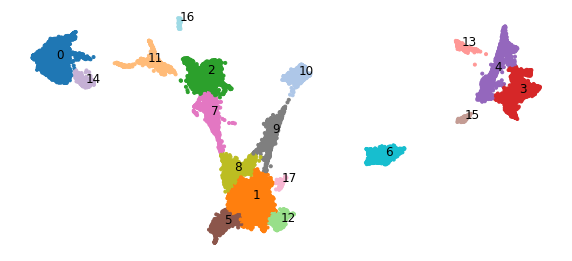

In [214]:
embed_viz, _ = mosna.get_reducer(var_aggreg, nas_dir, reducer_type='umap', n_neighbors=cluster_params['n_neighbors'])
mosna.plot_clusters(embed_viz, cluster_labels, nas_dir, cluster_params=cluster_params)

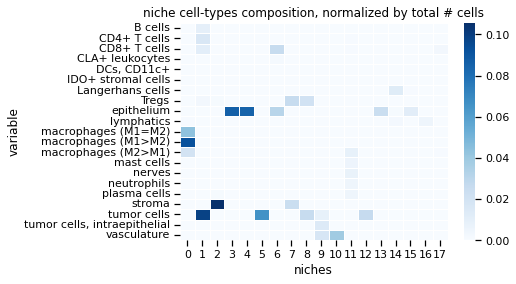

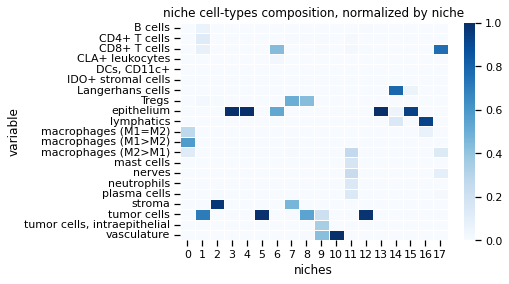

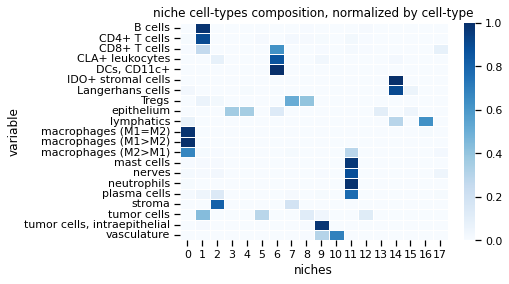

In [215]:
# Survival analysis

cell_types = nodes_all['CellCluster']
niches = cluster_labels

mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types')
title = "niche cell-types composition, normalized by total # cells"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types', normalize='niche')
title = "niche cell-types composition, normalized by niche"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types', normalize='obs')
title = "niche cell-types composition, normalized by cell-type"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

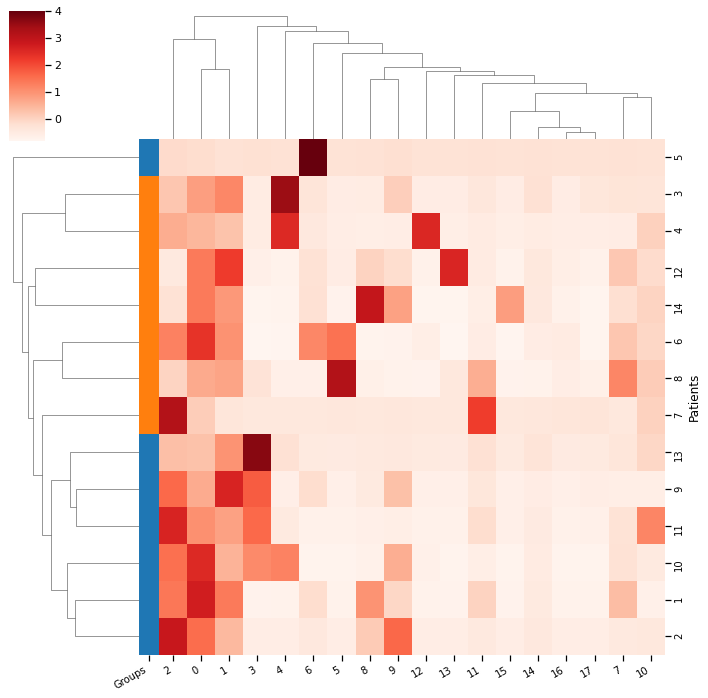

In [216]:
# proportion of cells in niches per sample
other_str = ''
counts = mosna.make_niches_composition(obj['FileName'], niches, var_label='variable', normalize='obs')
# merge clinical data and proportion of cells in niches per sample
counts_clinic = pd.concat([status, counts], axis=1, join='inner').sort_values('Spots').fillna(0)
counts_clinic.drop(columns=['Spots'], inplace=True)
counts_clinic = counts_clinic.groupby(['Patients', 'Groups']).mean()
# heatmap
g, d =mosna.plot_heatmap(
    counts_clinic.reset_index(), 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    figsize=(10, 10),
    z_score=False,
    cmap=sns.color_palette("Reds", as_cmap=True),
    return_data=True,
    )

figname = f"resolution-{cluster_params['resolution_parameter']}{other_str}_biclustering_normalized-obs.png"
plt.savefig(cluster_dir / figname)

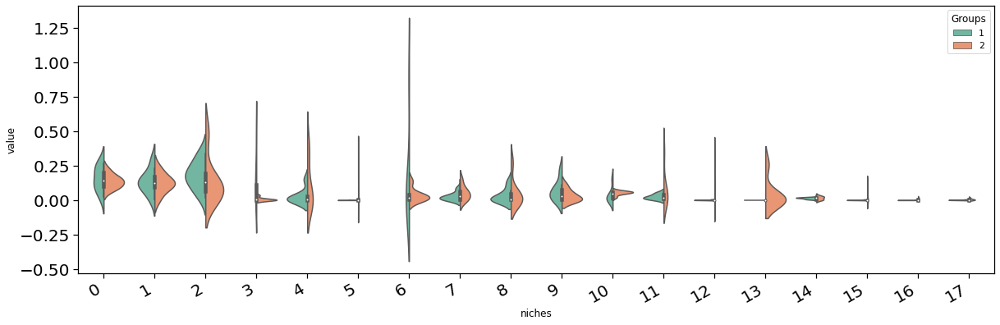

In [217]:
pvals = mosna.find_DE_markers(counts_clinic, group_ref=2, group_tgt=1, group_var='Groups')
pvals = pvals.sort_values(by='pval', ascending=True)

# DE analysis
fig, ax = mosna.plot_distrib_groups(
    counts_clinic, 
    group_var='Groups',
    groups=[1, 2], 
    pval_data=None,
    multi_ind_to_col=True,
    var_name='niches',
    )

Add                              16 with p-value 0.0100267
Add                               4 with p-value 0.00839606


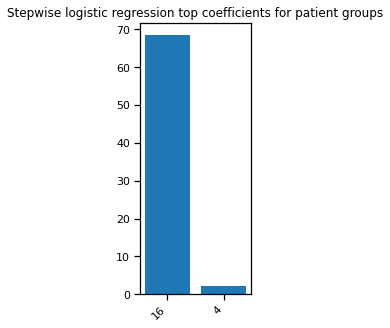

In [218]:
# Stepwise logistic regression
best_pval_names = pvals.loc[pvals['pval'] < 0.05, :].index.tolist()
if len(best_pval_names) > 0:
    model, included = mosna.stepwise_regression(X=counts_clinic, y_name='Groups', y_values=[1, 2], verbose=True)

    # plot the model's coefficients
    coefs = model.params[1:] # skip intercept
    nb_coefs = min(coefs.size, 20)
    if nb_coefs > 0:
        fig, ax = plt.subplots(figsize=(nb_coefs,5))
        ax.bar(range(len(coefs.index)), coefs)
        plt.xticks(ticks=range(len(coefs.index)), labels=coefs.index, rotation=45, ha='right');
        title = f"Stepwise logistic regression top coefficients for patient groups"
        plt.title(title)
else:
    print("There is no niche statistically related to response group")

Training took {duration}s


<Figure size 432x288 with 0 Axes>

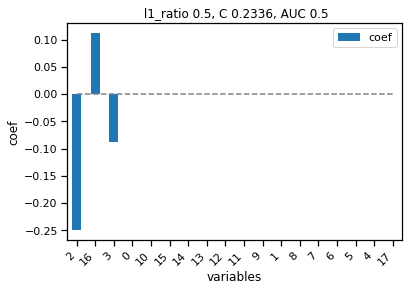

<Figure size 432x288 with 0 Axes>

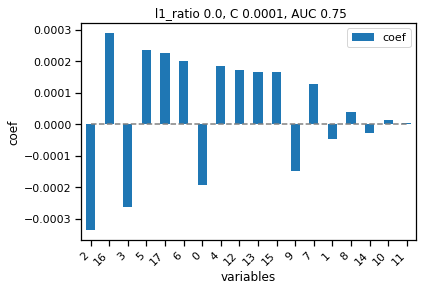

<Figure size 432x288 with 0 Axes>

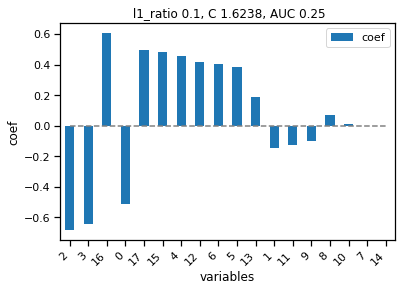

In [219]:
models = mosna.logistic_regression(
    counts_clinic,
    y_name='Groups',
    col_drop=['Patients'],
    )

Text(0.5, 1.0, 'niche cell-types composition, normalized by niche')

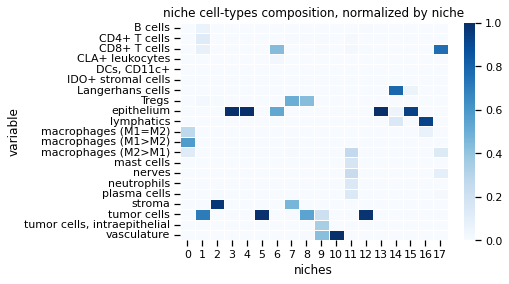

In [220]:
# as a reminder:
mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types', normalize='niche')
plt.title("niche cell-types composition, normalized by niche")

Ok not so interesting, and perfomances are not great

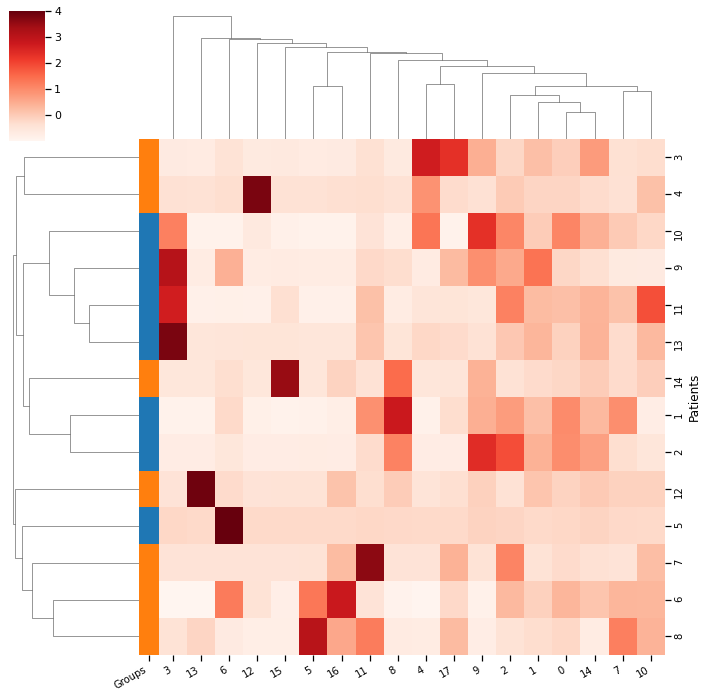

In [160]:
# proportion of cells in niches per sample, normalized per niche total count
counts = mosna.make_niches_composition(obj['FileName'], niches, var_label='variable', normalize='niche')
# merge clinical data and proportion of cells
counts_clinic = pd.concat([status, counts], axis=1, join='inner').sort_values('Spots').fillna(0)
counts_clinic.drop(columns=['Spots'], inplace=True)
counts_clinic = counts_clinic.groupby(['Patients', 'Groups']).mean()
# heatmap
g, d = mosna.plot_heatmap(
    counts_clinic.reset_index(), 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    figsize=(10, 10),
    z_score=False,
    cmap=sns.color_palette("Reds", as_cmap=True),
    return_data=True,
    )

figname = f"resolution-{cluster_params['resolution_parameter']}{other_str}_biclustering_normalized-niche.png"
plt.savefig(cluster_dir / figname)

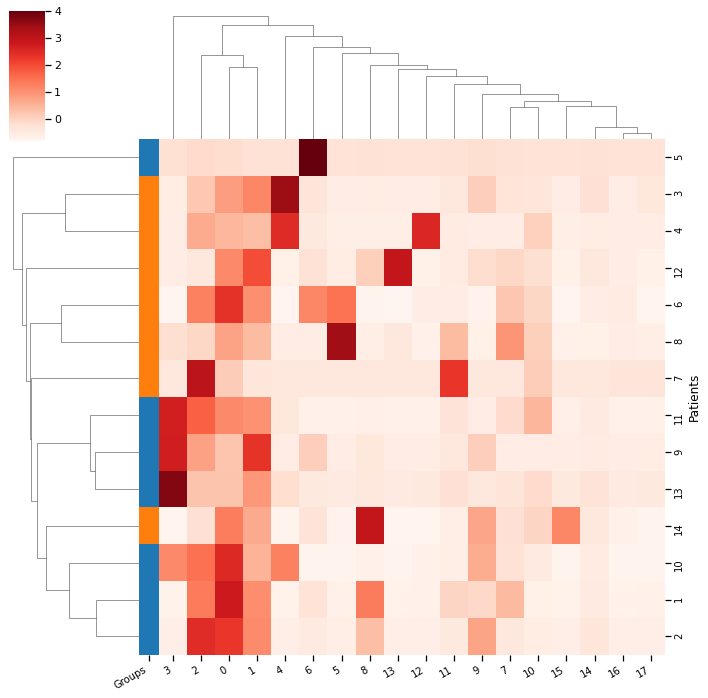

In [161]:
# proportion of cells in niches per sample, normalized per total count
counts = mosna.make_niches_composition(obj['FileName'], niches, var_label='variable', normalize='total')
# merge clinical data and proportion of cells in niches per sample
counts_clinic = pd.concat([status, counts], axis=1, join='inner').sort_values('Spots').fillna(0)
counts_clinic.drop(columns=['Spots'], inplace=True)
counts_clinic = counts_clinic.groupby(['Patients', 'Groups']).mean()
# heatmap
g, d =mosna.plot_heatmap(
    counts_clinic.reset_index(), 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    figsize=(10, 10),
    z_score=False,
    cmap=sns.color_palette("Reds", as_cmap=True),
    return_data=True,
    )

figname = f"resolution-{cluster_params['resolution_parameter']}{other_str}_biclustering_normalized-total.png"
plt.savefig(cluster_dir / figname)


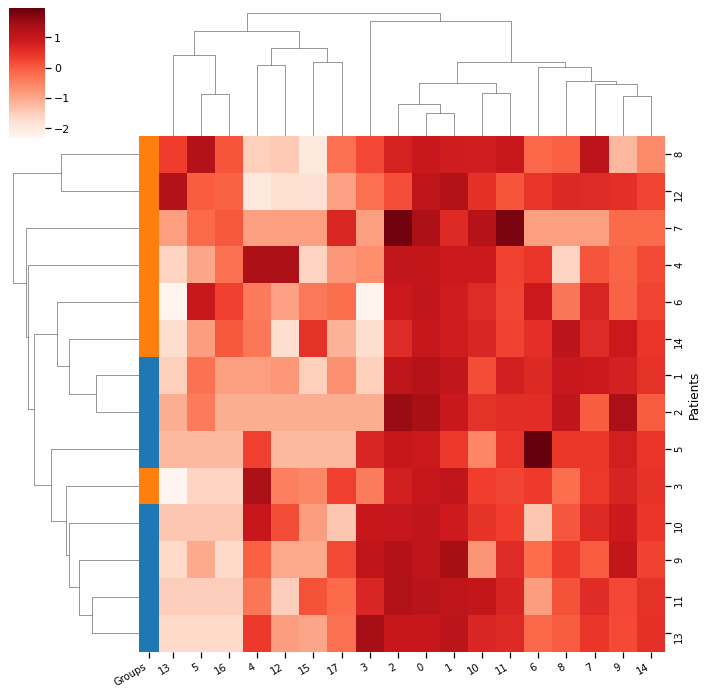

In [162]:
# proportion of cells in niches per sample, normalized with Central Log Ratio
counts = mosna.make_niches_composition(obj['FileName'], niches, var_label='variable', normalize='clr')
# merge clinical data and proportion of cells in niches per sample
counts_clinic = pd.concat([status, counts], axis=1, join='inner').sort_values('Spots').fillna(0)
counts_clinic.drop(columns=['Spots'], inplace=True)
counts_clinic = counts_clinic.groupby(['Patients', 'Groups']).mean()
# heatmap
g, d =mosna.plot_heatmap(
    counts_clinic.reset_index(), 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    figsize=(10, 10),
    z_score=False,
    cmap=sns.color_palette("Reds", as_cmap=True),
    return_data=True,
    )

figname = f"resolution-{cluster_params['resolution_parameter']}{other_str}_biclustering_normalized-clr.png"
plt.savefig(cluster_dir / figname)

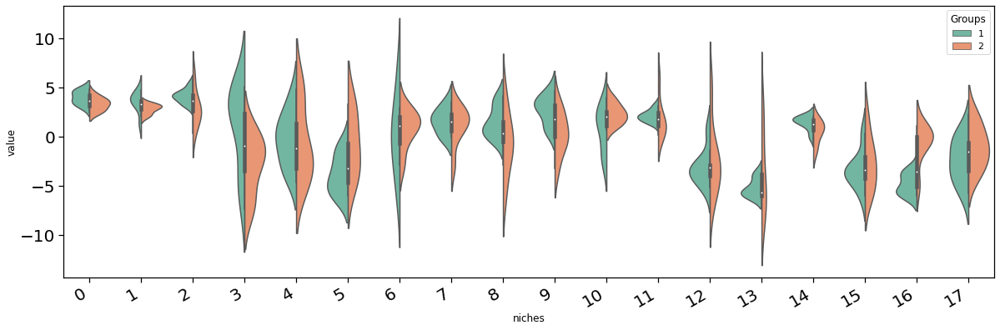

In [163]:
pvals = mosna.find_DE_markers(counts_clinic, group_ref=2, group_tgt=1, group_var='Groups')
pvals = pvals.sort_values(by='pval', ascending=True)

# DE analysis
fig, ax = mosna.plot_distrib_groups(
    counts_clinic, 
    group_var='Groups',
    groups=[1, 2], 
    pval_data=None,
    multi_ind_to_col=True,
    var_name='niches',
    )

Add                              16 with p-value 0.000363948
Add                               4 with p-value 0.0406529
Add                              17 with p-value 0.0424053
Add                               2 with p-value 0.0361688


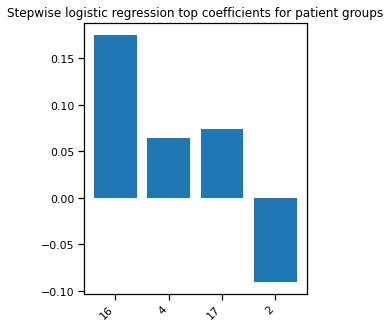

In [164]:
# Stepwise logistic regression
best_pval_names = pvals.loc[pvals['pval'] < 0.05, :].index.tolist()
if len(best_pval_names) > 0:
    model, included = mosna.stepwise_regression(X=counts_clinic, y_name='Groups', y_values=[1, 2], verbose=True)

    # plot the model's coefficients
    coefs = model.params[1:] # skip intercept
    nb_coefs = min(coefs.size, 20)
    if nb_coefs > 0:
        fig, ax = plt.subplots(figsize=(nb_coefs,5))
        ax.bar(range(len(coefs.index)), coefs)
        plt.xticks(ticks=range(len(coefs.index)), labels=coefs.index, rotation=45, ha='right');
        title = f"Stepwise logistic regression top coefficients for patient groups"
        plt.title(title)
else:
    print("There is no niche statistically related to response group")

Training took {duration}s


<Figure size 432x288 with 0 Axes>

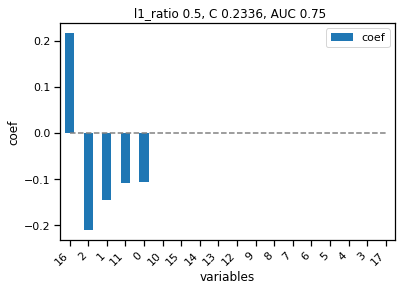

<Figure size 432x288 with 0 Axes>

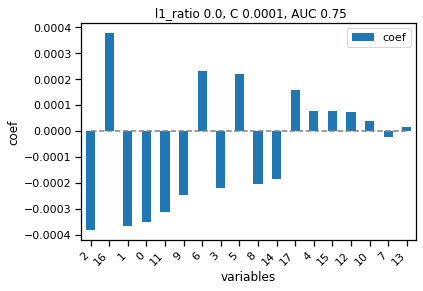

<Figure size 432x288 with 0 Axes>

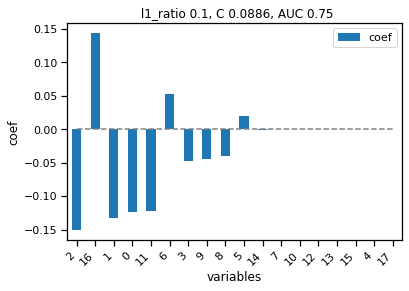

In [165]:
models = mosna.logistic_regression(
    counts_clinic,
    y_name='Groups',
    col_drop=['Patients'],
    )

Text(0.5, 1.0, 'niche cell-types composition, normalized by niche')

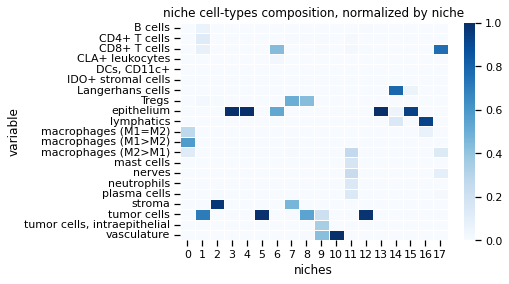

In [80]:
# as a reminder:
mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types', normalize='niche')
plt.title("niche cell-types composition, normalized by niche")

AUC 0.75

Niches that matter:
  - 16: lymphatics + macrophages (M1=M2)
  - 2: stroma only
  - 1: tumor cells + B cells + CD4+ T cells + CD8+ T cells
  - 0: macrophages, all 3 definitions
Interestingly, niches of pure epithelium or *even* pure cancer cells don't matter.

Also from step-wise LR:
  - 16: lymphatics + macrophages (M1=M2)
  - 4: epithelium
  - 17: CD8+ T cells + macrophages (M2 > M1)
  - 2: stroma

#### nneigh = 200

In [44]:
cluster_params = {
    'reducer_type': 'umap', 
    'n_neighbors': 200, 
    'metric': 'euclidean', 
    'min_dist': 0.0,
    'clusterer_type': 'leiden', 
    'dim_clust': 2, 
    'k_cluster': 15, 
    'resolution_parameter': 0.05,
}

cluster_labels, cluster_dir, nb_clust, _ = mosna.get_clusterer(var_aggreg, nas_dir, **cluster_params)

Loading clusterer object and cluster labels
There are 15 clusters


In [46]:
nas_dir

PosixPath('../data/processed/CODEX_CTCL/pretreatment_samples_networks_xy_trim_dist-200_solitary-0/nas_on-markers_stats-mean-std_order-1')

Loading reducer object and reduced coordinates


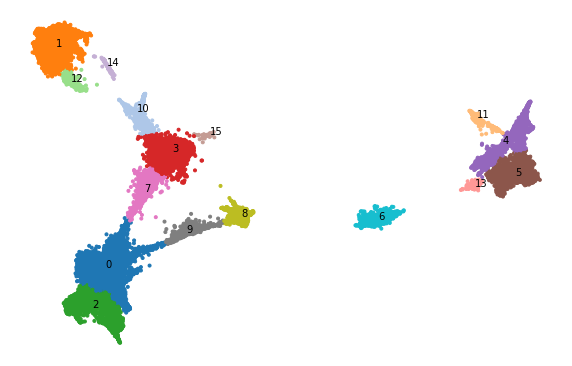

In [47]:
embed_viz, _ = mosna.get_reducer(var_aggreg, nas_dir, reducer_type='umap', n_neighbors=cluster_params['n_neighbors'])
fig, ax, niches_color_mapper = mosna.plot_clusters(embed_viz, cluster_labels, nas_dir, cluster_params=cluster_params, return_cmap=True)

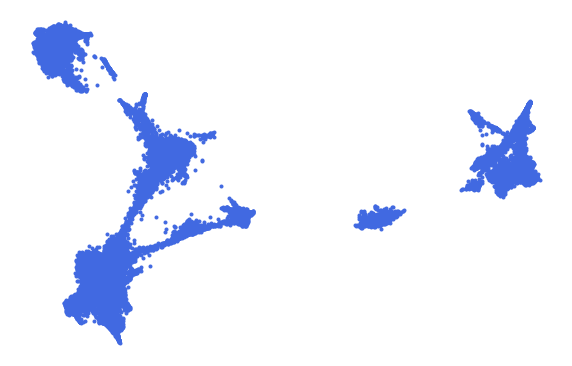

In [177]:
fig, ax = mosna.plot_clusters(embed_viz, save_dir=nas_dir, extra_str='_no_clustering', show_id=False, cluster_params=cluster_params, return_cmap=False)

Loading reducer object and reduced coordinates


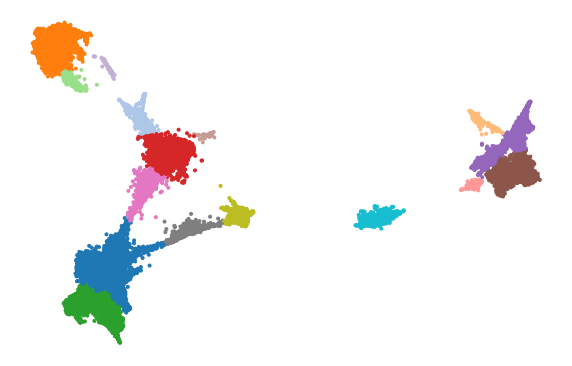

In [179]:
embed_viz, _ = mosna.get_reducer(var_aggreg, nas_dir, reducer_type='umap', n_neighbors=cluster_params['n_neighbors'])
fig, ax, niches_color_mapper = mosna.plot_clusters(embed_viz, cluster_labels, nas_dir, extra_str='_no_cluster_id', show_id=False, cluster_params=cluster_params, return_cmap=True)

In [ ]:
# save_dir = cluster_dir / 'spatial_networks_niches'
# save_dir.mkdir(parents=True, exist_ok=True)

# # colormap for cell-types
# n_cell_types = obj['ClusterName'].unique().size
# # palette = sns.color_palette(cc.glasbey, n_colors=n_cell_types).as_hex()
# # palette = [mpl.colors.rgb2hex(x) for x in mpl.cm.get_cmap('tab20').colors]
# niche_colors = np.array([niches_color_mapper[x] for x in cluster_labels])

# plots_marker = '.'
# for sample in obj['FileName'].unique():
#     print("filename: {}".format(sample))
#     select = np.array(obj['FileName'] == sample)

#     # load nodes and edges
#     coords = obj.loc[select, cell_pos_cols].values
#     # TODO: find a way to reuse pairs compatible with aggregated nodes
#     # pairs = edges_all.loc[edges_all['filename'] == sample, ['source', 'target']].values
#     pairs = ty.build_delaunay(coords, trim_dist=trim_dist)
#     if k_sol > 0:
#         pairs = ty.link_solitaries(coords, pairs, method='knn', k=k_sol)

    # # Big summary plot
    # fig, ax = plt.subplots(1, 4, figsize=(int(7*4)+1, 7), tight_layout=False)
    # i = 0
    # ty.plot_network(coords, 
    #                 pairs,
    #                 labels=obj.loc[select, 'ClusterName'], 
    #                 color_mapper=celltypes_color_mapper, 
    #                 marker=plots_marker, 
    #                 size_nodes=size_points, 
    #                 ax=ax[0])
    # ax[i].set_title('Spatial map of phenotypes', fontsize=14);

    # i += 1
    # ax[i].scatter(coords[:, 0], coords[:, 1], c=niche_colors[select], marker=plots_marker, s=size_points)
    # ax[i].set_title('Spatial map of detected areas', fontsize=14);
    # ax[i].set_aspect('equal')

    # i += 1
    # ax[i].scatter(embed_viz[select, 0], embed_viz[select, 1], c=niche_colors[select], s=5);
    # ax[i].set_title("Clustering on NAS", fontsize=14);
    # ax[i].set_aspect('equal')

    # i += 1
    # ax[i].scatter(embed_viz[:, 0], embed_viz[:, 1], c=niche_colors);
    # ax[i].set_title("Clustering on NAS of all samples", fontsize=14);
    # ax[i].set_aspect('equal')
    
    # # make plot limits equal
    # ax[i-1].set_xlim(ax[i].get_xlim())
    # ax[i-1].set_ylim(ax[i].get_ylim())

    # suptitle = f"Spatial omics data and detected areas - sample {sample}";
    # fig.suptitle(suptitle, fontsize=18)

    # fig.savefig(save_dir / suptitle, bbox_inches='tight', facecolor='white', dpi=600)
    # plt.show()


    # fig, ax = plt.subplots(figsize=(10, 10))
    # ax.scatter(coords[:, 0], coords[:, 1], c=niche_colors[select], marker=plots_marker, s=size_points*4)
    # ax.set_title('Spatial map of detected areas', fontsize=14);
    # ax.set_aspect('equal')
    # fig.savefig(save_dir / f'spatial_niches_sample-{sample}_bignodes', bbox_inches='tight', facecolor='white', dpi=600)
    # plt.show()

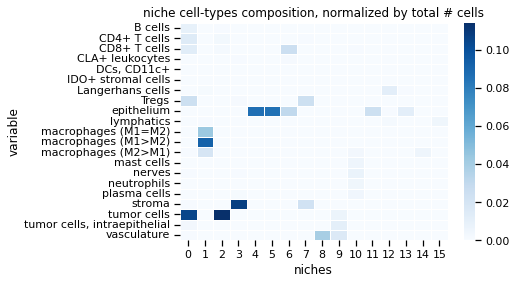

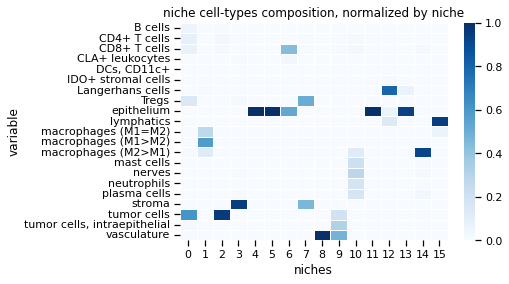

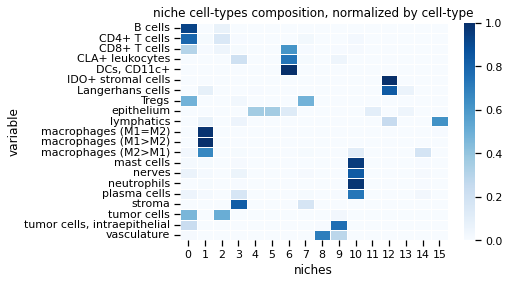

In [225]:
# Survival analysis

cell_types = nodes_all['CellCluster']
niches = cluster_labels

mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types')
title = "niche cell-types composition, normalized by total # cells"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types', normalize='niche')
title = "niche cell-types composition, normalized by niche"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types', normalize='obs')
title = "niche cell-types composition, normalized by cell-type"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

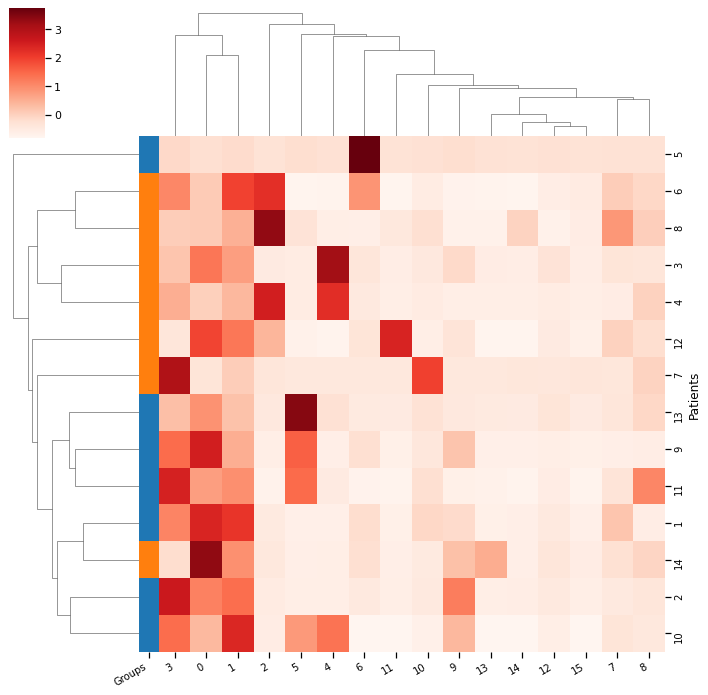

In [226]:
# proportion of cells in niches per sample
other_str = ''
counts = mosna.make_niches_composition(obj['FileName'], niches, var_label='variable', normalize='obs')
# merge clinical data and proportion of cells in niches per sample
counts_clinic = pd.concat([status, counts], axis=1, join='inner').sort_values('Spots').fillna(0)
counts_clinic.drop(columns=['Spots'], inplace=True)
counts_clinic = counts_clinic.groupby(['Patients', 'Groups']).mean()
# heatmap
g, d =mosna.plot_heatmap(
    counts_clinic.reset_index(), 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    figsize=(10, 10),
    z_score=False,
    cmap=sns.color_palette("Reds", as_cmap=True),
    return_data=True,
    )

figname = f"resolution-{cluster_params['resolution_parameter']}{other_str}_biclustering_normalized-obs.png"
plt.savefig(cluster_dir / figname)

Training took {duration}s


<Figure size 432x288 with 0 Axes>

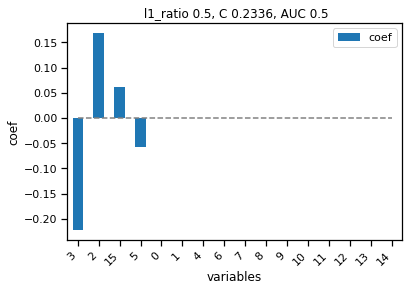

<Figure size 432x288 with 0 Axes>

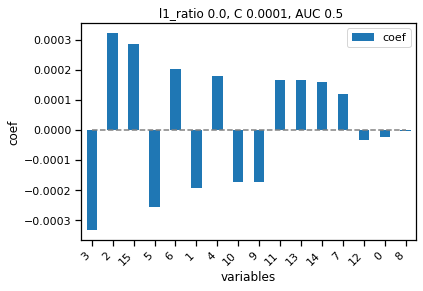

<Figure size 432x288 with 0 Axes>

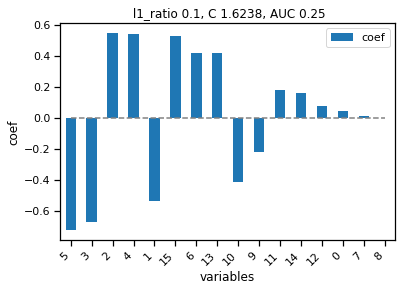

In [227]:
models = mosna.logistic_regression(
    counts_clinic,
    y_name='Groups',
    col_drop=['Patients'],
    )

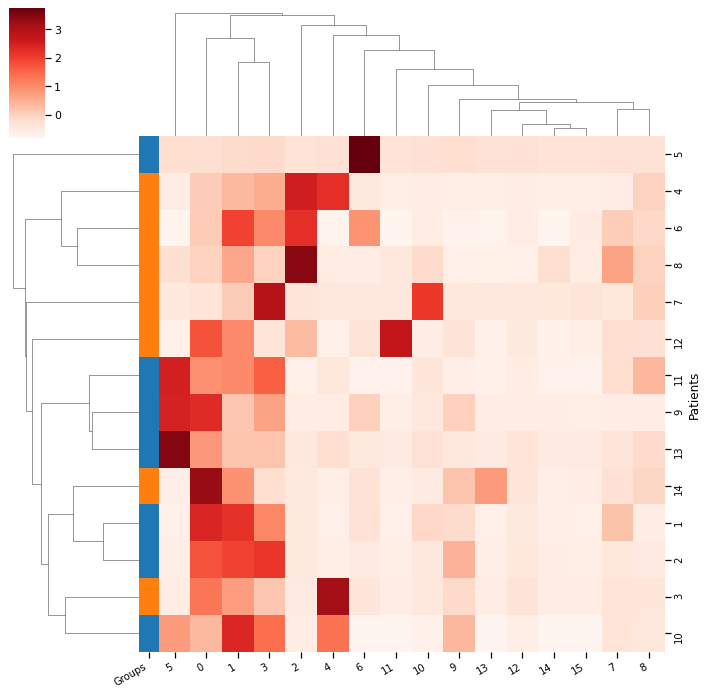

In [228]:
# proportion of cells in niches per sample, normalized per total count
counts = mosna.make_niches_composition(obj['FileName'], niches, var_label='variable', normalize='total')
# merge clinical data and proportion of cells in niches per sample
counts_clinic = pd.concat([status, counts], axis=1, join='inner').sort_values('Spots').fillna(0)
counts_clinic.drop(columns=['Spots'], inplace=True)
counts_clinic = counts_clinic.groupby(['Patients', 'Groups']).mean()
# heatmap
g, d =mosna.plot_heatmap(
    counts_clinic.reset_index(), 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    figsize=(10, 10),
    z_score=False,
    cmap=sns.color_palette("Reds", as_cmap=True),
    return_data=True,
    )

figname = f"resolution-{cluster_params['resolution_parameter']}{other_str}_biclustering_normalized-total.png"
plt.savefig(cluster_dir / figname)


Training took {duration}s


<Figure size 432x288 with 0 Axes>

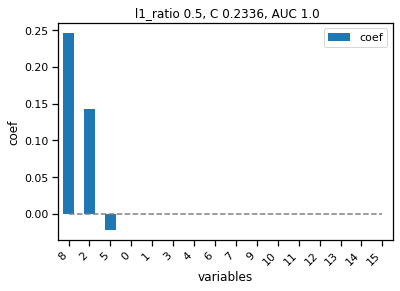

<Figure size 432x288 with 0 Axes>

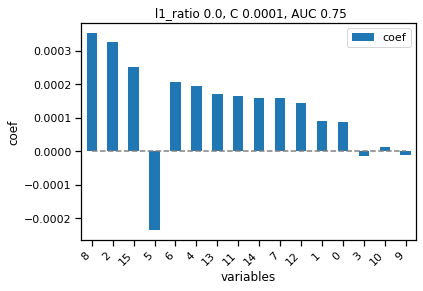

<Figure size 432x288 with 0 Axes>

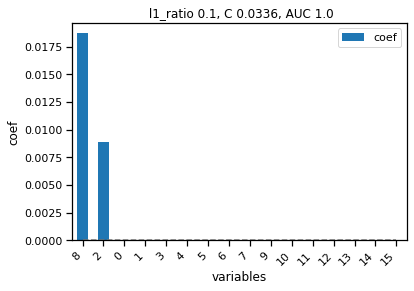

In [230]:
models = mosna.logistic_regression(
    counts_clinic,
    y_name='Groups',
    col_drop=['Patients'],
    )

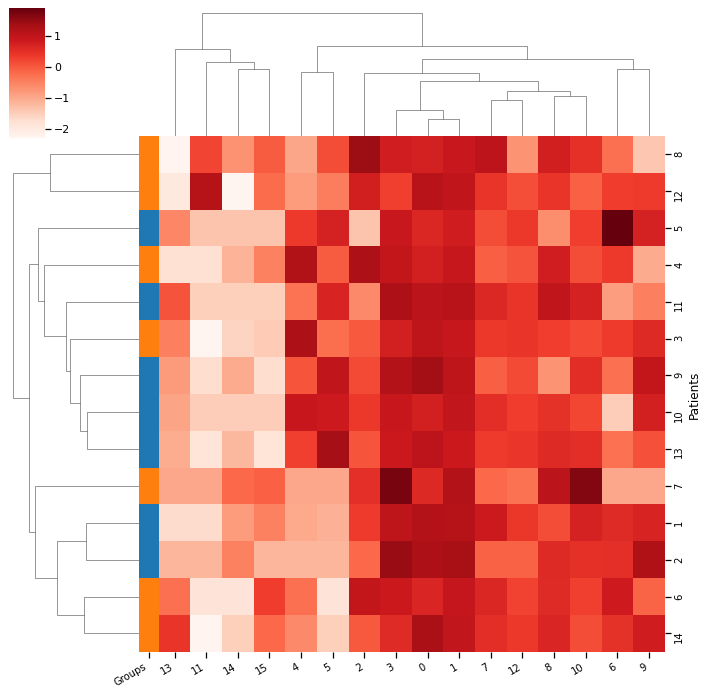

In [231]:
# proportion of cells in niches per sample, normalized with Central Log Ratio
counts = mosna.make_niches_composition(obj['FileName'], niches, var_label='variable', normalize='clr')
# merge clinical data and proportion of cells in niches per sample
counts_clinic = pd.concat([status, counts], axis=1, join='inner').sort_values('Spots').fillna(0)
counts_clinic.drop(columns=['Spots'], inplace=True)
counts_clinic = counts_clinic.groupby(['Patients', 'Groups']).mean()
# heatmap
g, d =mosna.plot_heatmap(
    counts_clinic.reset_index(), 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    figsize=(10, 10),
    z_score=False,
    cmap=sns.color_palette("Reds", as_cmap=True),
    return_data=True,
    )

figname = f"resolution-{cluster_params['resolution_parameter']}{other_str}_biclustering_normalized-clr.png"
plt.savefig(cluster_dir / figname)

Training took {duration}s


<Figure size 432x288 with 0 Axes>

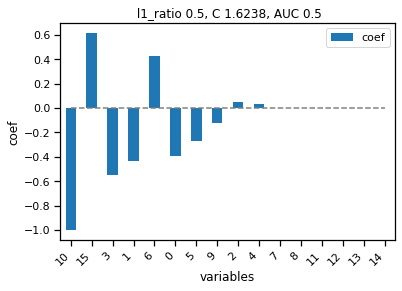

<Figure size 432x288 with 0 Axes>

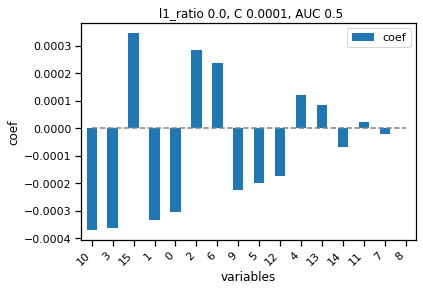

<Figure size 432x288 with 0 Axes>

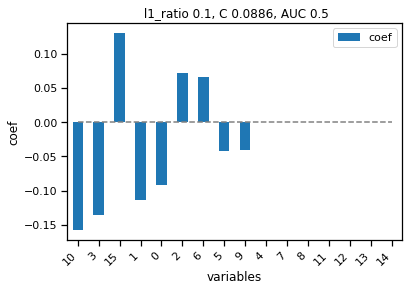

In [232]:
models = mosna.logistic_regression(
    counts_clinic,
    y_name='Groups',
    col_drop=['Patients'],
    )

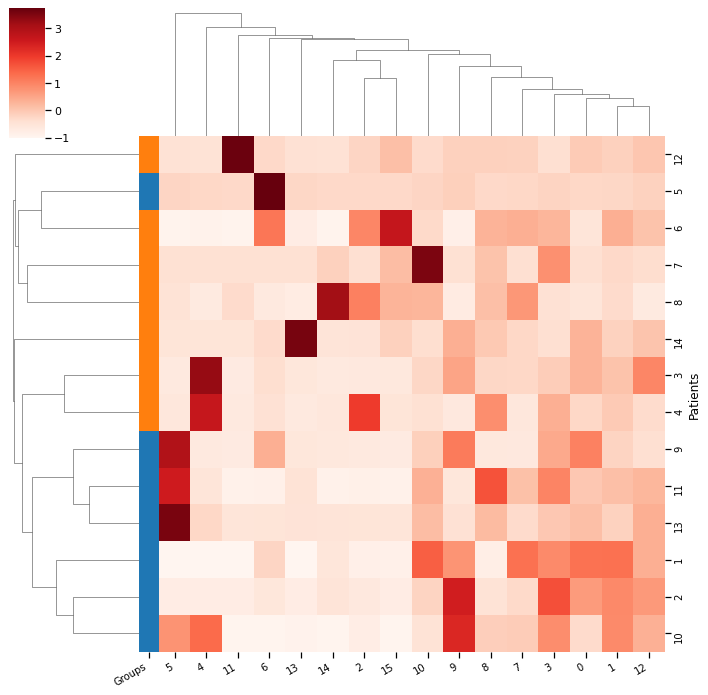

In [243]:
# proportion of cells in niches per sample, normalized per niche total count
counts = mosna.make_niches_composition(obj['FileName'], niches, var_label='variable', normalize='niche')
# merge clinical data and proportion of cells
counts_clinic = pd.concat([status, counts], axis=1, join='inner').sort_values('Spots').fillna(0)
counts_clinic.drop(columns=['Spots'], inplace=True)
counts_clinic = counts_clinic.groupby(['Patients', 'Groups']).mean()
# heatmap
g, d = mosna.plot_heatmap(
    counts_clinic.reset_index(), 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    figsize=(10, 10),
    z_score=False,
    cmap=sns.color_palette("Reds", as_cmap=True),
    return_data=True,
    )

figname = f"resolution-{cluster_params['resolution_parameter']}{other_str}_biclustering_normalized-niche.png"
plt.savefig(cluster_dir / figname)

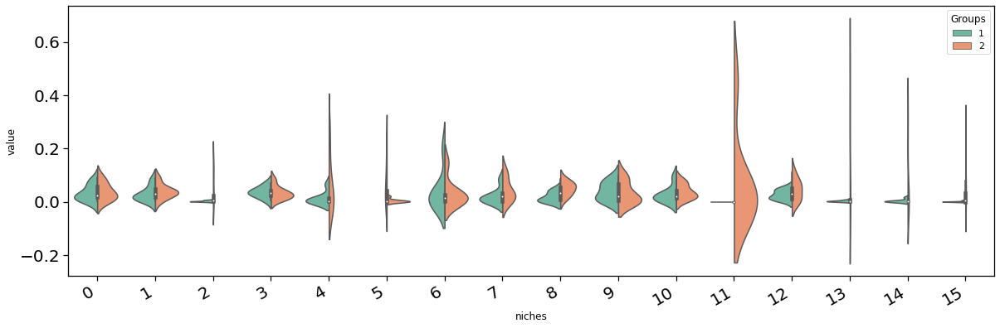

In [244]:
pvals = mosna.find_DE_markers(counts_clinic, group_ref=2, group_tgt=1, group_var='Groups')
pvals = pvals.sort_values(by='pval', ascending=True)

# DE analysis
fig, ax = mosna.plot_distrib_groups(
    counts_clinic, 
    group_var='Groups',
    groups=[1, 2], 
    pval_data=None,
    multi_ind_to_col=True,
    var_name='niches',
    )

In [245]:
pvals

,pval,pval_corr
15,0.002116,0.033850
8,0.026224,0.209790
2,0.072844,0.388500
5,0.139526,0.553456
11,0.172955,0.553456
7,0.259324,0.635198
14,0.300003,0.635198
1,0.317599,0.635198
10,0.442787,0.700685
13,0.476826,0.700685


Add                               8 with p-value 0.0250028
Add                               5 with p-value 0.0414848


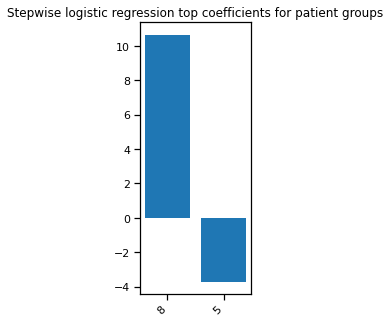

In [246]:
# Stepwise logistic regression
best_pval_names = pvals.loc[pvals['pval'] < 0.05, :].index.tolist()
if len(best_pval_names) > 0:
    model, included = mosna.stepwise_regression(X=counts_clinic, y_name='Groups', y_values=[1, 2], verbose=True)

    # plot the model's coefficients
    coefs = model.params[1:] # skip intercept
    nb_coefs = min(coefs.size, 20)
    if nb_coefs > 0:
        fig, ax = plt.subplots(figsize=(nb_coefs,5))
        ax.bar(range(len(coefs.index)), coefs)
        plt.xticks(ticks=range(len(coefs.index)), labels=coefs.index, rotation=45, ha='right');
        title = f"Stepwise logistic regression top coefficients for patient groups"
        plt.title(title)
else:
    print("There is no niche statistically related to response group")

Training took {duration}s


<Figure size 432x288 with 0 Axes>

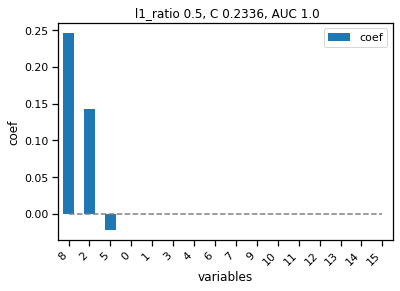

<Figure size 432x288 with 0 Axes>

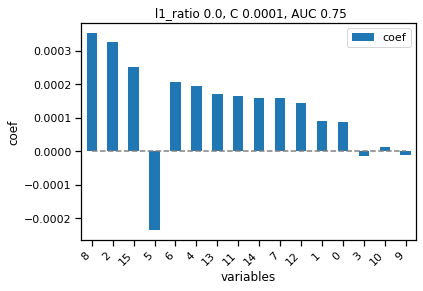

<Figure size 432x288 with 0 Axes>

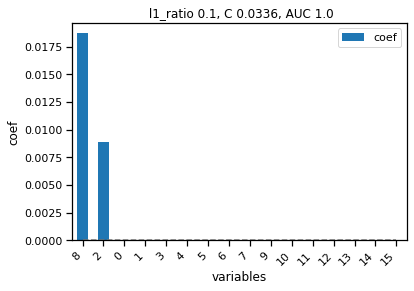

In [247]:
models = mosna.logistic_regression(
    counts_clinic,
    y_name='Groups',
    col_drop=['Patients'],
    )

Text(0.5, 1.0, 'niche cell-types composition, normalized by niche')

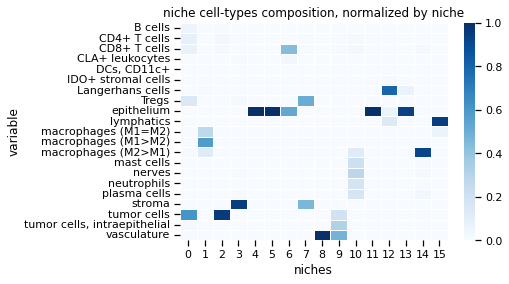

In [248]:
# as a reminder:
mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types', normalize='niche')
plt.title("niche cell-types composition, normalized by niche")

ROC AUC score perfect, only from pure niches.  
  - 8: vasculature
  - 2: tumor cells
  - 5: epithelium
  - 15: lymphatics + macrophages (M1=M2)  


Pure proportions of these cell types was not predictive of response, but proportion of ***pure niches*** are predictive.  
So mosna detects tumor exclusive areas predictive of response?!

## DGE wrt niches

Niches 4, 5 and 11 are apparently made of the same unique cell type: epithelial cells. What are the differences between these niches?  
The niche 13 has some langherans cells so that's explains more easily the separate clustering.

Loading reducer object and reduced coordinates


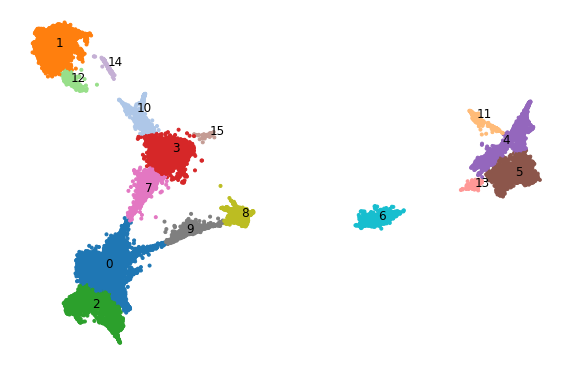

In [208]:
embed_viz, _ = mosna.get_reducer(var_aggreg, nas_dir, reducer_type='umap', n_neighbors=cluster_params['n_neighbors'])
fig, ax, niches_color_mapper = mosna.plot_clusters(embed_viz, cluster_labels, nas_dir, cluster_params=cluster_params, return_cmap=True)

Text(0.5, 1.0, 'niche cell-types composition, normalized by niche')

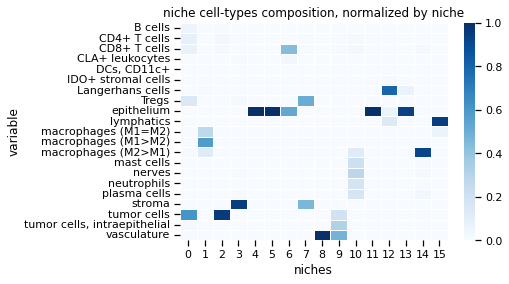

In [ ]:
# as a reminder:
mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types', normalize='niche')
plt.title("niche cell-types composition, normalized by niche")

### Differences in aggregation statistics

In [319]:
var_aggreg_niches = var_aggreg.copy()
var_aggreg_niches['niche'] = niches

In [311]:
pvals = mosna.find_DE_markers(var_aggreg_niches, group_ref=5, group_tgt=4, group_var='niche')
# pvals = pvals.sort_values(by='pval', ascending=True)
pvals

,pval,pval_corr
FOXP3 mean,0.000000,0.000000
CD68 mean,0.000000,0.000000
CD11b mean,0.000000,0.000000
BCL-2 mean,0.000000,0.000000
CD56 mean,0.000000,0.000000
...,...,...
CD163 mean,0.405477,0.420222
CollagenIV std,0.583114,0.598874
CCR4 std,0.741521,0.754763
CD68 std,0.777133,0.784011


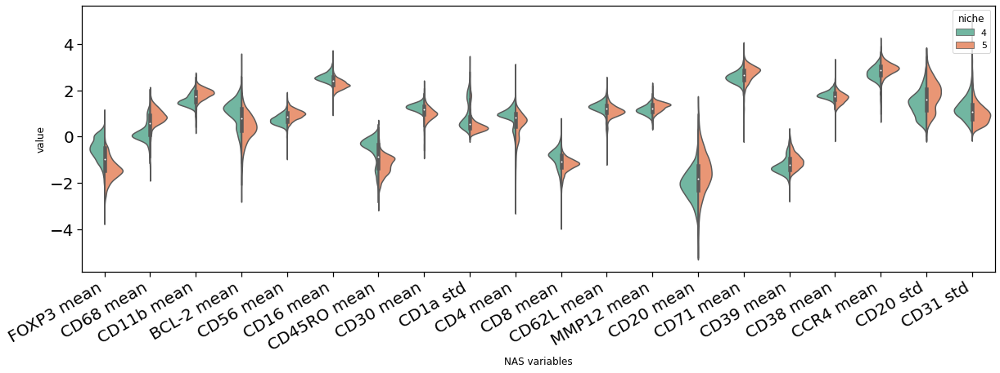

In [313]:
# DE analysis
fig, ax = mosna.plot_distrib_groups(
    var_aggreg_niches, 
    group_var='niche',
    groups=[5, 4], 
    pval_data=pvals, 
    pval_col='pval_corr', 
    max_cols=20, 
    multi_ind_to_col=False,
    var_name='NAS variables',
    )

In [315]:
pvals = mosna.find_DE_markers(var_aggreg_niches, group_ref=11, group_tgt=4, group_var='niche')
# pvals = pvals.sort_values(by='pval', ascending=True)
pvals

,pval,pval_corr
FOXP3 mean,0.000000,0.000000
CD68 mean,0.000000,0.000000
CD34 mean,0.000000,0.000000
CD45RO mean,0.000000,0.000000
CD11c mean,0.000000,0.000000
...,...,...
VISTA std,0.427768,0.443324
CD16 std,0.706723,0.725823
CD3 std,0.912069,0.928356
CLA-CD162 mean,0.937080,0.945373


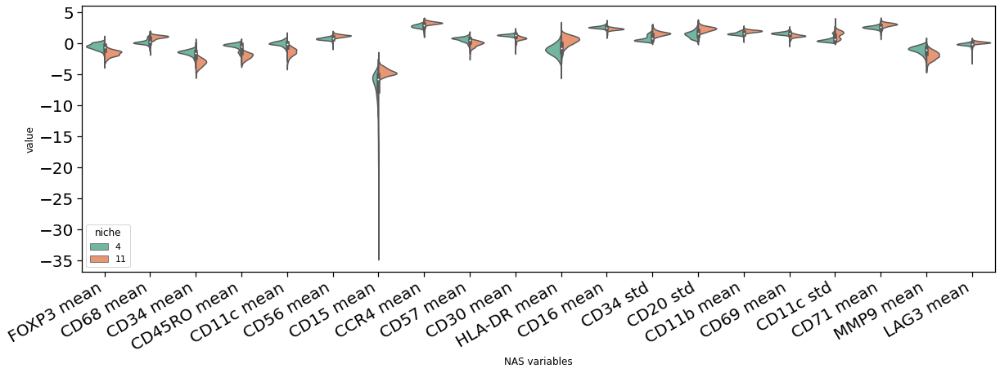

In [316]:
# DE analysis
fig, ax = mosna.plot_distrib_groups(
    var_aggreg_niches, 
    group_var='niche',
    groups=[11, 4], 
    pval_data=pvals, 
    pval_col='pval_corr', 
    max_cols=20, 
    multi_ind_to_col=False,
    var_name='NAS variables',
    )

In [317]:
pvals = mosna.find_DE_markers(var_aggreg_niches, group_ref=11, group_tgt=5, group_var='niche')
# pvals = pvals.sort_values(by='pval', ascending=True)
pvals

,pval,pval_corr
HLA-DR mean,0.000000,0.000000
CD34 mean,0.000000,0.000000
CD15 mean,0.000000,0.000000
CD34 std,0.000000,0.000000
CD11c mean,0.000000,0.000000
...,...,...
CollagenIV std,0.463034,0.479872
BCL-2 mean,0.608129,0.624564
CD138 std,0.736108,0.749253
CD1a mean,0.793463,0.800485


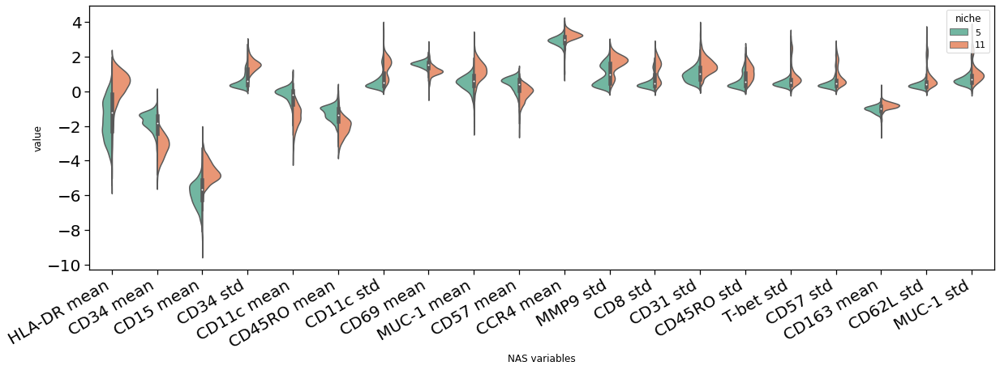

In [318]:
# DE analysis
fig, ax = mosna.plot_distrib_groups(
    var_aggreg_niches, 
    group_var='niche',
    groups=[11, 5], 
    pval_data=pvals, 
    pval_col='pval_corr', 
    max_cols=20, 
    multi_ind_to_col=False,
    var_name='NAS variables',
    )

### Differences in raw marker levels

In [341]:
markers_niches = obj[aggreg_vars].copy()
markers_niches['niche'] = niches

In [342]:
pvals = mosna.find_DE_markers(markers_niches, group_ref=5, group_tgt=4, group_var='niche')
pvals

,pval,pval_corr
CD68,0.000000e+00,0.000000e+00
FOXP3,1.748839e-307,4.984190e-306
CD45RO,7.840747e-253,1.489742e-251
CD11b,7.934718e-240,1.130697e-238
CD56,5.212651e-158,5.942422e-157
...,...,...
PD-1,2.533940e-02,2.725181e-02
GranzymeB,3.705834e-02,3.911713e-02
CD2,1.022915e-01,1.060111e-01
CD45,3.734450e-01,3.801136e-01


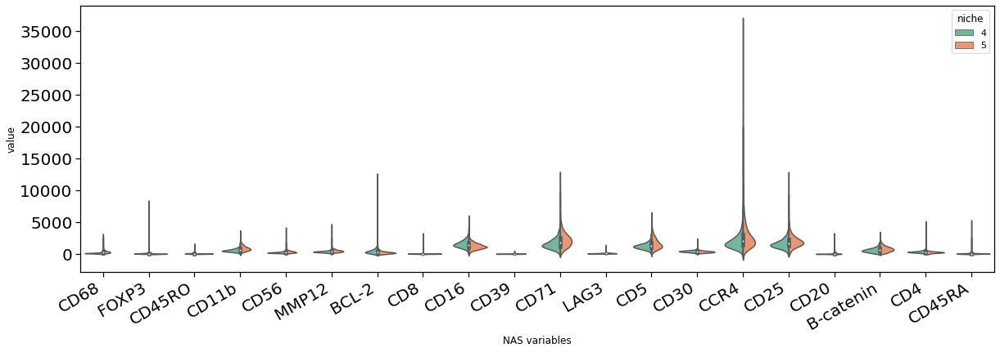

In [343]:
# DE analysis
fig, ax = mosna.plot_distrib_groups(
    markers_niches, 
    group_var='niche',
    groups=[5, 4], 
    pval_data=pvals, 
    pval_col='pval_corr', 
    max_cols=20, 
    multi_ind_to_col=False,
    var_name='NAS variables',
    )

In [344]:
pvals = mosna.find_DE_markers(markers_niches, group_ref=11, group_tgt=4, group_var='niche')
pvals

,pval,pval_corr
CD45RO,2.204420e-240,1.256519e-238
CD68,6.202233e-185,1.767636e-183
FOXP3,9.672129e-185,1.837704e-183
CD11c,2.625011e-170,3.740641e-169
CD57,1.995333e-150,2.274680e-149
...,...,...
GATA3,4.657516e-02,5.009027e-02
CLA-CD162,5.780164e-02,6.101284e-02
CD1a,6.057920e-02,6.278208e-02
CD45,1.018586e-01,1.036775e-01


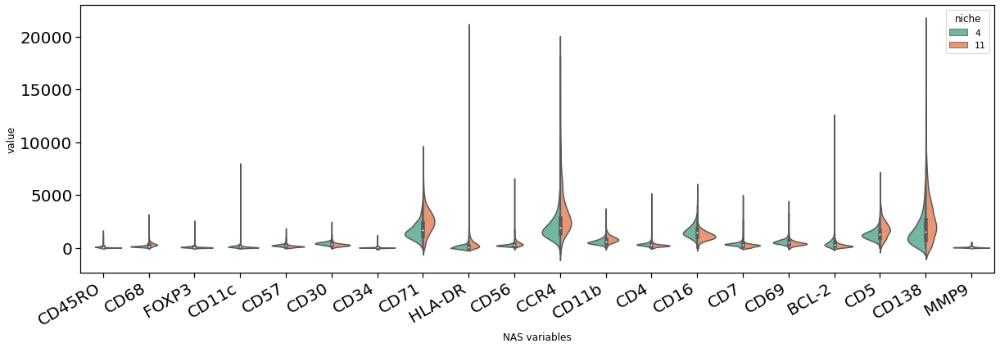

In [345]:
# DE analysis
fig, ax = mosna.plot_distrib_groups(
    markers_niches, 
    group_var='niche',
    groups=[11, 4], 
    pval_data=pvals, 
    pval_col='pval_corr', 
    max_cols=20, 
    multi_ind_to_col=False,
    var_name='NAS variables',
    )

In [346]:
pvals = mosna.find_DE_markers(markers_niches, group_ref=11, group_tgt=5, group_var='niche')
pvals

,pval,pval_corr
CD11c,5.669309e-182,3.231506e-180
HLA-DR,2.357210e-133,6.718048e-132
CD69,1.461109e-130,2.776108e-129
CD45RO,1.999114e-130,2.848738e-129
CD57,8.419553e-125,9.598291e-124
...,...,...
Ki-67,4.785722e-01,5.146908e-01
VISTA,5.542282e-01,5.850187e-01
ICOS,5.835005e-01,6.047187e-01
CCR6,7.863952e-01,8.004379e-01


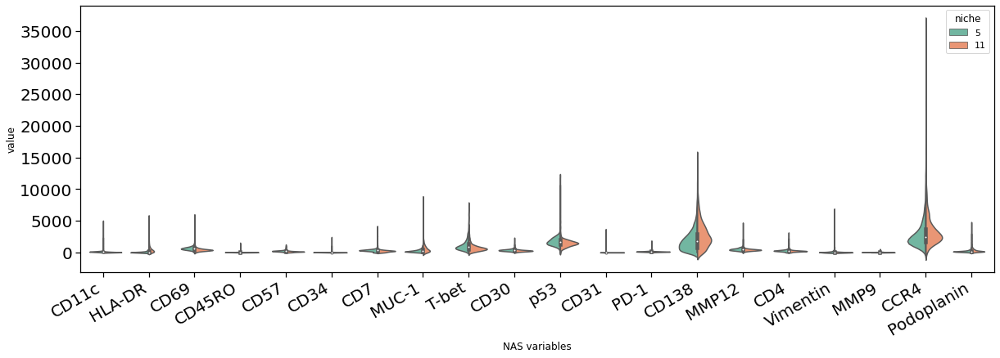

In [347]:
# DE analysis
fig, ax = mosna.plot_distrib_groups(
    markers_niches, 
    group_var='niche',
    groups=[11, 5], 
    pval_data=pvals, 
    pval_col='pval_corr', 
    max_cols=20, 
    multi_ind_to_col=False,
    var_name='NAS variables',
    )

### Differences in CLR normalized marker levels

In [ ]:
markers_niches = obj[aggreg_vars].copy()
markers_niches.loc[:, :] = X_clr
markers_niches['niche'] = niches

In [ ]:
pvals = mosna.find_DE_markers(markers_niches, group_ref=5, group_tgt=4, group_var='niche')
pvals

,pval,pval_corr
FOXP3,0.000000e+00,0.000000e+00
CD68,0.000000e+00,0.000000e+00
CD45RO,0.000000e+00,0.000000e+00
CD16,3.420926e-236,4.874819e-235
CD8,1.498481e-188,1.708268e-187
...,...,...
CD138,1.155671e-01,1.242891e-01
Vimentin,4.468846e-01,4.717115e-01
CD69,4.903091e-01,5.081385e-01
GATA3,8.667592e-01,8.822370e-01


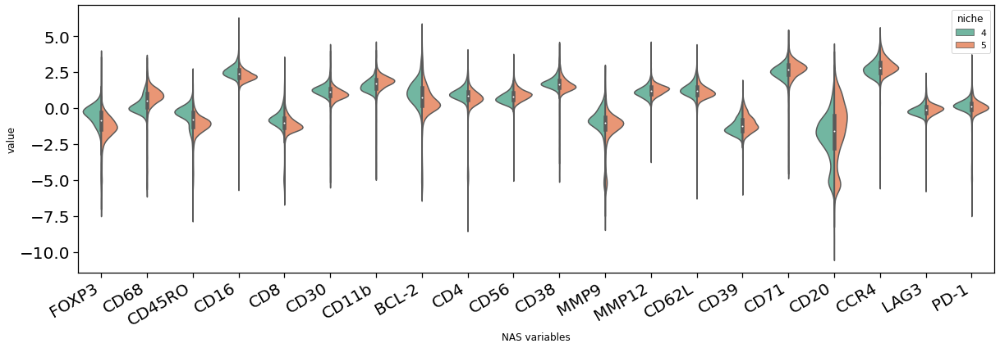

In [ ]:
# DE analysis
fig, ax = mosna.plot_distrib_groups(
    markers_niches, 
    group_var='niche',
    groups=[5, 4], 
    pval_data=pvals, 
    pval_col='pval_corr', 
    max_cols=20, 
    multi_ind_to_col=False,
    var_name='NAS variables',
    )

In [ ]:
pvals = mosna.find_DE_markers(markers_niches, group_ref=11, group_tgt=4, group_var='niche')
pvals

,pval,pval_corr
CD45RO,4.274864e-253,2.436673e-251
CD11c,1.329977e-203,3.790433e-202
CD68,3.289607e-198,6.250254e-197
FOXP3,9.788444e-180,1.394853e-178
CD34,6.921818e-150,7.890872e-149
...,...,...
CLA-CD162,1.514024e-02,1.628290e-02
CCR6,3.370205e-01,3.557439e-01
GATA3,5.210727e-01,5.400208e-01
CD164,6.103476e-01,6.212467e-01


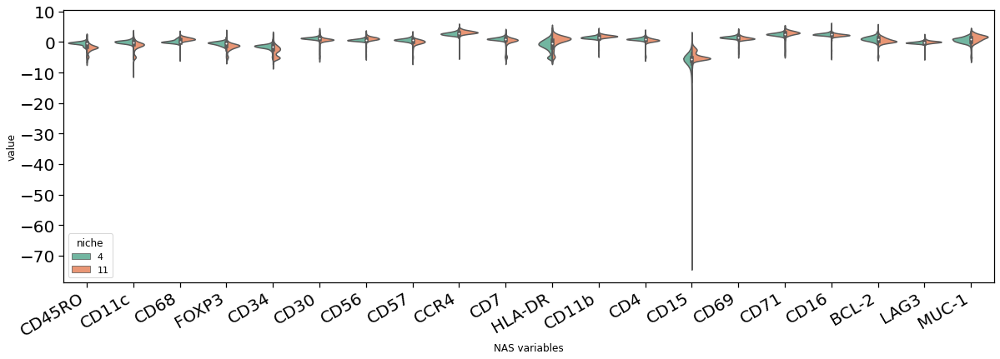

In [ ]:
# DE analysis
fig, ax = mosna.plot_distrib_groups(
    markers_niches, 
    group_var='niche',
    groups=[11, 4], 
    pval_data=pvals, 
    pval_col='pval_corr', 
    max_cols=20, 
    multi_ind_to_col=False,
    var_name='NAS variables',
    )

In [ ]:
pvals = mosna.find_DE_markers(markers_niches, group_ref=11, group_tgt=5, group_var='niche')
pvals

,pval,pval_corr
CD11c,1.033324e-192,5.889947e-191
HLA-DR,1.646575e-155,4.692739e-154
CD34,2.664865e-129,5.063244e-128
CD45RO,1.861688e-116,2.652906e-115
CD69,2.722480e-101,3.103628e-100
...,...,...
CD39,7.003074e-01,7.531608e-01
CD1a,7.424387e-01,7.816091e-01
Mastcell-tryptase,7.541842e-01,7.816091e-01
CD62L,7.797024e-01,7.936257e-01


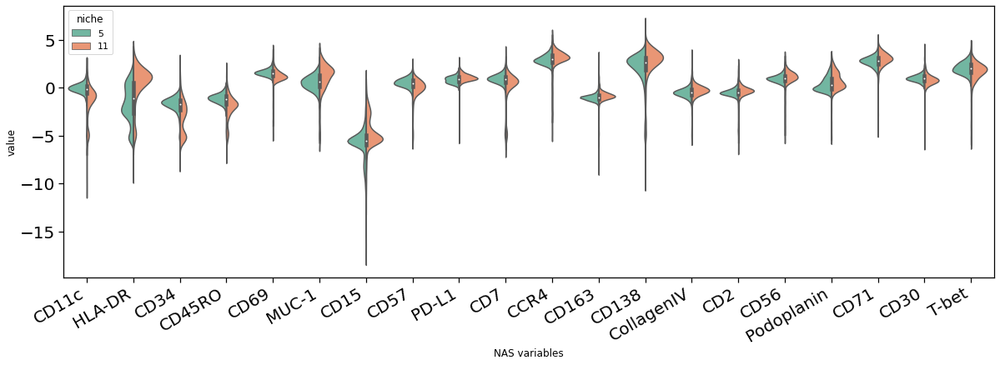

In [ ]:
# DE analysis
fig, ax = mosna.plot_distrib_groups(
    markers_niches, 
    group_var='niche',
    groups=[11, 5], 
    pval_data=pvals, 
    pval_col='pval_corr', 
    max_cols=20, 
    multi_ind_to_col=False,
    var_name='NAS variables',
    )

### Isolate cell type between niches

In [337]:
select_cell_type = cell_types == 'epithelium'
select_niches = niches == 4
for i in [5, 11]:
    select_niches = np.logical_or(select_niches, niches == i)

In [340]:
cell_types[select_niches].value_counts()

epithelium          7452
Langerhans cells       4
lymphatics             1
stroma                 1
tumor cells            1
Name: CellCluster, dtype: int64

There are so few other cells of another type that their contribution is negligible for the observed differences in distributions of markers or aggregation statistics between niches.

## On markers, order 2

In [348]:
order = 2
nas_dir = reconst_dir / f"nas_on-{var_type}_stats-{stat_names}_order-{order}"    
if not os.path.exists(nas_dir):
    os.makedirs(nas_dir)

edges_all = pd.read_csv(reconst_dir/ 'sample_all-edges.csv')
pairs = edges_all.iloc[:, :2].values

file_path = nas_dir / f'aggregation_statistics.csv'
if file_path.is_file():
    print("Loading Neighbors Aggregation Statistics file")
    var_aggreg = pd.read_csv(file_path)
else:
    print("Computing Neighbors Aggregation Statistics")
    var_aggreg = mosna.aggregate_k_neighbors(
        X=X_clr,
        pairs=pairs,
        order=order,
        var_names=aggreg_vars,
    )
    var_aggreg.to_csv(file_path, index=False)

Loading Neighbors Aggregation Statistics file


In [351]:
cluster_params = {
    'reducer_type': 'umap', 
    'n_neighbors': 200, 
    'metric': 'euclidean', 
    'min_dist': 0.0,
    'clusterer_type': 'leiden', 
    'dim_clust': 2, 
    'k_cluster': 15, 
    'resolution_parameter': 0.005,
}

cluster_labels, cluster_dir, nb_clust, _ = mosna.get_clusterer(var_aggreg, nas_dir, **cluster_params)

Performing clustering
Computing dimensionality reduction
Found 17 clusters


Loading reducer object and reduced coordinates


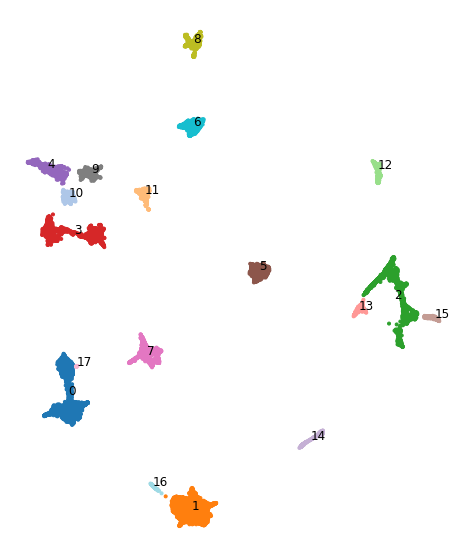

In [352]:
embed_viz, _ = mosna.get_reducer(var_aggreg, nas_dir, reducer_type='umap', n_neighbors=cluster_params['n_neighbors'])
fig, ax, niches_color_mapper = mosna.plot_clusters(embed_viz, cluster_labels, nas_dir, cluster_params=cluster_params, return_cmap=True)

In [ ]:
save_dir = cluster_dir / f"spatial_networks_niches_nneigh-{cluster_params['n_neighbors']}"
save_dir.mkdir(parents=True, exist_ok=True)

# colormap for cell-types
n_cell_types = obj['ClusterName'].unique().size
# palette = sns.color_palette(cc.glasbey, n_colors=n_cell_types).as_hex()
# palette = [mpl.colors.rgb2hex(x) for x in mpl.cm.get_cmap('tab20').colors]
niche_colors = np.array([niches_color_mapper[x] for x in cluster_labels])

plots_marker = '.'
for sample in obj['FileName'].unique():
    print("filename: {}".format(sample))
    select = np.array(obj['FileName'] == sample)

    # load nodes and edges
    coords = obj.loc[select, cell_pos_cols].values
    # TODO: find a way to reuse pairs compatible with aggregated nodes
    # pairs = edges_all.loc[edges_all['filename'] == sample, ['source', 'target']].values
    pairs = ty.build_delaunay(coords, trim_dist=trim_dist)
    if k_sol > 0:
        pairs = ty.link_solitaries(coords, pairs, method='knn', k=k_sol)

    # Big summary plot
    fig, ax = plt.subplots(1, 4, figsize=(int(7*4)+1, 7), tight_layout=False)
    i = 0
    ty.plot_network(coords, 
                    pairs,
                    labels=obj.loc[select, 'ClusterName'], 
                    color_mapper=celltypes_color_mapper, 
                    marker=plots_marker, 
                    size_nodes=size_points, 
                    ax=ax[0])
    ax[i].set_title('Spatial map of phenotypes', fontsize=14);

    i += 1
    ax[i].scatter(coords[:, 0], coords[:, 1], c=niche_colors[select], marker=plots_marker, s=size_points)
    ax[i].set_title('Spatial map of detected areas', fontsize=14);
    ax[i].set_aspect('equal')

    i += 1
    ax[i].scatter(embed_viz[select, 0], embed_viz[select, 1], c=niche_colors[select], s=5);
    ax[i].set_title("Clustering on NAS", fontsize=14);
    ax[i].set_aspect('equal')

    i += 1
    ax[i].scatter(embed_viz[:, 0], embed_viz[:, 1], c=niche_colors);
    ax[i].set_title("Clustering on NAS of all samples", fontsize=14);
    ax[i].set_aspect('equal')
    
    # make plot limits equal
    ax[i-1].set_xlim(ax[i].get_xlim())
    ax[i-1].set_ylim(ax[i].get_ylim())

    suptitle = f"Spatial omics data and detected areas - sample {sample}";
    fig.suptitle(suptitle, fontsize=18)

    fig.savefig(save_dir / suptitle, bbox_inches='tight', facecolor='white', dpi=300)
    plt.show()

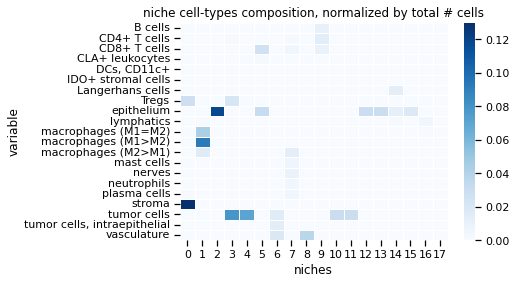

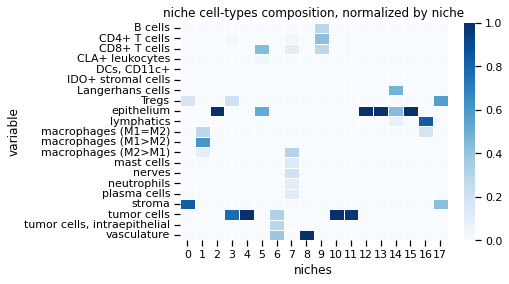

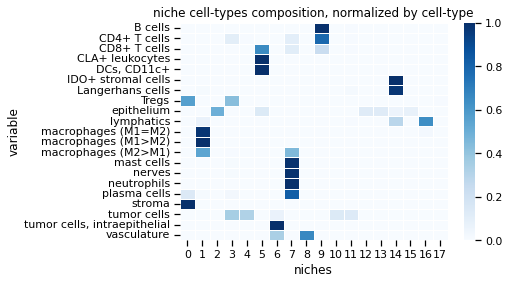

In [357]:
# Survival analysis

cell_types = nodes_all['CellCluster']
niches = cluster_labels

mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types')
title = "niche cell-types composition, normalized by total # cells"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types', normalize='niche')
title = "niche cell-types composition, normalized by niche"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types', normalize='obs')
title = "niche cell-types composition, normalized by cell-type"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

## On markers, order 3

#### mean & std

In [359]:
order = 3
nas_dir = reconst_dir / f"nas_on-{var_type}_stats-{stat_names}_order-{order}"    
if not os.path.exists(nas_dir):
    os.makedirs(nas_dir)

edges_all = pd.read_csv(reconst_dir/ 'sample_all-edges.csv')
pairs = edges_all.iloc[:, :2].values

file_path = nas_dir / f'aggregation_statistics.csv'
if file_path.is_file():
    print("Loading Neighbors Aggregation Statistics file")
    var_aggreg = pd.read_csv(file_path)
else:
    print("Computing Neighbors Aggregation Statistics")
    var_aggreg = mosna.aggregate_k_neighbors(
        X=X_clr,
        pairs=pairs,
        order=order,
        var_names=aggreg_vars,
    )
    var_aggreg.to_csv(file_path, index=False)

Compouting Neighbors Aggregation Statistics


In [360]:
cluster_params = {
    'reducer_type': 'umap', 
    'n_neighbors': 75, 
    'metric': 'euclidean', 
    'min_dist': 0.0,
    'clusterer_type': 'leiden', 
    'dim_clust': 2, 
    'k_cluster': 15, 
    'resolution_parameter': 0.005,
}

cluster_labels, cluster_dir, nb_clust, _ = mosna.get_clusterer(var_aggreg, nas_dir, **cluster_params)

Performing clustering
Computing dimensionality reduction
Found 39 clusters


Loading reducer object and reduced coordinates


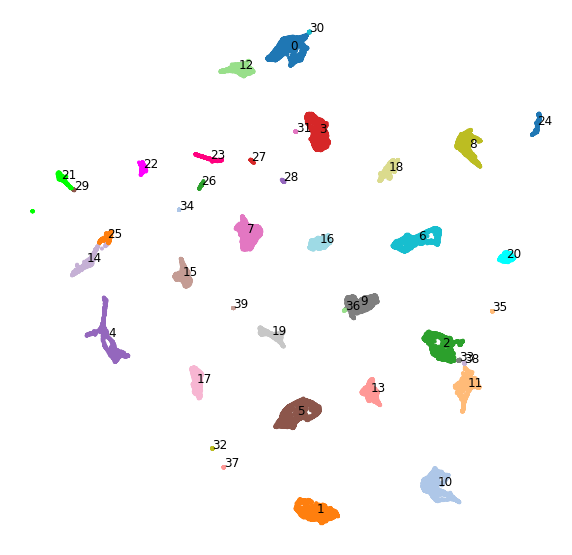

In [361]:
embed_viz, _ = mosna.get_reducer(var_aggreg, nas_dir, reducer_type='umap', n_neighbors=cluster_params['n_neighbors'])
fig, ax, niches_color_mapper = mosna.plot_clusters(embed_viz, cluster_labels, nas_dir, cluster_params=cluster_params, return_cmap=True)

In [362]:
cluster_params = {
    'reducer_type': 'umap', 
    'n_neighbors': 200, 
    'metric': 'euclidean', 
    'min_dist': 0.0,
    'clusterer_type': 'leiden', 
    'dim_clust': 2, 
    'k_cluster': 15, 
    'resolution_parameter': 0.005,
}

cluster_labels, cluster_dir, nb_clust, _ = mosna.get_clusterer(var_aggreg, nas_dir, **cluster_params)

Performing clustering
Computing dimensionality reduction
Found 32 clusters


Loading reducer object and reduced coordinates


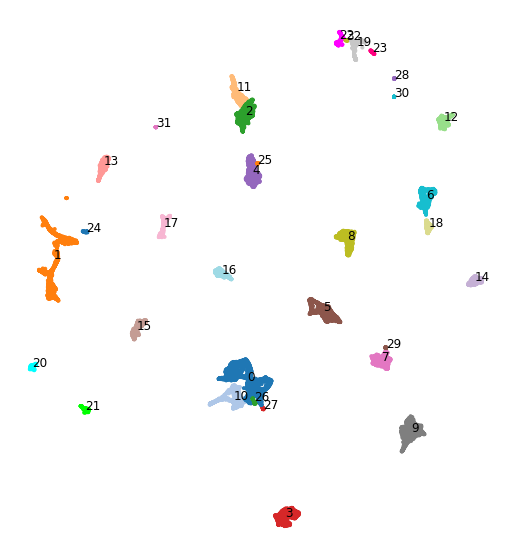

In [363]:
embed_viz, _ = mosna.get_reducer(var_aggreg, nas_dir, reducer_type='umap', n_neighbors=cluster_params['n_neighbors'])
fig, ax, niches_color_mapper = mosna.plot_clusters(embed_viz, cluster_labels, nas_dir, cluster_params=cluster_params, return_cmap=True)

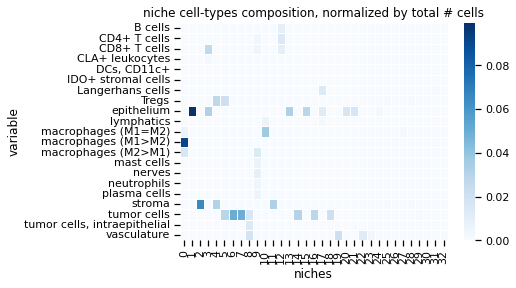

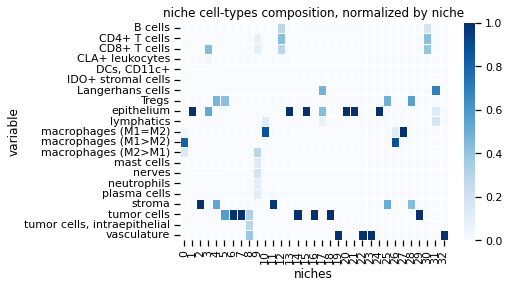

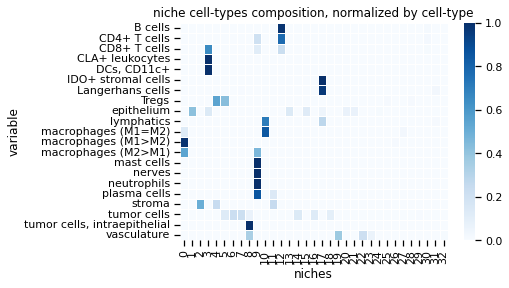

In [364]:
# Survival analysis

cell_types = nodes_all['CellCluster']
niches = cluster_labels

mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types')
title = "niche cell-types composition, normalized by total # cells"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types', normalize='niche')
title = "niche cell-types composition, normalized by niche"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types', normalize='obs')
title = "niche cell-types composition, normalized by cell-type"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

## mean only

In [366]:
order = 1
var_type = 'markers'
stat_names = 'mean'
aggreg_vars = marker_cols

# For UMAP visualization
marker = '.'
size_points = 10

In [367]:
nas_dir = reconst_dir / f"nas_on-{var_type}_stats-{stat_names}_order-{order}"    
if not os.path.exists(nas_dir):
    os.makedirs(nas_dir)

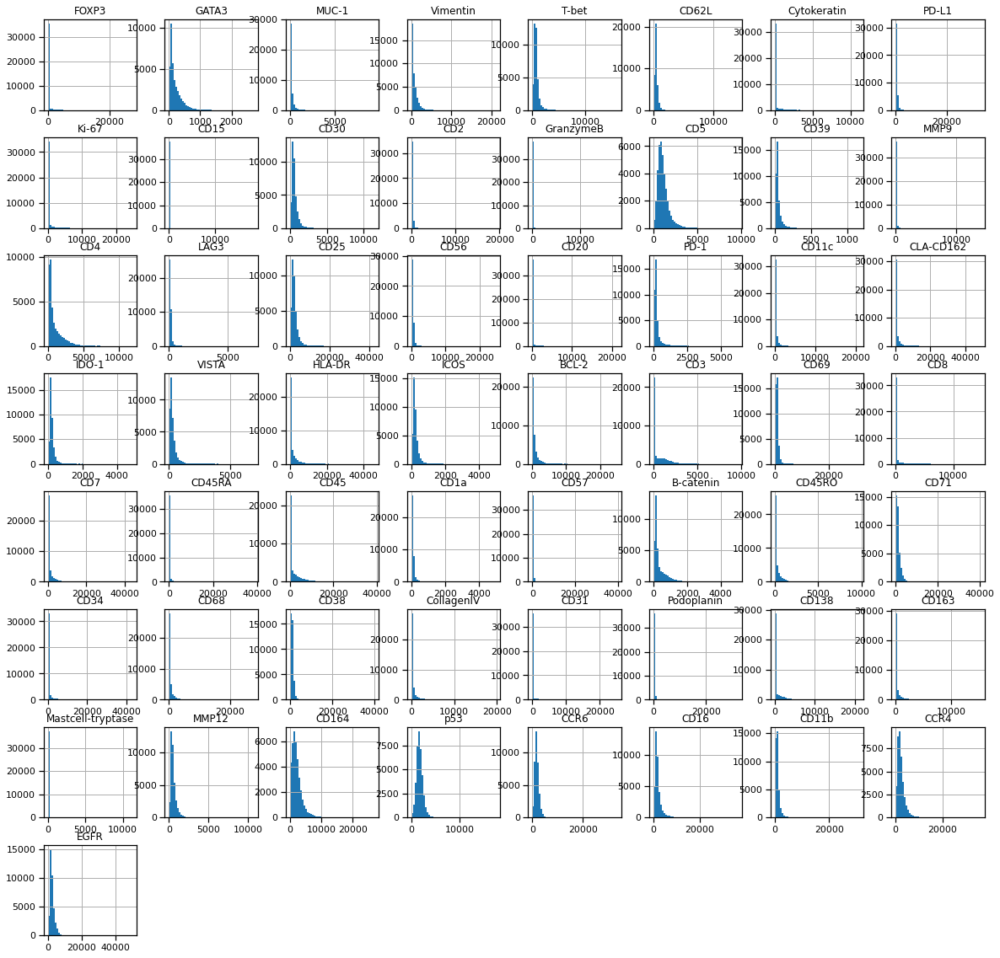

In [368]:
obj[aggreg_vars].hist(bins=50, figsize=(20, 20));

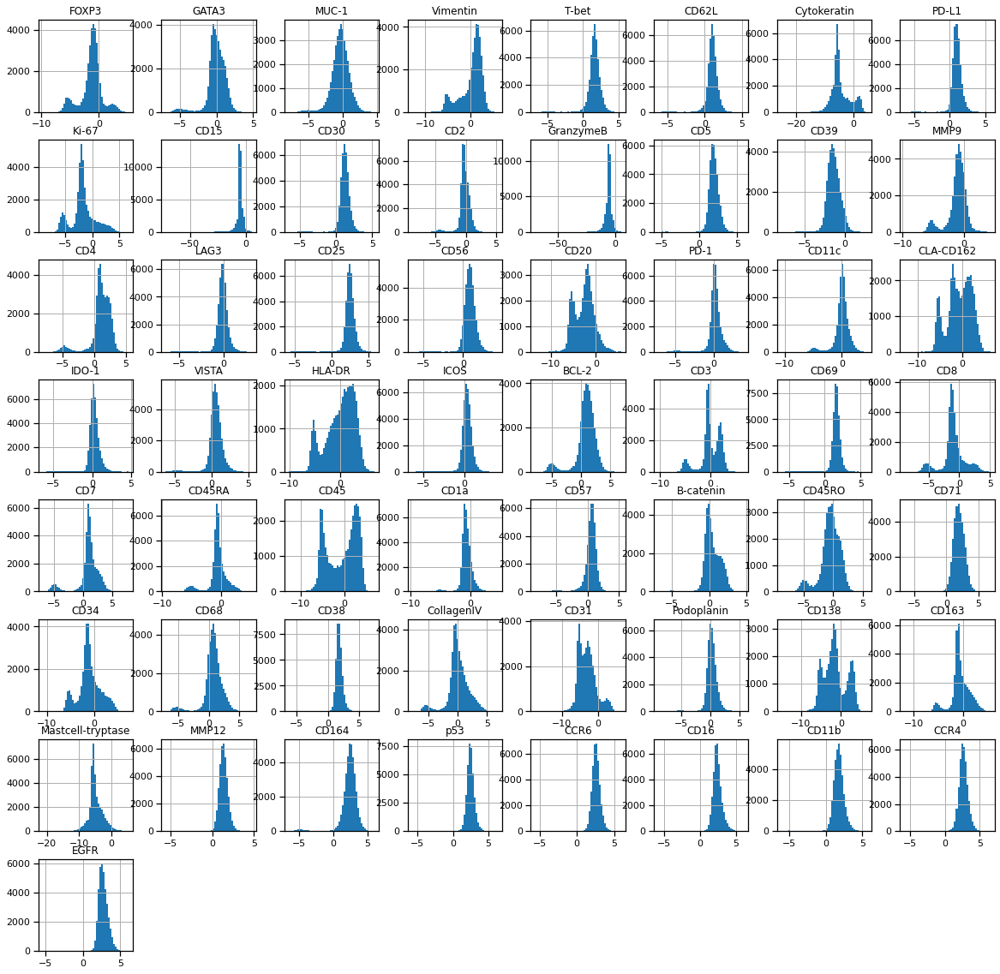

In [369]:
X = obj[aggreg_vars].values
X[X == 0] = X.max() / 100000

X_clr = cs.clr(cs.closure(X))
aggreg_vars_clr = obj[aggreg_vars].copy()
aggreg_vars_clr.loc[:, :] = X_clr
aggreg_vars_clr.hist(bins=50, figsize=(20, 20));

In [370]:
edges_all = pd.read_csv(reconst_dir/ 'sample_all-edges.csv')
pairs = edges_all.values

In [372]:
file_path = nas_dir / f'aggregation_statistics.csv'

if file_path.is_file():
    print("Loading Neighbors Aggregation Statistics file")
    var_aggreg = pd.read_csv(file_path)
else:
    print("Computing Neighbors Aggregation Statistics")
    var_aggreg = mosna.aggregate_k_neighbors(
        X=X_clr,
        pairs=pairs,
        order=order,
        var_names=aggreg_vars,
        stat_funcs=np.mean,
        stat_names='mean',
    )
    var_aggreg.to_csv(file_path, index=False)

Loading Neighbors Aggregation Statistics file


In [374]:
embedding, reducer = mosna.get_reducer(
    data=var_aggreg, 
    save_dir=nas_dir,
    reducer_type='umap', 
    n_neighbors=15, 
    metric='euclidean', 
    min_dist=0.0,
    )

Loading reducer object and reduced coordinates


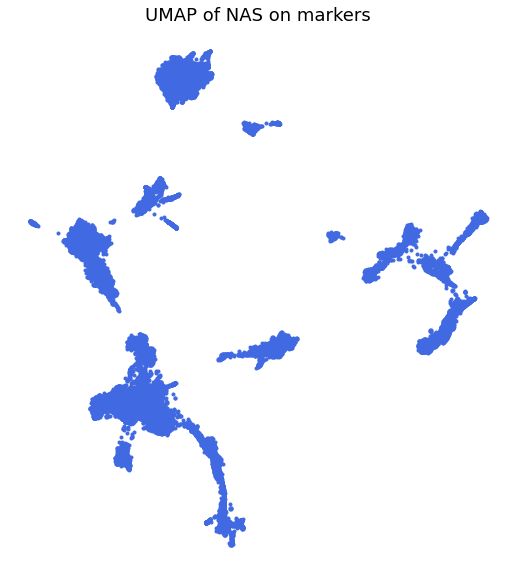

In [375]:
mosna.plot_clusters(embedding)
title = f"UMAP of NAS on {var_type}"
plt.title(title, fontsize=18);

In [378]:
cluster_params = {
    'reducer_type': 'umap', 
    'n_neighbors': 75, 
    'metric': 'euclidean', 
    'min_dist': 0.0,
    'clusterer_type': 'leiden', 
    'dim_clust': 2, 
    'k_cluster': 15, 
    'resolution_parameter': 0.05,
}

cluster_labels, cluster_dir, nb_clust, _ = mosna.get_clusterer(var_aggreg, nas_dir, **cluster_params)
niches = cluster_labels

Loading clusterer object and cluster labels
There are 18 clusters


Loading reducer object and reduced coordinates


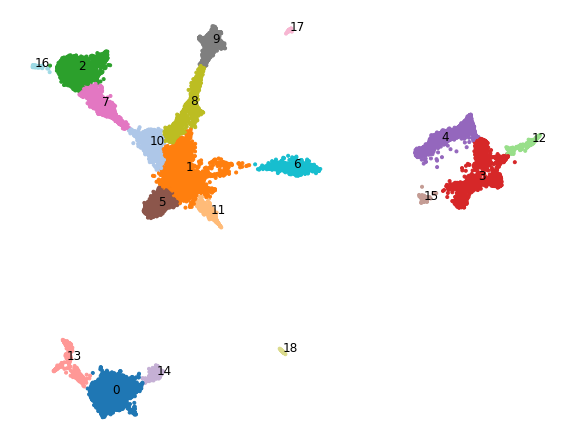

In [379]:
embed_viz, _ = mosna.get_reducer(var_aggreg, nas_dir, reducer_type='umap', n_neighbors=cluster_params['n_neighbors'])
fig, ax, niches_color_mapper = mosna.plot_clusters(embed_viz, cluster_labels, nas_dir, cluster_params=cluster_params, return_cmap=True)

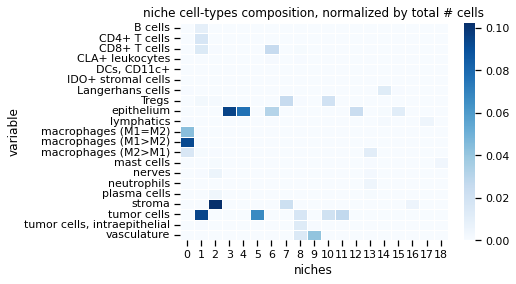

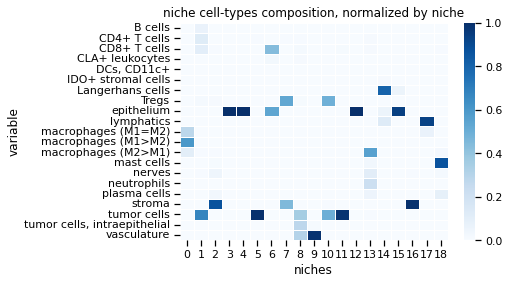

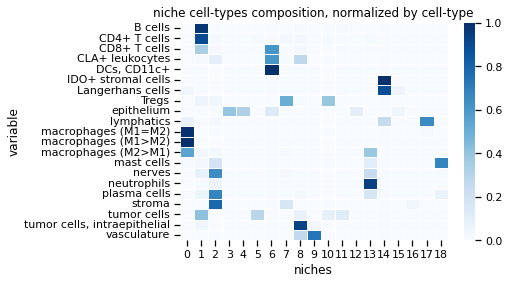

In [380]:
mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types')
title = "niche cell-types composition, normalized by total # cells"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types', normalize='niche')
title = "niche cell-types composition, normalized by niche"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types', normalize='obs')
title = "niche cell-types composition, normalized by cell-type"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

In [381]:
cluster_params = {
    'reducer_type': 'umap', 
    'n_neighbors': 200, 
    'metric': 'euclidean', 
    'min_dist': 0.0,
    'clusterer_type': 'leiden', 
    'dim_clust': 2, 
    'k_cluster': 15, 
    'resolution_parameter': 0.05,
}

cluster_labels, cluster_dir, nb_clust, _ = mosna.get_clusterer(var_aggreg, nas_dir, **cluster_params)
niches = cluster_labels

Loading clusterer object and cluster labels
There are 17 clusters


Loading reducer object and reduced coordinates


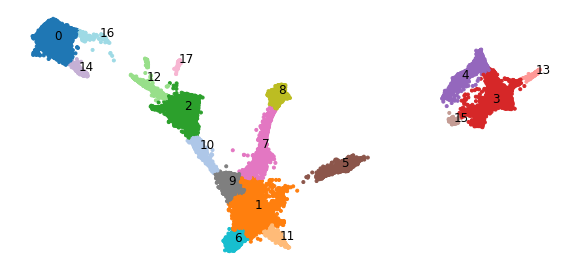

In [382]:
embed_viz, _ = mosna.get_reducer(var_aggreg, nas_dir, reducer_type='umap', n_neighbors=cluster_params['n_neighbors'])
fig, ax, niches_color_mapper = mosna.plot_clusters(embed_viz, cluster_labels, nas_dir, cluster_params=cluster_params, return_cmap=True)

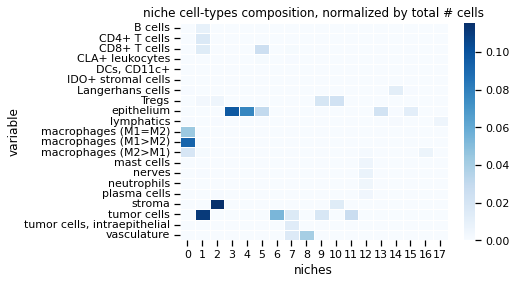

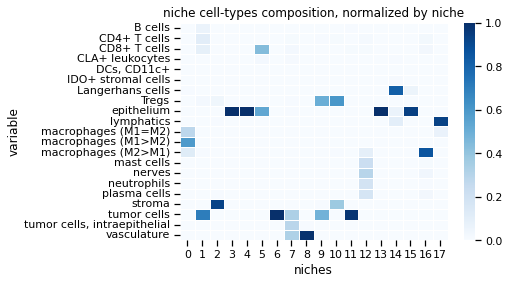

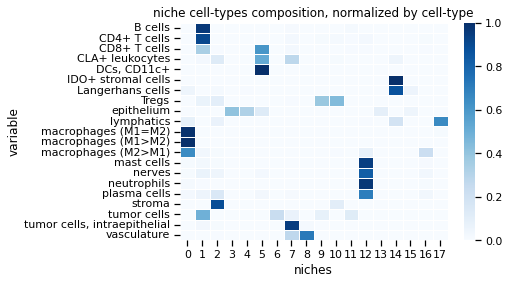

In [383]:
mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types')
title = "niche cell-types composition, normalized by total # cells"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types', normalize='niche')
title = "niche cell-types composition, normalized by niche"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types', normalize='obs')
title = "niche cell-types composition, normalized by cell-type"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

### On markers, order 2

In [384]:
order = 2
nas_dir = reconst_dir / f"nas_on-{var_type}_stats-{stat_names}_order-{order}"    
if not os.path.exists(nas_dir):
    os.makedirs(nas_dir)

edges_all = pd.read_csv(reconst_dir/ 'sample_all-edges.csv')
pairs = edges_all.iloc[:, :2].values

file_path = nas_dir / f'aggregation_statistics.csv'
if file_path.is_file():
    print("Loading Neighbors Aggregation Statistics file")
    var_aggreg = pd.read_csv(file_path)
else:
    print("Computing Neighbors Aggregation Statistics")
    var_aggreg = mosna.aggregate_k_neighbors(
        X=X_clr,
        pairs=pairs,
        order=order,
        var_names=aggreg_vars,
        stat_funcs=np.mean,
        stat_names='mean',
    )
    var_aggreg.to_csv(file_path, index=False)

Computing Neighbors Aggregation Statistics


In [385]:
embedding, reducer = mosna.get_reducer(
    data=var_aggreg, 
    save_dir=nas_dir,
    reducer_type='umap', 
    n_neighbors=15, 
    metric='euclidean', 
    min_dist=0.0,
    )

Computing dimensionality reduction


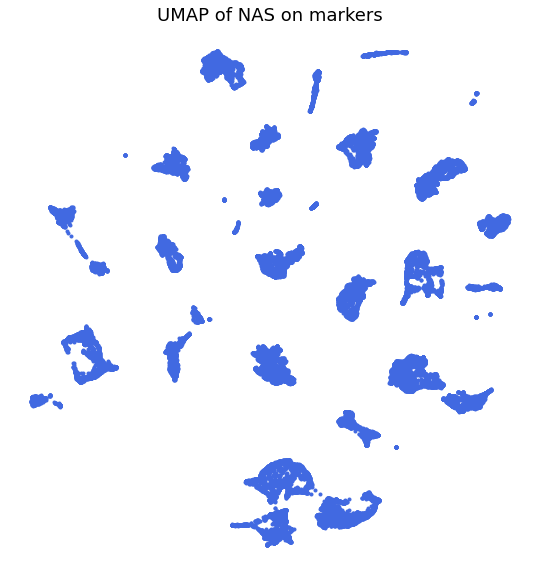

In [386]:
mosna.plot_clusters(embedding)
title = f"UMAP of NAS on {var_type}"
plt.title(title, fontsize=18);

In [387]:
cluster_params = {
    'reducer_type': 'umap', 
    'n_neighbors': 75, 
    'metric': 'euclidean', 
    'min_dist': 0.0,
    'clusterer_type': 'leiden', 
    'dim_clust': 2, 
    'k_cluster': 15, 
    'resolution_parameter': 0.05,
}

cluster_labels, cluster_dir, nb_clust, _ = mosna.get_clusterer(var_aggreg, nas_dir, **cluster_params)
niches = cluster_labels

Performing clustering
Computing dimensionality reduction
Found 25 clusters


Loading reducer object and reduced coordinates


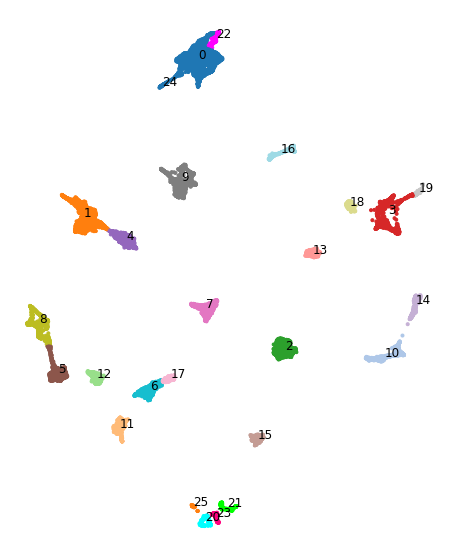

In [388]:
embed_viz, _ = mosna.get_reducer(var_aggreg, nas_dir, reducer_type='umap', n_neighbors=cluster_params['n_neighbors'])
fig, ax, niches_color_mapper = mosna.plot_clusters(embed_viz, cluster_labels, nas_dir, cluster_params=cluster_params, return_cmap=True)

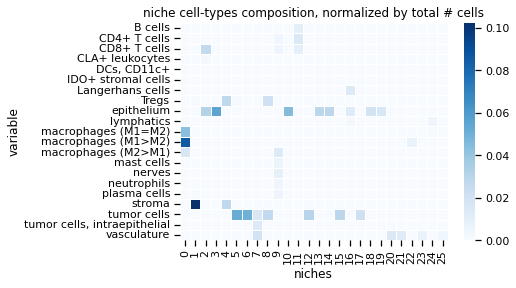

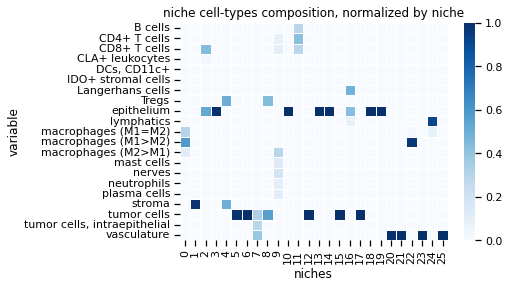

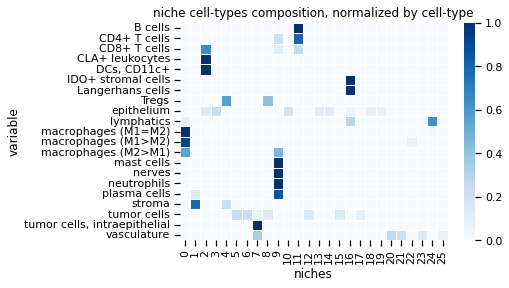

In [389]:
mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types')
title = "niche cell-types composition, normalized by total # cells"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types', normalize='niche')
title = "niche cell-types composition, normalized by niche"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types', normalize='obs')
title = "niche cell-types composition, normalized by cell-type"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

In [390]:
cluster_params = {
    'reducer_type': 'umap', 
    'n_neighbors': 200, 
    'metric': 'euclidean', 
    'min_dist': 0.0,
    'clusterer_type': 'leiden', 
    'dim_clust': 2, 
    'k_cluster': 15, 
    'resolution_parameter': 0.05,
}

cluster_labels, cluster_dir, nb_clust, _ = mosna.get_clusterer(var_aggreg, nas_dir, **cluster_params)
niches = cluster_labels

Performing clustering
Computing dimensionality reduction
Found 21 clusters


Loading reducer object and reduced coordinates


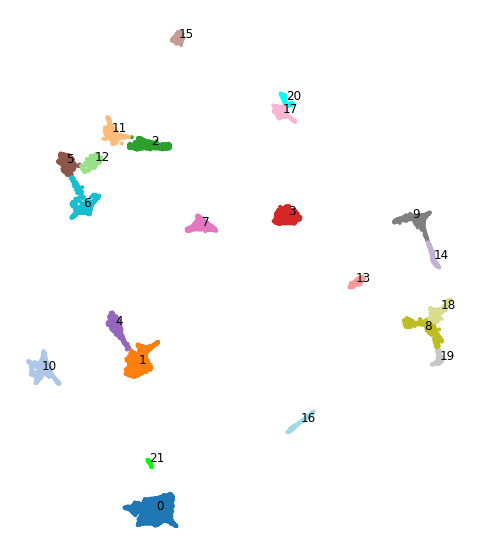

In [391]:
embed_viz, _ = mosna.get_reducer(var_aggreg, nas_dir, reducer_type='umap', n_neighbors=cluster_params['n_neighbors'])
fig, ax, niches_color_mapper = mosna.plot_clusters(embed_viz, cluster_labels, nas_dir, cluster_params=cluster_params, return_cmap=True)

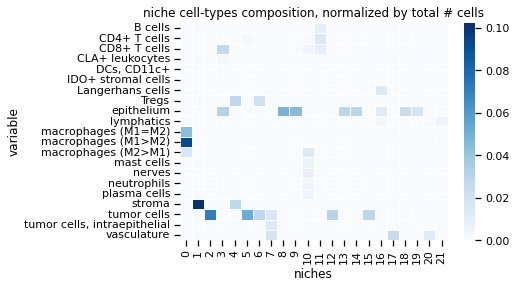

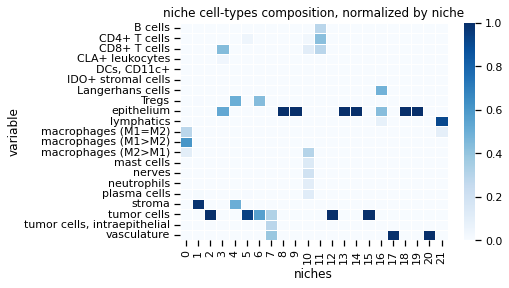

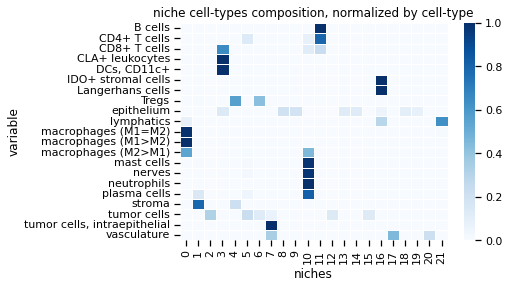

In [392]:
mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types')
title = "niche cell-types composition, normalized by total # cells"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types', normalize='niche')
title = "niche cell-types composition, normalized by niche"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types', normalize='obs')
title = "niche cell-types composition, normalized by cell-type"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

### On markers, order 3

In [394]:
order = 3
nas_dir = reconst_dir / f"nas_on-{var_type}_stats-{stat_names}_order-{order}"    
if not os.path.exists(nas_dir):
    os.makedirs(nas_dir)

edges_all = pd.read_csv(reconst_dir/ 'sample_all-edges.csv')
pairs = edges_all.iloc[:, :2].values

file_path = nas_dir / f'aggregation_statistics.csv'
if file_path.is_file():
    print("Loading Neighbors Aggregation Statistics file")
    var_aggreg = pd.read_csv(file_path)
else:
    print("Computing Neighbors Aggregation Statistics")
    var_aggreg = mosna.aggregate_k_neighbors(
        X=X_clr,
        pairs=pairs,
        order=order,
        var_names=aggreg_vars,
        stat_funcs=np.mean,
        stat_names='mean',
    )
    var_aggreg.to_csv(file_path, index=False)

Computing Neighbors Aggregation Statistics


In [395]:
embedding, reducer = mosna.get_reducer(
    data=var_aggreg, 
    save_dir=nas_dir,
    reducer_type='umap', 
    n_neighbors=15, 
    metric='euclidean', 
    min_dist=0.0,
    )

Computing dimensionality reduction


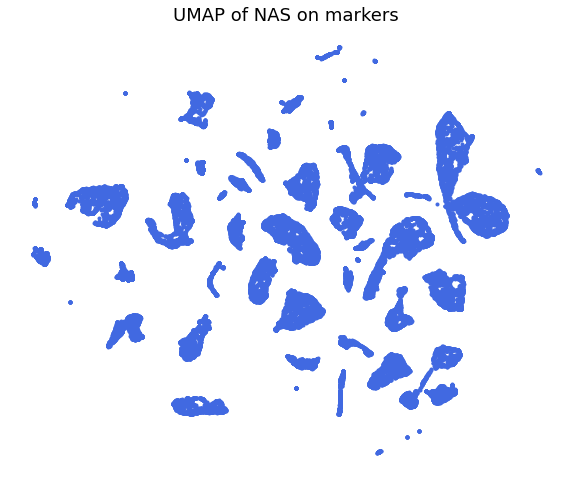

In [396]:
mosna.plot_clusters(embedding)
title = f"UMAP of NAS on {var_type}"
plt.title(title, fontsize=18);

In [397]:
cluster_params = {
    'reducer_type': 'umap', 
    'n_neighbors': 75, 
    'metric': 'euclidean', 
    'min_dist': 0.0,
    'clusterer_type': 'leiden', 
    'dim_clust': 2, 
    'k_cluster': 15, 
    'resolution_parameter': 0.05,
}

cluster_labels, cluster_dir, nb_clust, _ = mosna.get_clusterer(var_aggreg, nas_dir, **cluster_params)
niches = cluster_labels

Performing clustering
Computing dimensionality reduction
Found 29 clusters


Loading reducer object and reduced coordinates


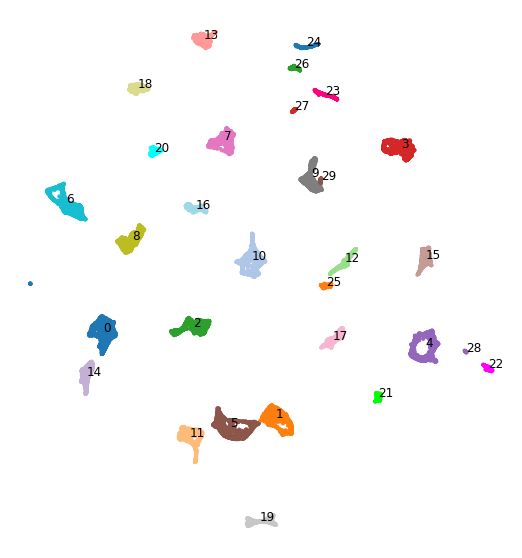

In [398]:
embed_viz, _ = mosna.get_reducer(var_aggreg, nas_dir, reducer_type='umap', n_neighbors=cluster_params['n_neighbors'])
fig, ax, niches_color_mapper = mosna.plot_clusters(embed_viz, cluster_labels, nas_dir, cluster_params=cluster_params, return_cmap=True)

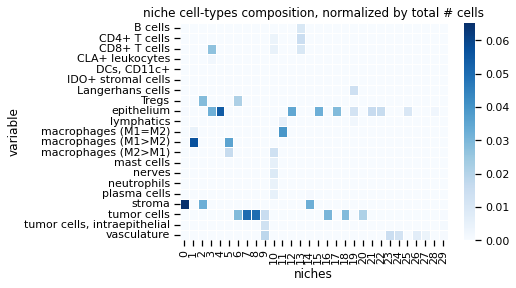

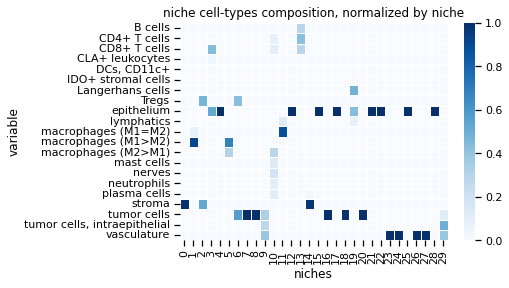

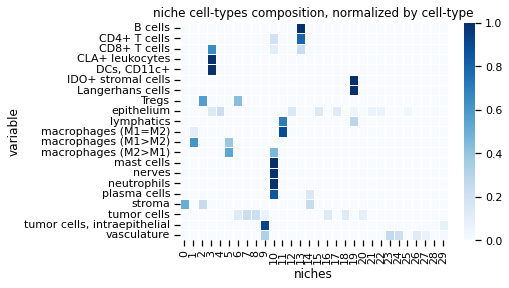

In [399]:
mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types')
title = "niche cell-types composition, normalized by total # cells"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types', normalize='niche')
title = "niche cell-types composition, normalized by niche"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types', normalize='obs')
title = "niche cell-types composition, normalized by cell-type"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

In [400]:
cluster_params = {
    'reducer_type': 'umap', 
    'n_neighbors': 200, 
    'metric': 'euclidean', 
    'min_dist': 0.0,
    'clusterer_type': 'leiden', 
    'dim_clust': 2, 
    'k_cluster': 15, 
    'resolution_parameter': 0.05,
}

cluster_labels, cluster_dir, nb_clust, _ = mosna.get_clusterer(var_aggreg, nas_dir, **cluster_params)
niches = cluster_labels

Performing clustering
Computing dimensionality reduction
Found 28 clusters


Loading reducer object and reduced coordinates


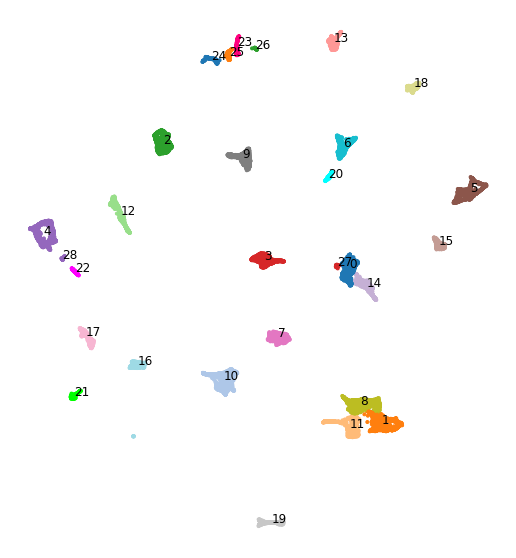

In [401]:
embed_viz, _ = mosna.get_reducer(var_aggreg, nas_dir, reducer_type='umap', n_neighbors=cluster_params['n_neighbors'])
fig, ax, niches_color_mapper = mosna.plot_clusters(embed_viz, cluster_labels, nas_dir, cluster_params=cluster_params, return_cmap=True)

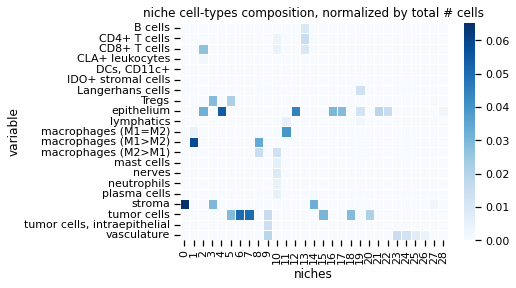

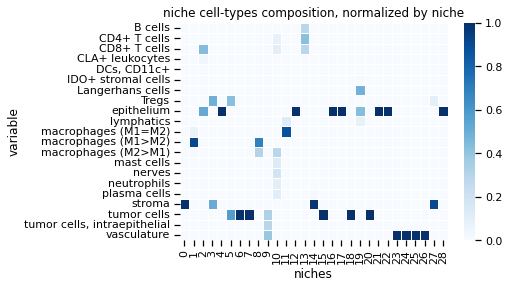

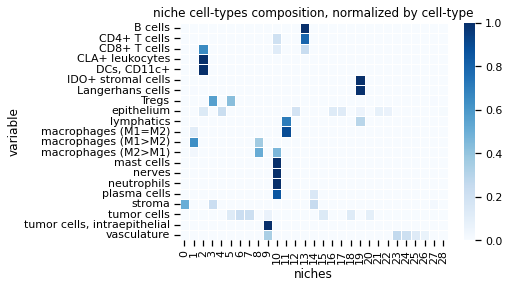

In [402]:
mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types')
title = "niche cell-types composition, normalized by total # cells"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types', normalize='niche')
title = "niche cell-types composition, normalized by niche"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types', normalize='obs')
title = "niche cell-types composition, normalized by cell-type"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')